#### **Building a BrainAge Model**

BrainAge models have become a widely used tool to investigate the rate of brain
maturation. Those models rely on predicting the brain age using MRI features, then
extracting the difference between the predicted age and chronological age resulting
in a biomarker called BrainAgeGap (BAG).

This notebook will generate brainAge models using the [XGBoost](https://xgboost.readthedocs.io/en/stable/index.html) python
package, apply bias correction on the resulting prediction according to [Beheshti _et al_, 2019](https://doi.org/10.1016/j.nicl.2019.102063) [[1]](#1), and evaluate model's performance on the remaining test data. Models will be trained using 50% of
the ABCD dataset (ensuring that related participants are not split between train and test sets) while the remaining
50% will be used for testing. Model's hyperparameters will be selected using a [BayesSearchCV](https://scikit-optimize.github.io/dev/auto_examples/sklearn-gridsearchcv-replacement.html) with 5-fold cross-validation.

The parcellation used to extract brain features is the BrainnetomeChild atlas [[2]](#2). To assess the maturation rate of specific brain regions, we will build independant models including those regions of the BrainnetomeChild atlas:

1. **Whole brain** (227 regions)
2. **Subcortical/Cerebellar** (39 regions)
3. **Frontal** (66 regions)
4. **Temporal** (52 regions)
5. **Parietal** (36 regions)
6. **Insular** (6 regions)
7. **Limbic** (10 regions)
8. **Occipital** (18 regions)

**The first section of this notebook will perform the training and evaluation of the different models, while the second section will apply the model on the data to generate the BrainAgeGap (BAG) to use in further analyses.**

**References** \
<a id=#1>[1]</a> Iman Beheshti, Scott Nugent, Olivier Potvin, Simon Duchesne, Bias-adjustment in neuroimaging-based brain age frameworks: A robust scheme, NeuroImage: Clinical, Volume 24, 2019, 102063, ISSN 2213-1582, https://doi.org/10.1016/j.nicl.2019.102063 \
<a id=#2>[2]</a> Li, W., Fan, L., Shi, W., Lu, Y., Li, J., Luo, N., Wang, H., Chu, C., Ma, L., Song, M., Li, K., Cheng, L., Cao, L., & Jiang, T. (2023). Brainnetome atlas of preadolescent children based on anatomical connectivity profiles. Cerebral Cortex, 33(9), 5264–5275. https://doi.org/10.1093/cercor/bhac415



In [ ]:
# Imports
import os

import dill as pickle
import matplotlib.pyplot as plt
from matplotlib import font_manager
import numpy as np
import pandas as pd
import scipy
from scipy.stats import gaussian_kde
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import mean_absolute_error, mean_squared_log_error, explained_variance_score
from sklearn.preprocessing import scale
from skopt import BayesSearchCV
from skopt.space import Real, Integer
import xgboost as xgb

In [25]:
# Setting up data and output paths.
repository_dir = "~/code/Gagnon_BrainAge_2025/"
data_abcd = "/Volumes/T7/BrainProfilesAssociations/ABCD/"
output_folder = "/Volumes/T7/BrainAgeStudy/"

# Create output folder if it doesn't exist.
output_dir = f"{output_folder}/BrainAge/"
os.makedirs(output_dir, exist_ok=True)

In [26]:
# Fetch Harding font.
font_files = []
for fontpath in font_manager.findSystemFonts(fontpaths=None, fontext='ttf'):
    if "Harding".lower() in fontpath.lower():
        font_files.append(fontpath)
for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

# Set Harding font.
plt.rcParams['font.family'] = 'Harding Text Web'

# Set the Set2 color palette as an iterable.
cmap = sns.color_palette("Set2", 8)

In [54]:
# Compute the bias (as according to Beheshti et al., 2019)
def compute_bias(y_true, y_pred):
    """
    Compute the bias between the true and predicted values.
    """
    chronological_age = np.asarray(y_true).reshape(-1, 1)
    predicted_age = np.asarray(y_pred)

    bag = predicted_age - chronological_age.flatten()

    return LinearRegression().fit(chronological_age, bag)

def compute_bias_Cole2018(y_true, y_pred):
    """
    Compute the bias between the true and predicted values as per Cole et al., 2018.

    Corr Predicted age = (Predicted age - beta) / alpha
    """
    chronological_age = np.asarray(y_true).reshape(-1, 1)
    predicted_age = np.asarray(y_pred)

    return LinearRegression().fit(chronological_age, predicted_age)

    

#### **Preparing the data.**

Before building the models, the following cells will load the harmonized tabulated data for volume,
thickness, and surface area. Since each region could have all three measure, we will append either
_vol, _thick, or _area to provide some kind of indication.

Since prior studies (Dehestani _et al_, 2023)[[1]](#1) suggested confounding effects from family related factors, we
include the family ID in the final dataframe. This family ID will be used to ensure participants with the same family ID
are not separated between the training and testing sets.

**References** \
<a id=#1>[1]</a> Niousha Dehestani, Sarah Whittle, Nandita Vijayakumar, Timothy J. Silk, Developmental brain changes during puberty and associations with mental health problems, Developmental Cognitive Neuroscience, Volume 60, 2023, 101227, ISSN 1878-9293, https://doi.org/10.1016/j.dcn.2023.101227.


In [5]:
# Load the three datasets (vol, surface, and thickness).
vol = pd.read_csv(f"{output_folder}/Harmonization/ABCD_harmonized_vol_reformatted.csv")
thick = pd.read_csv(f"{output_folder}/Harmonization/ABCD_harmonized_thickness_reformatted.csv")
area = pd.read_csv(f"{output_folder}/Harmonization/ABCD_harmonized_area_reformatted.csv")

# Loading up family_id from data release 5.1.
lt_path = "/Volumes/T7/CCPM/ABCD/Release_5.1/abcd-data-release-5.1/core/abcd-general/abcd_y_lt.csv"
lt = pd.read_csv(lt_path)

# Keep only baseline data.
lt = lt[lt["eventname"] == "baseline_year_1_arm_1"]

# IDs in MRI data are tagged with the id as sub-NDARINVXXXXXXX, so let's remove the '_' and add the 'sub-' prefix.
lt["src_subject_id"] = lt["src_subject_id"].str.replace("_", "")
lt["src_subject_id"] = "sub-" + lt["src_subject_id"]

# Keep only the columns we need.
lt = lt[["src_subject_id", "rel_family_id"]]
lt.columns = ["sid", "family_id"]

# Before merging, assert that every ids in MRI data are in the family_id data.
assert vol["sid"].isin(lt["sid"]).all(), "Some IDs in vol are not in lt."
assert thick["sid"].isin(lt["sid"]).all(), "Some IDs in thick are not in lt."
assert area["sid"].isin(lt["sid"]).all(), "Some IDs in area are not in lt."

# Merge family_id with the MRI data.
vol = vol.merge(lt, on="sid", how="left")
thick = thick.merge(lt, on="sid", how="left")
area = area.merge(lt, on="sid", how="left")

# Reorder the columns to have the family_id next to the sid.
vol = vol[["sid", "family_id"] + [col for col in vol.columns if col not in ["sid", "family_id"]]]
thick = thick[["sid", "family_id"] + [col for col in thick.columns if col not in ["sid", "family_id"]]]
area = area[["sid", "family_id"] + [col for col in area.columns if col not in ["sid", "family_id"]]]

# Set the family_id as string and drop the trailing '.0'.
vol["family_id"] = vol["family_id"].astype(str).replace(".0", "", regex=True)
thick["family_id"] = thick["family_id"].astype(str).replace(".0", "", regex=True)
area["family_id"] = area["family_id"].astype(str).replace(".0", "", regex=True)

# Load up the diagnosis data.
dx = pd.read_excel(f"{output_folder}/ABCD/abcd_dx_labels.xlsx")

# Create a new column for PSYPATHO if at least one column is equal to 1.
dx["PSYPATHO"] = dx.iloc[:, 1:].apply(lambda x: 1 if (x == 1).any() else 0, axis=1)

# Keep only the ID columns and PSYPATHO.
dx = dx[["subjectkey", "AD", "ADHD", "CD", "OCD", "ODD", "DD", "PSYPATHO"]]
dx["subjectkey"] = dx["subjectkey"].str.replace("_", "")
dx["subjectkey"] = "sub-" + dx["subjectkey"]
dx.columns = ["sid", "AD", "ADHD", "CD", "OCD", "ODD", "DD", "PSYPATHO"]

# Assess which id from the vol data is missing in the dx data.
missing_vol = vol[~vol["sid"].isin(dx["sid"])]
if not missing_vol.empty:
    print("Missing IDs in vol data that are not in dx data:")
    print("Length of missing IDs:", len(missing_vol))

# Add the missing dx IDs to the dx dataframe with PSYPATHO set to 0. (don't use append, as it is deprecated)
for missing_id in missing_vol["sid"].unique():
    dx = pd.concat([dx, pd.DataFrame({"sid": [missing_id], "PSYPATHO": [0]})], ignore_index=True)

# Before merging, assert that every ids in MRI data are in the diagnosis data.
assert vol["sid"].isin(dx["sid"]).all(), "Some IDs in vol are not in dx."
assert thick["sid"].isin(dx["sid"]).all(), "Some IDs in thick are not in dx."
assert area["sid"].isin(dx["sid"]).all(), "Some IDs in area are not in dx."

# Merge the diagnosis data with the MRI data.
vol = vol.merge(dx[["sid", "PSYPATHO"]], on="sid", how="left")
thick = thick.merge(dx[["sid", "PSYPATHO"]], on="sid", how="left")
area = area.merge(dx[["sid", "PSYPATHO"]], on="sid", how="left")

# Reorder the columns to have the PSYPATHO next to the sid.
vol = vol[["sid", "PSYPATHO", "family_id"] + [col for col in vol.columns if col not in ["sid", "PSYPATHO", "family_id"]]]
thick = thick[["sid", "PSYPATHO", "family_id"] + [col for col in thick.columns if col not in ["sid", "PSYPATHO", "family_id"]]]
area = area[["sid", "PSYPATHO", "family_id"] + [col for col in area.columns if col not in ["sid", "PSYPATHO", "family_id"]]]

/var/folders/23/p0fh1nrd473dtfz3cx_4g0j00000gn/T/ipykernel_32224/2330659864.py:8: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  lt = pd.read_csv(lt_path)


Missing IDs in vol data that are not in dx data:
Length of missing IDs: 129


In [6]:
subcortical_col = ['GP_L', 'GP_R', 'NAC_L', 'NAC_R',
    'Otha_L', 'Otha_R', 'PPtha_L', 'PPtha_R', 'Stha_L', 'Stha_R',
    'brainstem', 'cHipp_L', 'cHipp_R', 'cTtha_L', 'cTtha_R', 'dCa_L', 'dCa_R',
    'dlPu_L', 'dlPu_R', 'lAmyg_L', 'lAmyg_R', 'lPFtha_L', 'lPFtha_R',
    'left_cerebellum_cortex', 'mAmyg_L', 'mAmyg_R', 'mPFtha_L', 'mPFtha_R',
    'mPMtha_L', 'mPMtha_R', 'rHipp_L', 'rHipp_R', 'rTtha_L', 'rTtha_R',
    'right_cerebellum_cortex', 'vCa_L', 'vCa_R', 'vmPu_L', 'vmPu_R']
frontal_col = ['SFG_L_6_1', 'SFG_L_6_2', 'SFG_L_6_3', 'SFG_L_6_4', 'SFG_L_6_5',
               'SFG_L_6_6', 'SFG_R_6_1', 'SFG_R_6_2', 'SFG_R_6_3', 'SFG_R_6_4',
               'SFG_R_6_5', 'SFG_R_6_6', 'MFG_L_7_1', 'MFG_L_7_2', 'MFG_L_7_3',
               'MFG_L_7_4', 'MFG_L_7_5', 'MFG_L_7_6', 'MFG_L_7_7', 'MFG_R_7_1',
               'MFG_R_7_2', 'MFG_R_7_3', 'MFG_R_7_4', 'MFG_R_7_5', 'MFG_R_7_6',
               'MFG_R_7_7', 'IFG_L_6_1', 'IFG_L_6_2', 'IFG_L_6_3', 'IFG_L_6_4',
               'IFG_L_6_5', 'IFG_L_6_6', 'IFG_R_6_1', 'IFG_R_6_2', 'IFG_R_6_3',
               'IFG_R_6_4', 'IFG_R_6_5', 'IFG_R_6_6', 'OrG_L_6_1', 'OrG_L_6_2',
               'OrG_L_6_3', 'OrG_L_6_4', 'OrG_L_6_5', 'OrG_L_6_6', 'OrG_R_6_1',
               'OrG_R_6_2', 'OrG_R_6_3', 'OrG_R_6_4', 'OrG_R_6_5', 'OrG_R_6_6',
               'PrG_L_6_1', 'PrG_L_6_2', 'PrG_L_6_3', 'PrG_L_6_4', 'PrG_L_6_5',
               'PrG_L_6_6', 'PrG_R_6_1', 'PrG_R_6_2', 'PrG_R_6_3', 'PrG_R_6_4',
               'PrG_R_6_5', 'PrG_R_6_6', 'PCL_L_2_1', 'PCL_L_2_2', 'PCL_R_2_1',
               'PCL_R_2_2']
temporal_col = ['STG_L_6_1', 'STG_L_6_2', 'STG_L_6_3', 'STG_L_6_4', 'STG_L_6_5',
                'STG_L_6_6', 'STG_R_6_1', 'STG_R_6_2', 'STG_R_6_3', 'STG_R_6_4',
                'STG_R_6_5', 'STG_R_6_6', 'MTG_L_4_1', 'MTG_L_4_2', 'MTG_L_4_3',
                'MTG_L_4_4', 'MTG_R_4_1', 'MTG_R_4_2', 'MTG_R_4_3', 'MTG_R_4_4',
                'ITG_L_5_1', 'ITG_L_5_2', 'ITG_L_5_3', 'ITG_L_5_4', 'ITG_L_5_5',
                'ITG_R_5_1', 'ITG_R_5_2', 'ITG_R_5_3', 'ITG_R_5_4', 'ITG_R_5_5',
                'FuG_L_3_1', 'FuG_L_3_2', 'FuG_L_3_3', 'FuG_R_3_1', 'FuG_R_3_2',
                'FuG_R_3_3', 'PhG_L_6_1', 'PhG_L_6_2', 'PhG_L_6_3', 'PhG_L_6_4',
                'PhG_L_6_5', 'PhG_L_6_6', 'PhG_R_6_1', 'PhG_R_6_2', 'PhG_R_6_3',
                'PhG_R_6_4', 'PhG_R_6_5', 'PhG_R_6_6', 'pSTS_L_2_1', 'pSTS_L_2_2',
                'pSTS_R_2_1', 'pSTS_R_2_2']
parietal_col = ['SPL_L_4_1', 'SPL_L_4_2', 'SPL_L_4_3', 'SPL_L_4_4', 'SPL_R_4_1', 'SPL_R_4_2', 'SPL_R_4_3',
                'SPL_R_4_4', 'IPL_L_6_1', 'IPL_L_6_2', 'IPL_L_6_3', 'IPL_L_6_4', 'IPL_L_6_5', 'IPL_L_6_6',
                'IPL_R_6_1', 'IPL_R_6_2', 'IPL_R_6_3', 'IPL_R_6_4', 'IPL_R_6_5', 'IPL_R_6_6',
                'PCun_L_4_1', 'PCun_L_4_2', 'PCun_L_4_3', 'PCun_L_4_4', 'PCun_R_4_1',
                'PCun_R_4_2', 'PCun_R_4_3', 'PCun_R_4_4', 'PoG_L_4_1', 'PoG_L_4_2',
                'PoG_L_4_3', 'PoG_L_4_4', 'PoG_R_4_1', 'PoG_R_4_2', 'PoG_R_4_3',
                'PoG_R_4_4']
insular_col = ['INS_L_6_1', 'INS_L_6_2', 'INS_L_6_3', 'INS_R_6_1', 'INS_R_6_2', 'INS_R_6_3']
limbic_col = ['CG_L_5_1', 'CG_L_5_2', 'CG_L_5_3', 'CG_L_5_4', 'CG_L_5_5',
               'CG_R_5_1', 'CG_R_5_2', 'CG_R_5_3', 'CG_R_5_4', 'CG_R_5_5']
occipital_col = ['MVOcC_L_5_1', 'MVOcC_L_5_2', 'MVOcC_L_5_3', 'MVOcC_L_5_4', 'MVOcC_L_5_5',
                 'MVOcC_R_5_1', 'MVOcC_R_5_2', 'MVOcC_R_5_3', 'MVOcC_R_5_4', 'MVOcC_R_5_5',
                 'LOcC_L_4_1', 'LOcC_L_4_2', 'LOcC_L_4_3', 'LOcC_L_4_4', 'LOcC_R_4_1',
                 'LOcC_R_4_2', 'LOcC_R_4_3', 'LOcC_R_4_4']

# Print the number of regions per category.
print(f"Subcortical: {len(subcortical_col)} features")
print(f"Frontal: {len(frontal_col)} features")
print(f"Temporal: {len(temporal_col)} features")
print(f"Parietal: {len(parietal_col)} features")
print(f"Insular: {len(insular_col)} features")
print(f"Limbic: {len(limbic_col)} features")
print(f"Occipital: {len(occipital_col)} features")

# Assert that all categories total 227.
assert len(subcortical_col) + len(frontal_col) + len(temporal_col) + len(parietal_col) + len(insular_col) + len(limbic_col) + len(occipital_col) == len(vol.columns[7:]), f"Total number of regions is not {len(vol.columns[7:])}."

Subcortical: 39 features
Frontal: 66 features
Temporal: 52 features
Parietal: 36 features
Insular: 6 features
Limbic: 10 features
Occipital: 18 features


In [7]:
# Append the dataset measure to regions in columns names.
vol.columns = [f"{col}_vol" if col not in ["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"] else col for col in vol.columns]
thick.columns = [f"{col}_thick" if col not in ["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"] else col for col in thick.columns]
area.columns = [f"{col}_area" if col not in ["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"] else col for col in area.columns]

# Merge the three datasets on 'sid', 'site', 'age', and 'handedness'.
df = vol.merge(thick, on=["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"], how="inner")
df = df.merge(area, on=["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"], how="inner")

# Print out the number of features (regions) in the dataset.
print(f"Number of features (regions): {len(df.columns) - 7}")
# Print out the number of subjects in the dataset.
print(f"Number of subjects: {len(df)}")

# Save the dataset.
df.to_csv(f"{output_dir}/ABCDWholeBrain.csv", index=False)

Number of features (regions): 603
Number of subjects: 9074


#### **Building the whole-brain model**

The following next few cells will train and evaluate the whole-brain model (totalling 603 brain features). In addition, this model will validate the sampling technique, ensuring that we do not have two participants with the same family ID in the training and test sets, and have similar age distribution.

Furthermore, we assessed the bias of age prediction and evaluate the implemented bias correction method from [Beheshti _et al_, 2019](https://doi.org/10.1016/j.nicl.2019.102063) [[1]](#1). Figures will include the performance prior to bias correction and following bias correction.

**References** \
<a id=#1>[1]</a> Iman Beheshti, Scott Nugent, Olivier Potvin, Simon Duchesne, Bias-adjustment in neuroimaging-based brain age frameworks: A robust scheme, NeuroImage: Clinical, Volume 24, 2019, 102063, ISSN 2213-1582, https://doi.org/10.1016/j.nicl.2019.102063

In [8]:
# Remove all participants with PSYPATHO == 1 (i.e., those with a psychiatric diagnosis).
psypatho = df[df["PSYPATHO"] == 1].sid
df = df[df["PSYPATHO"] != 1]
print(f"Number of subjects after removing psychiatric diagnoses: {len(df)}")

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx, test_idx = next(gss.split(df, groups=df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx) + len(test_idx) == len(df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(df["family_id"].iloc[train_idx]).intersection(set(df["family_id"].iloc[test_idx]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train = df.iloc[train_idx]
y_train = pd.DataFrame(df.iloc[train_idx]["age"], columns=["age"])
X_test = df.iloc[test_idx]
y_test = pd.DataFrame(df.iloc[test_idx]["age"], columns=["age"])

# Get the indices from the X datasets for male/female.
male_train_idx = X_train[X_train["sex"] == 1].index
female_train_idx = X_train[X_train["sex"] == 2].index
male_test_idx = X_test[X_test["sex"] == 1].index
female_test_idx = X_test[X_test["sex"] == 2].index

# Drop the unnecessary columns from the train and test sets.
X_train = X_train.drop(columns=["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"])
X_test = X_test.drop(columns=["sid", "PSYPATHO", "family_id", "site", "age", "sex", "handedness"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train["age"], y_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_train = pd.DataFrame(scale(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scale(X_test), columns=X_test.columns)

Number of subjects after removing psychiatric diagnoses: 6582
Age distributions are not significantly different between train and test sets. 0.14133814431799174


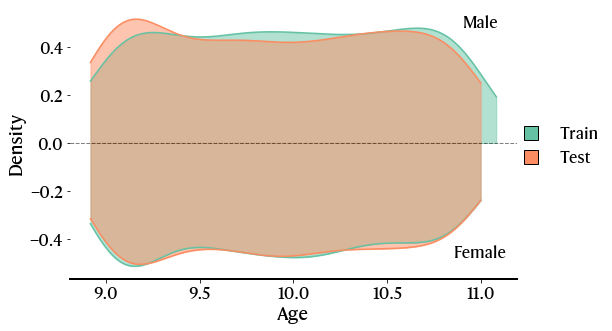

In [9]:
# View distribution of age in train and test sets as a density plot using seaborn.
fig, ax = plt.subplots(figsize=(8, 5))

# Compute KDE for age in train and test sets.
kde_male_train = gaussian_kde(y_train.loc[male_train_idx, "age"] / 12, bw_method=0.3)
x_train_male = np.linspace(y_train.loc[male_train_idx, "age"].min() / 12, y_train.loc[male_train_idx, "age"].max() / 12, 1000)
y_train_male = kde_male_train(x_train_male)

kde_female_train = gaussian_kde(y_train.loc[female_train_idx, "age"] / 12, bw_method=0.3)
x_train_female = np.linspace(y_train.loc[female_train_idx, "age"].min() / 12, y_train.loc[female_train_idx, "age"].max() / 12, 1000)
y_train_female = kde_female_train(x_train_female)

# Now for the test set.
kde_male_test = gaussian_kde(y_test.loc[male_test_idx, "age"] / 12, bw_method=0.3)
x_test_male = np.linspace(y_test.loc[male_test_idx, "age"].min() / 12, y_test.loc[male_test_idx, "age"].max() / 12, 1000)
y_test_male = kde_male_test(x_test_male)

kde_female_test = gaussian_kde(y_test.loc[female_test_idx, "age"] / 12, bw_method=0.3)
x_test_female = np.linspace(y_test.loc[female_test_idx, "age"].min() / 12, y_test.loc[female_test_idx, "age"].max() / 12, 1000)
y_test_female = kde_female_test(x_test_female)

# Male train and test sets.
ax.plot(x_train_male, y_train_male, label="Train", color=cmap[0])
ax.plot(x_test_male, y_test_male, label="Test", color=cmap[1])
ax.fill_between(x_train_male, y_train_male, color=cmap[0], alpha=0.5, label="Train")
ax.fill_between(x_test_male, y_test_male, color=cmap[1], alpha=0.5, label="Test")

# Female train and test sets.
ax.plot(x_train_female, -y_train_female, label="Train", color=cmap[0])
ax.plot(x_test_female, -y_test_female, label="Test", color=cmap[1])
ax.fill_between(x_train_female, -y_train_female, color=cmap[0], alpha=0.5, label="Train")
ax.fill_between(x_test_female, -y_test_female, color=cmap[1], alpha=0.5, label="Test")

# plt.title("Age distribution in train and test sets")
plt.xlabel("Age", fontdict={"size": 18})
plt.ylabel("Density", fontsize=18)
ax.spines[['top', 'right', "left"]].set_visible(False)
ax.spines[["bottom"]].set_linewidth(2)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.axhline(0, color='black', linewidth=1, linestyle='--', alpha=0.5)

# Create a custom legend to the outside of the plot (right side).
handles = [plt.Line2D([0], [0], color=cmap[j], markersize=14, markeredgewidth=1, marker="s", linewidth=0, markeredgecolor="black") for j in range(2)]
labels = ["Train", "Test"]
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.97, 0.59), fontsize=16, frameon=False)

# Add male to the top right corner, and female to the bottom right corner.
ax.text(11, 0.48, "Male", ha="center", fontsize=16, color="black")
ax.text(11, -0.48, "Female", ha="center", fontsize=16, color="black")
plt.savefig(output_dir + "/age_distribution.png", bbox_inches="tight", dpi=300)

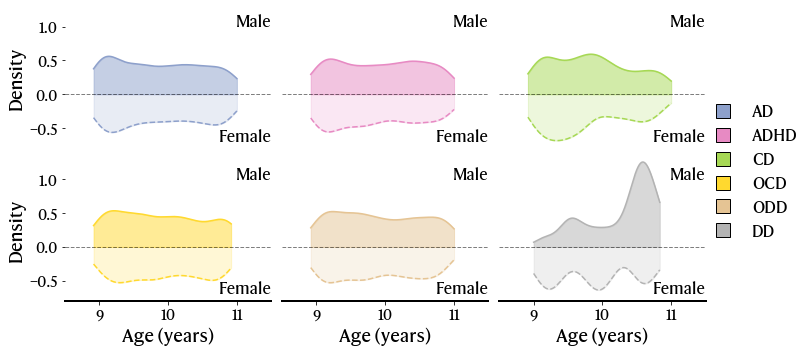

In [10]:
# Plot the age distribution in diagnosis groups.
dx_lab = ["AD", "ADHD", "CD", "OCD", "ODD", "DD"]

# Keep only the participants with brain data in dx dataframe.
dx_dist = dx[dx["sid"].isin(psypatho.to_list())]

# Merge with sex and age information.
dx_dist = dx_dist.merge(vol[["sid", "sex", "age"]], on="sid", how="left")

# Create a figure and axis.
fig, ax = plt.subplots(2, 3, figsize=(10, 5), sharex=False, sharey=False)
# Flatten the axis for easier plotting.
ax = ax.flatten()
# Iterate over the diagnosis groups.
for i, d in enumerate(dx_lab):
    # Get the indices of the diagnosis group.
    dx_idx = dx_dist[dx_dist[d] == 1].index

    # Get male/female indices for the diagnosis group.
    male_dx_idx = dx_dist.loc[dx_idx, "sex"] == 1
    female_dx_idx = dx_dist.loc[dx_idx, "sex"] == 2

    # Get the age of the diagnosis group.
    age_dx = dx_dist.loc[dx_idx, "age"] / 12  # Convert to years.
    
    # Compute KDE for the diagnosis group.
    male_kde_dx = gaussian_kde(age_dx[male_dx_idx], bw_method=0.3)
    female_kde_dx = gaussian_kde(age_dx[female_dx_idx], bw_method=0.3)
    x_dx = np.linspace(age_dx.min(), age_dx.max(), 1000)
    y_dx_male = male_kde_dx(x_dx)
    y_dx_female = female_kde_dx(x_dx)

    # Plot the KDE.
    ax[i].plot(x_dx, y_dx_male, label=d, color=cmap[i+2])
    ax[i].fill_between(x_dx, y_dx_male, color=cmap[i+2], alpha=0.5)
    ax[i].plot(x_dx, -y_dx_female, label=d, color=cmap[i+2], linestyle='--')
    ax[i].fill_between(x_dx, -y_dx_female, color=cmap[i+2], alpha=0.2)

    # Set the title and labels.
    #ax[i].set_title(d, fontsize=14)
    #ax[i].set_xlabel("Age (years)", fontsize=12)
    #ax[i].set_ylabel("Density", fontsize=12)
    ax[i].set_xlim(8.5, 11.5)

    # Customize the axes.
    ax[i].spines[['top', 'right', 'left']].set_visible(False)
    ax[i].spines[['bottom']].set_linewidth(2)
    ax[i].tick_params(axis='both', which='major', labelsize=10)

    # Add male to the top right corner and female to the bottom right corner. (adjust y position based on the density)
    ax[i].text(11.5, 1, "Male", ha="right", fontsize=16, color="black")
    ax[i].text(11.5, -0.5, "Female", ha="right", fontsize=16, va="top", color="black")

    # Add a horizontal line at y=0 for
    ax[i].axhline(0, color='black', linewidth=1, linestyle='--', alpha=0.5)
    ax[i].tick_params(axis='both', labelsize=14)
    ax[i].set_xticks([9, 10, 11])
    ax[i].set_ylim(-0.8, 1.3)
    ax[i].set_yticks([-0.5, 0, 0.5, 1])

    # Remove the bottom spine for the top row
    if i < 3:
        ax[i].spines['bottom'].set_visible(False)
        #Remove the xticks for the top row
        ax[i].set_xticks([])
    else:
        ax[i].spines['bottom'].set_linewidth(2)
        ax[i].set_xlabel("Age (years)", fontsize=18)

    # remove the yticks for the second and third columns.
    if i % 3 != 0:
        ax[i].set_yticks([])
        ax[i].spines['left'].set_visible(False)
    else:
        ax[i].set_ylabel("Density", fontsize=18)

# For some reason, we have to manually remove the xticks for the first row.
for i in range(3):
    ax[i].set_xticks([])

# Custom legend for diagnosis groups.
handles = [plt.Line2D([0], [0], color=cmap[j+2], markersize=14, markeredgewidth=1, marker="s", linewidth=0, markeredgecolor="black") for j in range(len(dx_lab))]
fig.legend(handles, dx_lab, loc='upper center', bbox_to_anchor=(1.05, 0.74), fontsize=16, frameon=False)

plt.tight_layout()
plt.savefig(output_dir + "/age_distribution_diagnosis.png", bbox_inches="tight", dpi=300)

In [11]:
# Build a regression model using XGBoost.
xgb_model = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf = BayesSearchCV(
    xgb_model,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf.fit(X_train, y_train)
# Print the best parameters.
print(f"Best parameters: {clf.best_params_}")
# Print the best score.
print(f"Best score: {clf.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.7787516196703068, gamma=0.017085207521204276, learning_rate=0.07395558684045475, max_depth=4, min_child_weight=1, n_estimators=1023, reg_alpha=8.490602597247668e-05, reg_lambda=0.0049513205881958735, subsample=0.9086106320385622; total time=  22.6s
[CV] END colsample_bytree=0.7787516196703068, gamma=0.017085207521204276, learning_rate=0.07395558684045475, max_depth=4, min_child_weight=1, n_estimators=1023, reg_alpha=8.490602597247668e-05, reg_lambda=0.0049513205881958735, subsample=0.9086106320385622; total time=  22.7s
[CV] END colsample_bytree=0.7787516196703068, gamma=0.017085207521204276, learning_rate=0.07395558684045475, max_depth=4, min_child_weight=1, n_estimators=1023, reg_alpha=8.490602597247668e-05, reg_lambda=0.0049513205881958735, subsample=0.9086106320385622; total time=  22.8s
[CV] END colsample_bytree=0.7787516196703068, gamma=0.017085207521204276, learning_rate=0.07395558684045475, m

In [14]:
# Fitting the model with the best parameeters.
xgb_model = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf.best_params_["n_estimators"],
    max_depth=clf.best_params_["max_depth"],
    gamma=clf.best_params_["gamma"],
    reg_alpha=clf.best_params_["reg_alpha"],
    reg_lambda=clf.best_params_["reg_lambda"],
    learning_rate=clf.best_params_["learning_rate"],
    subsample=clf.best_params_["subsample"],
    colsample_bytree=clf.best_params_["colsample_bytree"],
    min_child_weight=clf.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model.fit(X_train, y_train)

# Predict on the training data.
y_train_pred = xgb_model.predict(X_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_train, y_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_train["age"], y_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_pred = xgb_model.predict(X_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean absolute error: {mae}")

# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_test, y_pred) )
print(f"RMSLE: {rmsle}")

# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_test["age"], y_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model.save_model(f"{output_dir}/brainAgeModelWholeBrain.json")

Mean absolute error on training data: 3.848238945007324
Explained variance score on training data: 0.6284487422270779
Pearson correlation coefficient on training data: 0.8640818936476103
Mean absolute error: 5.984964370727539
RMSLE: 0.05903235427776242
Pearson correlation coefficient: 0.3558791679793593


#### **Permutation Testing to Verify Model Performance vs Chance**

To confirm the model is learning meaningful age-related patterns rather than spurious correlations, we perform permutation testing. We randomly shuffle the age labels and retrain the model multiple times. If our true model significantly outperforms permuted models, this validates that the brain features genuinely predict age.

In [17]:
# Permutation testing
from sklearn.utils import shuffle

print("=" * 80)
print("PERMUTATION TESTING (n=100 permutations)")
print("=" * 80)
print("Testing whether model performance exceeds chance...")
print()

n_permutations = 100
permutation_scores = []

# Use the same train/test split as before
X_train_perm = X_train.copy()
y_train_perm = y_train.copy()
X_test_perm = X_test.copy()
y_test_perm = y_test.copy()

# Get true model performance (already computed)
true_test_r = pearson_corr[0]

print(f"True model test Pearson r: {true_test_r:.4f}")
print()
print("Running permutations (this may take a few minutes)...")

# Train models with permuted labels
for i in range(n_permutations):
    if (i + 1) % 20 == 0:
        print(f"  Completed {i + 1}/{n_permutations} permutations...")
    
    # Randomly shuffle training labels
    y_train_shuffled = shuffle(y_train_perm, random_state=i)
    
    # Train model with best hyperparameters (from original model)
    perm_model = xgb.XGBRegressor(
        n_jobs=4,
        tree_method="hist",
        eval_metric=mean_absolute_error,
        n_estimators=clf.best_params_["n_estimators"],
        max_depth=clf.best_params_["max_depth"],
        gamma=clf.best_params_["gamma"],
        reg_alpha=clf.best_params_["reg_alpha"],
        reg_lambda=clf.best_params_["reg_lambda"],
        learning_rate=clf.best_params_["learning_rate"],
        subsample=clf.best_params_["subsample"],
        colsample_bytree=clf.best_params_["colsample_bytree"],
        min_child_weight=clf.best_params_["min_child_weight"],
    )
    
    perm_model.fit(X_train_perm, y_train_shuffled)
    
    # Evaluate on test set
    y_pred_perm = perm_model.predict(X_test_perm)
    perm_r = scipy.stats.pearsonr(y_test_perm["age"], y_pred_perm)[0]
    permutation_scores.append(perm_r)

# Calculate p-value
permutation_scores = np.array(permutation_scores)
p_value = (np.sum(permutation_scores >= true_test_r) + 1) / (n_permutations + 1)

print()
print("=" * 80)
print("PERMUTATION TEST RESULTS")
print("=" * 80)
print(f"True model Pearson r:          {true_test_r:.4f}")
print(f"Mean permuted r:               {permutation_scores.mean():.4f} ± {permutation_scores.std():.4f}")
print(f"Max permuted r:                {permutation_scores.max():.4f}")
print(f"p-value (permutation test):    {p_value:.4f}")
print()
if p_value < 0.05:
    print("✓ Model significantly outperforms chance (p < 0.05)")
else:
    print("✗ WARNING: Model does not significantly outperform chance!")
print("=" * 80)

PERMUTATION TESTING (n=100 permutations)
Testing whether model performance exceeds chance...

True model test Pearson r: 0.3559

Running permutations (this may take a few minutes)...
  Completed 20/100 permutations...
  Completed 40/100 permutations...
  Completed 60/100 permutations...
  Completed 80/100 permutations...
  Completed 100/100 permutations...

PERMUTATION TEST RESULTS
True model Pearson r:          0.3559
Mean permuted r:               -0.0018 ± 0.0341
Max permuted r:                0.0709
p-value (permutation test):    0.0099

✓ Model significantly outperforms chance (p < 0.05)


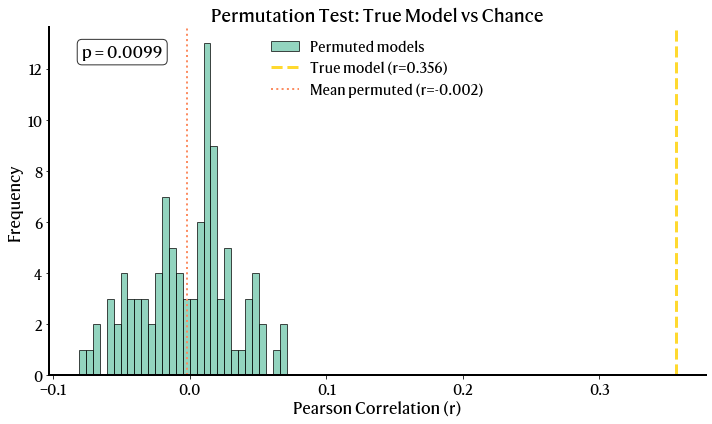

In [18]:
# Visualize permutation test results
fig, ax = plt.subplots(figsize=(10, 6))

# Plot histogram of permuted scores
ax.hist(permutation_scores, bins=30, alpha=0.7, color=cmap[0], edgecolor='black', label='Permuted models')

# Add vertical line for true score
ax.axvline(true_test_r, color=cmap[5], linestyle='--', linewidth=3, label=f'True model (r={true_test_r:.3f})')

# Add vertical line for mean permuted score
ax.axvline(permutation_scores.mean(), color=cmap[1], linestyle=':', linewidth=2, 
           label=f'Mean permuted (r={permutation_scores.mean():.3f})')

ax.set_xlabel('Pearson Correlation (r)', fontsize=16)
ax.set_ylabel('Frequency', fontsize=16)
ax.set_title('Permutation Test: True Model vs Chance', fontsize=18)
ax.legend(fontsize=14, frameon=False)
ax.spines[['top', 'right']].set_visible(False)
ax.spines[['bottom', 'left']].set_linewidth(2)
ax.tick_params(axis='both', which='major', labelsize=14)

# Add p-value text
ax.text(0.05, 0.95, f'p = {p_value:.4f}', 
        transform=ax.transAxes, fontsize=16,
        verticalalignment='top', 
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig(f"{output_dir}/permutation_test_wholeBrain.png", dpi=300, bbox_inches="tight")
plt.show()

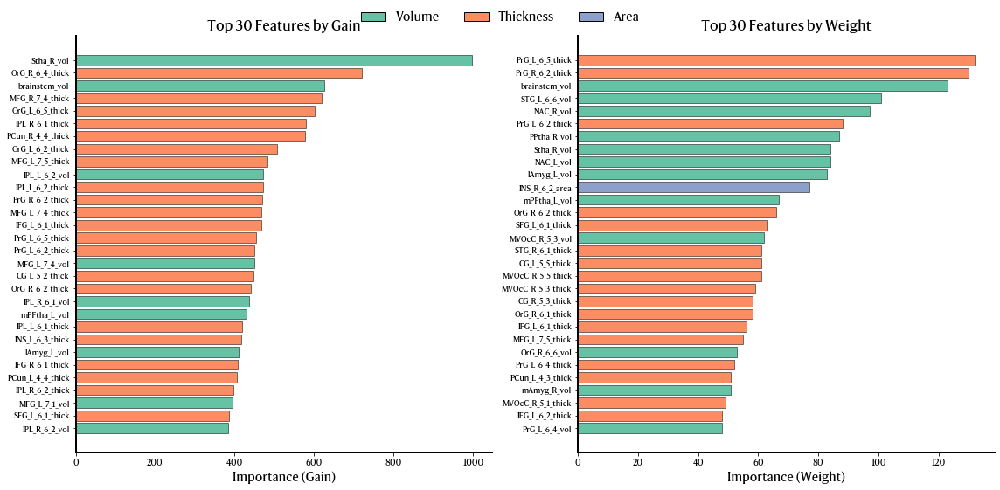

In [53]:
# Get feature importance by weight (frequency of use in splits)
feature_importance_weight = xgb_model.get_booster().get_score(importance_type='weight')
feature_importance_weight_df = pd.DataFrame({
    'feature': list(feature_importance_weight.keys()),
    'importance_weight': list(feature_importance_weight.values())
}).sort_values('importance_weight', ascending=False)

# Get feature importance by gain (average improvement in loss)
feature_importance_gain = xgb_model.get_booster().get_score(importance_type='gain')
feature_importance_gain_df = pd.DataFrame({
    'feature': list(feature_importance_gain.keys()),
    'importance_gain': list(feature_importance_gain.values())
}).sort_values('importance_gain', ascending=False)

# Create comprehensive feature importance visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1: Top 30 by gain
top_30_gain = feature_importance_gain_df.head(30).copy()
top_30_gain['color'] = top_30_gain['feature'].apply(
    lambda x: cmap[0] if '_vol' in x else (cmap[1] if '_thick' in x else cmap[2])
)

axes[0].barh(range(30), top_30_gain['importance_gain'].values, 
             color=top_30_gain['color'].values, edgecolor='black', linewidth=0.5)
axes[0].set_yticks(range(30))
axes[0].set_yticklabels(top_30_gain['feature'].values, fontsize=9)
axes[0].set_xlabel('Importance (Gain)', fontsize=14)
axes[0].set_title('Top 30 Features by Gain', fontsize=16)
axes[0].invert_yaxis()
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].spines[['bottom', 'left']].set_linewidth(2)

# Plot 2: Top 30 by weight
top_30_weight = feature_importance_weight_df.head(30).copy()
top_30_weight['color'] = top_30_weight['feature'].apply(
    lambda x: cmap[0] if '_vol' in x else (cmap[1] if '_thick' in x else cmap[2])
)

axes[1].barh(range(30), top_30_weight['importance_weight'].values, 
             color=top_30_weight['color'].values, edgecolor='black', linewidth=0.5)
axes[1].set_yticks(range(30))
axes[1].set_yticklabels(top_30_weight['feature'].values, fontsize=9)
axes[1].set_xlabel('Importance (Weight)', fontsize=14)
axes[1].set_title('Top 30 Features by Weight', fontsize=16)
axes[1].invert_yaxis()
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].spines[['bottom', 'left']].set_linewidth(2)

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=cmap[0], edgecolor='black', label='Volume'),
    Patch(facecolor=cmap[1], edgecolor='black', label='Thickness'),
    Patch(facecolor=cmap[2], edgecolor='black', label='Area')
]
fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.98), 
           ncol=3, fontsize=14, frameon=False)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(f"{output_dir}/feature_importance_detailed_wholeBrain.png", dpi=300, bbox_inches="tight")
plt.show()

In [58]:
# Compute the bias using the training data.
mod = compute_bias(y_train, y_train_pred)

# Alternative method by Cole et al. 2018
mod_cole = compute_bias_Cole2018(y_train, y_train_pred)

# Apply the bias to the test data.
y_pred_corrected = y_pred - mod.predict(y_test["age"].values.reshape(-1, 1))

# Bias correct from Cole et al. 2018
y_pred_corrected_cole = (y_pred - mod_cole.intercept_) / mod_cole.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/wholeBrainBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod, f)

# Save the model for Cole correction.
with open(f"{output_dir}/wholeBrainBiasCorrectionModelCole2018.pkl", "wb") as f:
    pickle.dump(mod_cole, f)

# Compute the mean absolute error.
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)
print(f"Mean absolute error (corrected): {mae_corrected}")
# Compute the RMSLE.
#rmsle_corrected = np.sqrt( mean_squared_log_error(y_test, y_pred_corrected) )
#print(f"RMSLE (corrected): {rmsle_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_corrected = scipy.stats.pearsonr(y_test["age"], y_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_corrected[0]}")
pearson_corr_corrected_cole = scipy.stats.pearsonr(y_test["age"], y_pred_corrected_cole)
print(f"Pearson correlation coefficient (corrected with Cole method): {pearson_corr_corrected_cole[0]}")

Mean absolute error (corrected): 2.911016773350039
Pearson correlation coefficient (corrected): 0.8832606653652584
Pearson correlation coefficient (corrected with Cole method): 0.3558791702616533


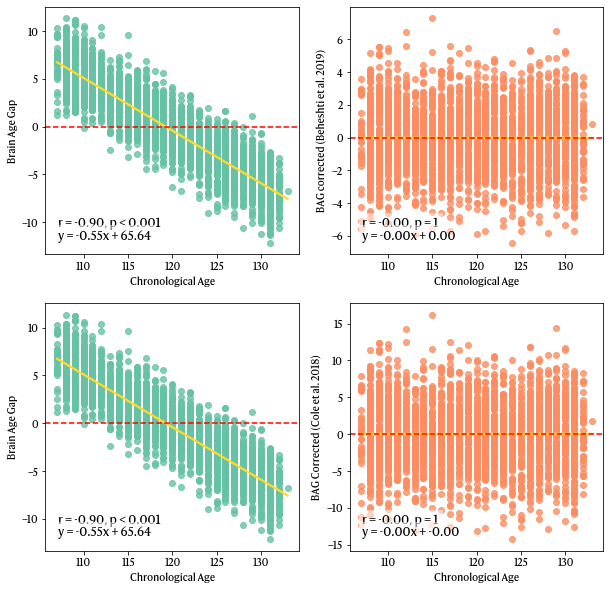

In [87]:
# Plot the dependence of the brainAgeGap on the chronological age.
gap = y_train_pred - y_train["age"]
y_train_pred_corr_cole = (y_train_pred - mod_cole.intercept_) / mod_cole.coef_[0]
y_train_pred_corr = y_train_pred - mod.predict(y_train["age"].values.reshape(-1, 1))
#y_train_pred_corr = y_train_pred + (y_train["age"].values - (mod.predict(y_train["age"].values.reshape(-1, 1))))
gap_corrected = y_train_pred_corr - y_train["age"]
gap_corrected_cole = y_train_pred_corr_cole - y_train["age"]

fig, axs = plt.subplots(2, 2, figsize=(10, 10))
ax = axs.flatten()
sns.regplot(x=y_train["age"], y=gap, scatter=True,
            marker="o", color=cmap[0],
            line_kws={"color": cmap[5], "alpha": 1},
            ax=ax[0])
ax[0].set_xlabel("Chronological Age")
ax[0].set_ylabel("Brain Age Gap")
ax[0].axhline(0, color="red", linestyle="--")

# Print equation of the line at the bottom left corner.
slope, intercept = np.polyfit(y_train["age"], gap, 1)
r, pval = scipy.stats.pearsonr(y_train["age"], gap)
ax[0].text(0.05, 0.15, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
ax[0].text(0.05, 0.1, f"y = {slope:.2f}x + {intercept:.2f}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

sns.regplot(x=y_train["age"], y=gap_corrected, scatter=True,
            marker="o", color=cmap[1],
            line_kws={"color": cmap[5], "alpha": 1},
            ax=ax[1])
ax[1].set_xlabel("Chronological Age")
ax[1].set_ylabel("BAG corrected (Beheshti et al. 2019)")
ax[1].axhline(0, color="red", linestyle="--")

# Print equation of the line at the bottom left corner.
slope, intercept = np.polyfit(y_train["age"], gap_corrected, 1)
r, pval = scipy.stats.pearsonr(y_train["age"], gap_corrected)
ax[1].text(0.05, 0.15, f"r = {r:.2f}, p = {round(pval)}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
ax[1].text(0.05, 0.1, f"y = {slope:.2f}x + {intercept:.2f}",
            transform=ax[1].transAxes, fontsize=12,
            verticalalignment="top", horizontalalignment="left",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

sns.regplot(x=y_train["age"], y=gap, scatter=True,
            marker="o", color=cmap[0],
            line_kws={"color": cmap[5], "alpha": 1},
            ax=ax[2])
ax[2].set_xlabel("Chronological Age")
ax[2].set_ylabel("Brain Age Gap")
ax[2].axhline(0, color="red", linestyle="--")

# Print equation of the line at the bottom left corner.
slope, intercept = np.polyfit(y_train["age"], gap, 1)
r, pval = scipy.stats.pearsonr(y_train["age"], gap)
ax[2].text(0.05, 0.15, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[2].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
ax[2].text(0.05, 0.1, f"y = {slope:.2f}x + {intercept:.2f}",
            transform=ax[2].transAxes, fontsize=12,
            verticalalignment="top", horizontalalignment="left",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

sns.regplot(x=y_train["age"], y=gap_corrected_cole, scatter=True,
            marker="o", color=cmap[1],
            line_kws={"color": cmap[5], "alpha": 1},
            ax=ax[3])
ax[3].set_xlabel("Chronological Age")
ax[3].set_ylabel("BAG Corrected (Cole et al. 2018)")
ax[3].axhline(0, color="red", linestyle="--")

# Print equation of the line at the bottom left corner.
slope, intercept = np.polyfit(y_train["age"], gap_corrected_cole, 1)
r, pval = scipy.stats.pearsonr(y_train["age"], gap_corrected_cole)
ax[3].text(0.05, 0.15, f"r = {r:.2f}, p = {round(pval)}",
            transform=ax[3].transAxes, fontsize=12,
            verticalalignment="top", horizontalalignment="left",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
ax[3].text(0.05, 0.1, f"y = {slope:.2f}x + {intercept:.2f}",
            transform=ax[3].transAxes, fontsize=12,
            verticalalignment="top", horizontalalignment="left",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))


plt.savefig(f"{output_dir}/ageBias.png", dpi=300, bbox_inches="tight")

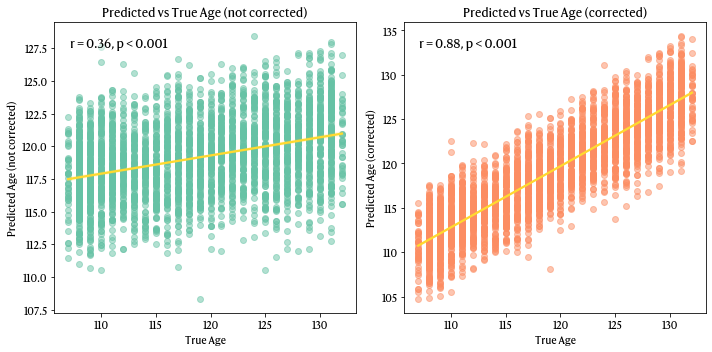

In [57]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_test, y=y_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test["age"], y_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_test, y=y_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test["age"], y_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Building the subcortical structures model.**

Model for the subcortical structures include the following regions (R and L denotes right/left):

* **Amyg_L(R)_2_1**: mAmyg, medial amygdala
* **Amyg_L(R)_2_2**: lAmyg, lateral amygdala
* **Hipp_L(R)_2_1**: rHipp, rostral hippocampus
* **Hipp_L(R)_2_2**: cHipp, caudal hippocampus
* **BG_L(R)_6_1**: vCa, ventral caudate
* **BG_L(R)_6_2**: GP, globus pallidum
* **BG_L(R)_6_3**: NAC, nucleus accumbens
* **BG_L(R)_6_4**: vmPu, ventromedial putamen
* **BG_L(R)_6_5**: dCa, dorsal caudate
* **BG_L(R)_6_6**: dlPu, dorsolateral putamen
* **Tha_L(R)_8_1**: mPFtha, medial pre-frontal thalamus
* **Tha_L(R)_8_2**: mPMtha, pre-motor thalamus
* **Tha_L(R)_8_3**: Stha, sensory thalamus
* **Tha_L(R)_8_4**: rTtha, rostral temporal thalamus
* **Tha_L(R)_8_5**: PPtha, posterior parietal thalamus
* **Tha_L(R)_8_6**: Otha, occipital thalamus
* **Tha_L(R)_8_7**: cTtha, caudal temporal thalamus
* **Tha_L(R)_8_8**: lPFtha, 3lateral pre-frontal thalamus

In [568]:
# Append _vol, _thick, and _area to the regions in columns names.
sub_vol = [f"{col}_vol" for col in subcortical_col]

# Select only the subcortical regions (and identifiers).
subcortical_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + sub_vol]

# Save the dataset.
subcortical_df.to_csv(f"{output_dir}/ABCDSubcortical.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_sub, test_idx_sub = next(gss.split(subcortical_df, groups=subcortical_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_sub) + len(test_idx_sub) == len(subcortical_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(subcortical_df["family_id"].iloc[train_idx_sub]).intersection(set(subcortical_df["family_id"].iloc[test_idx_sub]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_subcortical_train = subcortical_df.iloc[train_idx_sub].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_subcortical_train = pd.DataFrame(subcortical_df.iloc[train_idx_sub]["age"], columns=["age"])
X_subcortical_test = subcortical_df.iloc[test_idx_sub].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_subcortical_test = pd.DataFrame(subcortical_df.iloc[test_idx_sub]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_subcortical_train["age"], y_subcortical_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_subcortical_train = pd.DataFrame(scale(X_subcortical_train), columns=X_subcortical_train.columns)
X_subcortical_test = pd.DataFrame(scale(X_subcortical_test), columns=X_subcortical_test.columns)

Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [571]:
# Build a regression model using XGBoost.
xgb_model_sub = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_sub = BayesSearchCV(
    xgb_model_sub,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_sub.fit(X_subcortical_train, y_subcortical_train)
# Print the best parameters.
print(f"Best parameters: {clf_sub.best_params_}")
# Print the best score.
print(f"Best score: {clf_sub.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.9440822030388678, gamma=0.058069679945977636, learning_rate=0.016566051504745206, max_depth=8, min_child_weight=1, n_estimators=609, reg_alpha=0.003033426982733953, reg_lambda=0.0004234809266684357, subsample=0.5771719376525964; total time=   7.9s
[CV] END colsample_bytree=0.9440822030388678, gamma=0.058069679945977636, learning_rate=0.016566051504745206, max_depth=8, min_child_weight=1, n_estimators=609, reg_alpha=0.003033426982733953, reg_lambda=0.0004234809266684357, subsample=0.5771719376525964; total time=   7.9s
[CV] END colsample_bytree=0.9440822030388678, gamma=0.058069679945977636, learning_rate=0.016566051504745206, max_depth=8, min_child_weight=1, n_estimators=609, reg_alpha=0.003033426982733953, reg_lambda=0.0004234809266684357, subsample=0.5771719376525964; total time=   8.0s
[CV] END colsample_bytree=0.9440822030388678, gamma=0.058069679945977636, learning_rate=0.016566051504745206, max

In [572]:
# Fitting the model with the best parameeters.
xgb_model_sub = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_sub.best_params_["n_estimators"],
    max_depth=clf_sub.best_params_["max_depth"],
    gamma=clf_sub.best_params_["gamma"],
    reg_alpha=clf_sub.best_params_["reg_alpha"],
    reg_lambda=clf_sub.best_params_["reg_lambda"],
    learning_rate=clf_sub.best_params_["learning_rate"],
    subsample=clf_sub.best_params_["subsample"],
    colsample_bytree=clf_sub.best_params_["colsample_bytree"],
    min_child_weight=clf_sub.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_sub.fit(X_subcortical_train, y_subcortical_train)

# Predict on the training data.
y_subcortical_train_pred = xgb_model_sub.predict(X_subcortical_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_subcortical_train, y_subcortical_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_subcortical_train, y_subcortical_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_subcortical_train["age"], y_subcortical_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_subcortical_pred = xgb_model_sub.predict(X_subcortical_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_subcortical_test, y_subcortical_pred)
print(f"Mean absolute error: {mae}")

# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_subcortical_test, y_subcortical_pred) )
print(f"RMSLE: {rmsle}")

# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_subcortical_test["age"], y_subcortical_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_sub.save_model(f"{output_dir}/brainAgeModelSubcortical.json")

Mean absolute error on training data: 5.6827569007873535
Explained variance score on training data: 0.22166394765670416
Pearson correlation coefficient on training data: 0.5221389845058826
Mean absolute error: 6.342777729034424
RMSLE: 0.061452844022365054
Pearson correlation coefficient: 0.23335367378612


In [573]:
# Compute the bias using the training data.
mod_sub = compute_bias(y_subcortical_train, y_subcortical_train_pred)

# Apply the bias to the test data.
y_subcortical_pred_corrected = y_subcortical_pred - mod_sub.predict(y_subcortical_test["age"].values.reshape(-1, 1))
#y_subcortical_pred_corrected = (y_subcortical_pred - mod_sub.intercept_) / mod_sub.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/subcorticalBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_sub, f)

# Compute the mean absolute error.
mae_sub_corrected = mean_absolute_error(y_subcortical_test, y_subcortical_pred_corrected)
print(f"Mean absolute error (corrected): {mae_sub_corrected}")
# Compute the RMSLE.
rmsle_sub_corrected = np.sqrt( mean_squared_log_error(y_subcortical_test, y_subcortical_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_sub_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_sub_corrected = scipy.stats.pearsonr(y_subcortical_test["age"], y_subcortical_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_sub_corrected[0]}")

Mean absolute error (corrected): 1.7768197377427717
RMSLE (corrected): 0.01842470598344726
Pearson correlation coefficient (corrected): 0.9563459183609252


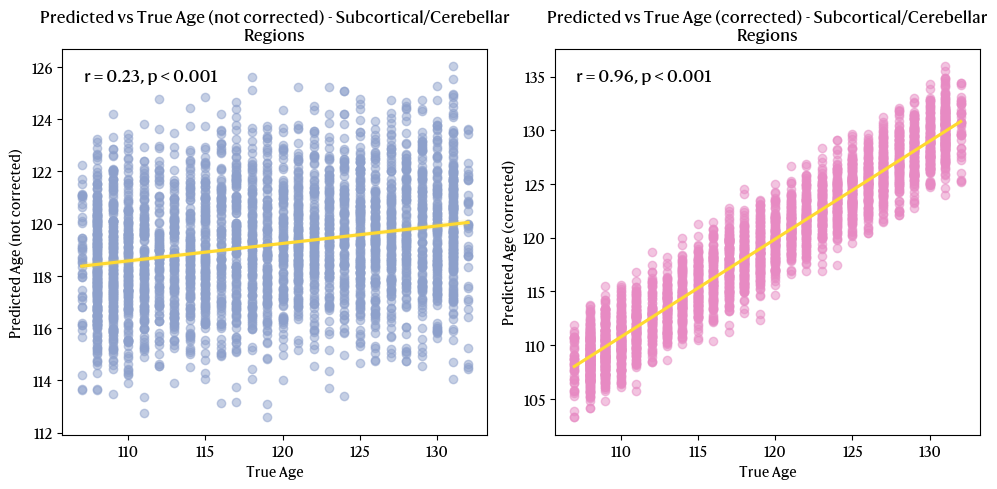

In [574]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10,5))
# Plot the predicted vs true values.
sns.regplot(x=y_subcortical_test, y=y_subcortical_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[2]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Subcortical/Cerebellar\nRegions")

r, pval = scipy.stats.pearsonr(y_subcortical_test["age"], y_subcortical_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_subcortical_test, y=y_subcortical_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[3]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Subcortical/Cerebellar\nRegions")

r, pval = scipy.stats.pearsonr(y_subcortical_test["age"], y_subcortical_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Build the frontal structures model.**

Model for the frontal structures include the following regions (R and L denotes right/left):

* **SFG_L(R)_6_1**: A8m, medial area 8
* **SFG_L(R)_6_2**: A8dl, dorsolateral area 8
* **SFG_L(R)_6_3**: A9m/A9l, medial area 9/lateral area 9
* **SFG_L(R)_6_4**: A6dl, dorsolateral area 6
* **SFG_L(R)_6_5**: A6m, medial area 6
* **SFG_L(R)_6_6**: A10m, medial area 10
* **MFG_L(R)_7_1**: A9/46d, dorsal area 9/46
* **MFG_L(R)_7_2**: IFJ, inferior frontal junction
* **MFG_L(R)_7_3**: A46, area 46
* **MFG_L(R)_7_4**: A9/46v, ventral area 9/46
* **MFG_L(R)_7_5**: A8vl, ventrolateral area 8
* **MFG_L(R)_7_6**: A6vl, ventrolateral area 6
* **MFG_L(R)_7_7**: A10l, lateral area 10
* **IFG_L(R)_6_1**: A44d, dorsal area 44
* **IFG_L(R)_6_2**: IFS, inferior frontal sulcus
* **IFG_L(R)_6_3**: A45c, caudal area 45
* **IFG_L(R)_6_4**: A45r, rostral area 45
* **IFG_L(R)_6_5**: A44op, opercular area 44
* **IFG_L(R)_6_6**: A44v, ventral area 44
* **OrG_L(R)_6_1**: A14m, medial area 14
* **OrG_L(R)_6_2**: A12/47o, orbital area 12/47
* **OrG_L(R)_6_3**: A11l, lateral area 11
* **OrG_L(R)_6_4**: A11m, medial area 11
* **OrG_L(R)_6_5**: A13, area 13
* **OrG_L(R)_6_6**: A12/47l, lateral area 12/47
* **PrG_L(R)_6_1**: A4hf, area 4(head and face region)
* **PrG_L(R)_6_2**: A6cdl, caudal dorsolateral area 6
* **PrG_L(R)_6_3**: A4ul, area 4(upper limb region)
* **PrG_L(R)_6_4**: A4t, area 4(trunk region)
* **PrG_L(R)_6_5**: A4tl, area 4(tongue and larynx region)
* **PrG_L(R)_6_6**: A6cvl, caudal ventrolateral area 6
* **PCL_L(R)_2_1**: A1/2/3ll, area 1/2/3(lower limb region)
* **PCL_L(R)_2_2**: A4ll, area 4

In [575]:
# Append _vol, _thick, and _area to the regions in columns names.
frnt_thick = [f"{col}_thick" for col in frontal_col]
frnt_area = [f"{col}_area" for col in frontal_col]
frnt_vol = [f"{col}_vol" for col in frontal_col]

# Select only the frontal regions (and identifiers).
frontal_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + frnt_vol + frnt_thick + frnt_area]

# Save the dataset.
frontal_df.to_csv(f"{output_dir}/ABCDFrontal.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_frt, test_idx_frt = next(gss.split(frontal_df, groups=frontal_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_frt) + len(test_idx_frt) == len(frontal_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(frontal_df["family_id"].iloc[train_idx_frt]).intersection(set(frontal_df["family_id"].iloc[test_idx_frt]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_frontal_train = frontal_df.iloc[train_idx_frt].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_frontal_train = pd.DataFrame(frontal_df.iloc[train_idx_frt]["age"], columns=["age"])
X_frontal_test = frontal_df.iloc[test_idx_frt].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_frontal_test = pd.DataFrame(frontal_df.iloc[test_idx_frt]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_frontal_train["age"], y_frontal_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_frontal_train = pd.DataFrame(scale(X_frontal_train), columns=X_frontal_train.columns)
X_frontal_test = pd.DataFrame(scale(X_frontal_test), columns=X_frontal_test.columns)


Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [576]:
# Build a regression model using XGBoost.
xgb_model_frontal = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_frontal = BayesSearchCV(
    xgb_model_frontal,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_frontal.fit(X_frontal_train, y_frontal_train)

# Print the best parameters.
print(f"Best parameters: {clf_frontal.best_params_}")
# Print the best score.
print(f"Best score: {clf_frontal.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.8433882634241527, gamma=0.17580186735261316, learning_rate=0.0027959869235987555, max_depth=6, min_child_weight=6, n_estimators=1483, reg_alpha=0.024922479699829227, reg_lambda=0.3079418906241536, subsample=0.6079571735358557; total time=  27.5s
[CV] END colsample_bytree=0.8433882634241527, gamma=0.17580186735261316, learning_rate=0.0027959869235987555, max_depth=6, min_child_weight=6, n_estimators=1483, reg_alpha=0.024922479699829227, reg_lambda=0.3079418906241536, subsample=0.6079571735358557; total time=  27.5s
[CV] END colsample_bytree=0.8433882634241527, gamma=0.17580186735261316, learning_rate=0.0027959869235987555, max_depth=6, min_child_weight=6, n_estimators=1483, reg_alpha=0.024922479699829227, reg_lambda=0.3079418906241536, subsample=0.6079571735358557; total time=  27.8s
[CV] END colsample_bytree=0.8433882634241527, gamma=0.17580186735261316, learning_rate=0.0027959869235987555, max_depth

In [577]:
# Fitting the model with the best parameeters.
xgb_model_frontal = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_frontal.best_params_["n_estimators"],
    max_depth=clf_frontal.best_params_["max_depth"],
    gamma=clf_frontal.best_params_["gamma"],
    reg_alpha=clf_frontal.best_params_["reg_alpha"],
    reg_lambda=clf_frontal.best_params_["reg_lambda"],
    learning_rate=clf_frontal.best_params_["learning_rate"],
    subsample=clf_frontal.best_params_["subsample"],
    colsample_bytree=clf_frontal.best_params_["colsample_bytree"],
    min_child_weight=clf_frontal.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_frontal.fit(X_frontal_train, y_frontal_train)

# Predict on the training data.
y_frontal_train_pred = xgb_model_frontal.predict(X_frontal_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_frontal_train, y_frontal_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_frontal_train, y_frontal_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_frontal_train["age"], y_frontal_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_frontal_pred = xgb_model_frontal.predict(X_frontal_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_frontal_test, y_frontal_pred)
print(f"Mean absolute error: {mae}")
# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_frontal_test, y_frontal_pred) )
print(f"RMSLE: {rmsle}")
# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_frontal_test["age"], y_frontal_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_frontal.save_model(f"{output_dir}/brainAgeModelFrontal.json")

Mean absolute error on training data: 5.328114986419678
Explained variance score on training data: 0.31294902484577947
Pearson correlation coefficient on training data: 0.6384691649439123
Mean absolute error: 6.213725566864014
RMSLE: 0.06062792536839961
Pearson correlation coefficient: 0.28063574490796583


In [578]:
# Compute the bias using the training data.
mod_frontal = compute_bias(y_frontal_train, y_frontal_train_pred)

# Apply the bias to the test data.
y_frontal_pred_corrected = y_frontal_pred - mod_frontal.predict(y_frontal_test["age"].values.reshape(-1, 1))
#y_frontal_pred_corrected = (y_frontal_pred - mod_frontal.intercept_) / mod_frontal.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/frontalBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_frontal, f)

# Compute the mean absolute error.
mae_frontal_corrected = mean_absolute_error(y_frontal_test, y_frontal_pred_corrected)
print(f"Mean absolute error (corrected): {mae_frontal_corrected}")
# Compute the RMSLE.
rmsle_frontal_corrected = np.sqrt( mean_squared_log_error(y_frontal_test, y_frontal_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_frontal_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_frontal_corrected = scipy.stats.pearsonr(y_frontal_test["age"], y_frontal_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_frontal_corrected[0]}")

Mean absolute error (corrected): 1.8966802035421746
RMSLE (corrected): 0.01967368507546924
Pearson correlation coefficient (corrected): 0.950843726745259


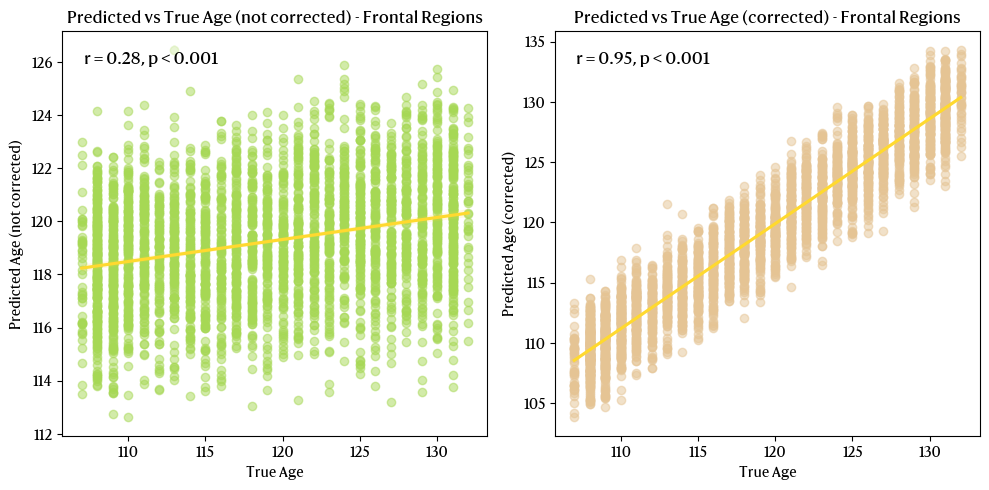

In [579]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_frontal_test, y=y_frontal_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[4]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Frontal Regions")

r, pval = scipy.stats.pearsonr(y_frontal_test["age"], y_frontal_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_frontal_test, y=y_frontal_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[6]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Frontal Regions")

r, pval = scipy.stats.pearsonr(y_frontal_test["age"], y_frontal_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Building the temporal regions model.**

Model for the temporal structures include the following regions (R and L denotes right/left):

* **STG_L(R)_6_1**: A38m, medial area 38
* **STG_L(R)_6_2**: A41/42, area 41/42
* **STG_L(R)_6_3**: TE1.0 and TE1.2
* **STG_L(R)_6_4**: A22c, caudal area 22
* **STG_L(R)_6_5**: A38l, lateral area 38
* **STG_L(R)_6_6**: A22r, rostral area 22
* **MTG_L(R)_4_1**: A21c, caudal area 21
* **MTG_L(R)_4_2**: A21r, rostral area 21
* **MTG_L(R)_4_3**: A37dl, dorsolateral area 37
* **MTG_L(R)_4_4**: aSTS, anterior superior temporal sulcus
* **ITG_L(R)_5_1**: A37elv, extreme lateroventral area 37
* **ITG_L(R)_5_2**: A20r, rostral area 20
* **ITG_L(R)_5_3**: A20il, intermediate lateral area 20
* **ITG_L(R)_5_4**: A20cl, caudolateral of area 20
* **ITG_L(R)_5_5**: A20cv, caudoventral of area 20
* **FuG_L(R)_3_1**: A20rv, rostroventral area 20
* **FuG_L(R)_3_2**: A37mv, medioventral area 37
* **FuG_L(R)_3_3**: A37lv, lateroventral area 37
* **PhG_L(R)_6_1**: A35/36r, rostral area 35/36
* **PhG_L(R)_6_2**: A35/36c, caudal area 35/36
* **PhG_L(R)_6_3**: TL, area TL
* **PhG_L(R)_6_4**: A28/34, area 28/34
* **PhG_L(R)_6_5**: TI, area TI
* **PhG_L(R)_6_6**: TH, area TH
* **pSTS_L(R)_2_1**: rpSTS, rostroposterior superior temporal sulcus
* **pSTS_L(R)_2_2**: cpSTS, caudoposterior superior temporal sulcus

In [580]:
# Append _vol, _thick, and _area to the regions in columns names.
temp_vol = [f"{col}_vol" for col in temporal_col]
temp_thick = [f"{col}_thick" for col in temporal_col]
temp_area = [f"{col}_area" for col in temporal_col]

# Select only the temporal regions (and identifiers).
temporal_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + temp_vol + temp_thick + temp_area]

# Save the dataset.
temporal_df.to_csv(f"{output_dir}/ABCDTemporal.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_temp, test_idx_temp = next(gss.split(temporal_df, groups=temporal_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_temp) + len(test_idx_temp) == len(temporal_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(temporal_df["family_id"].iloc[train_idx_temp]).intersection(set(temporal_df["family_id"].iloc[test_idx_temp]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_temporal_train = temporal_df.iloc[train_idx_temp].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_temporal_train = pd.DataFrame(temporal_df.iloc[train_idx_temp]["age"], columns=["age"])
X_temporal_test = temporal_df.iloc[test_idx_temp].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_temporal_test = pd.DataFrame(temporal_df.iloc[test_idx_temp]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_temporal_train["age"], y_temporal_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_temporal_train = pd.DataFrame(scale(X_temporal_train), columns=X_temporal_train.columns)
X_temporal_test = pd.DataFrame(scale(X_temporal_test), columns=X_temporal_test.columns)


Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [581]:
# Build a regression model using XGBoost.
xgb_model_temp = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_temp = BayesSearchCV(
    xgb_model_temp,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_temp.fit(X_temporal_train, y_temporal_train)

# Print the best parameters.
print(f"Best parameters: {clf_temp.best_params_}")
# Print the best score.
print(f"Best score: {clf_temp.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.7956317365283052, gamma=0.2840994771084642, learning_rate=0.0033958070816670046, max_depth=8, min_child_weight=6, n_estimators=364, reg_alpha=0.04881021352051717, reg_lambda=0.34476895232846494, subsample=0.7642080184893739; total time=   8.8s
[CV] END colsample_bytree=0.7956317365283052, gamma=0.2840994771084642, learning_rate=0.0033958070816670046, max_depth=8, min_child_weight=6, n_estimators=364, reg_alpha=0.04881021352051717, reg_lambda=0.34476895232846494, subsample=0.7642080184893739; total time=   9.0s
[CV] END colsample_bytree=0.7956317365283052, gamma=0.2840994771084642, learning_rate=0.0033958070816670046, max_depth=8, min_child_weight=6, n_estimators=364, reg_alpha=0.04881021352051717, reg_lambda=0.34476895232846494, subsample=0.7642080184893739; total time=   9.2s
[CV] END colsample_bytree=0.7956317365283052, gamma=0.2840994771084642, learning_rate=0.0033958070816670046, max_depth=8, min

In [582]:
# Fitting the model with the best parameeters.
xgb_model_temp = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_temp.best_params_["n_estimators"],
    max_depth=clf_temp.best_params_["max_depth"],
    gamma=clf_temp.best_params_["gamma"],
    reg_alpha=clf_temp.best_params_["reg_alpha"],
    reg_lambda=clf_temp.best_params_["reg_lambda"],
    learning_rate=clf_temp.best_params_["learning_rate"],
    subsample=clf_temp.best_params_["subsample"],
    colsample_bytree=clf_temp.best_params_["colsample_bytree"],
    min_child_weight=clf_temp.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_temp.fit(X_temporal_train, y_temporal_train)

# Predict on the training data.
y_temporal_train_pred = xgb_model_temp.predict(X_temporal_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_temporal_train, y_temporal_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_temporal_train, y_temporal_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_temporal_train["age"], y_temporal_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_temporal_pred = xgb_model_temp.predict(X_temporal_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_temporal_test, y_temporal_pred)
print(f"Mean absolute error: {mae}")
# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_temporal_test, y_temporal_pred) )
print(f"RMSLE: {rmsle}")
# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_temporal_test["age"], y_temporal_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_temp.save_model(f"{output_dir}/brainAgeModelTemporal.json")

Mean absolute error on training data: 5.749056339263916
Explained variance score on training data: 0.2157563616998821
Pearson correlation coefficient on training data: 0.6774487051763375
Mean absolute error: 6.536710262298584
RMSLE: 0.0628533396460749
Pearson correlation coefficient: 0.10636236616748079


In [583]:
# Compute the bias using the training data.
mod_temp = compute_bias(y_temporal_train, y_temporal_train_pred)

# Apply the bias to the test data.
y_temporal_pred_corrected = y_temporal_pred - mod_temp.predict(y_temporal_test["age"].values.reshape(-1, 1))
#y_temporal_pred_corrected = (y_temporal_pred - mod_temp.intercept_) / mod_temp.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/temporalBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_temp, f)

# Compute the mean absolute error.
mae_temporal_corrected = mean_absolute_error(y_temporal_test, y_temporal_pred_corrected)
print(f"Mean absolute error (corrected): {mae_temporal_corrected}")
# Compute the RMSLE.
rmsle_temporal_corrected = np.sqrt( mean_squared_log_error(y_temporal_test, y_temporal_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_temporal_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_temporal_corrected = scipy.stats.pearsonr(y_temporal_test["age"], y_temporal_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_temporal_corrected[0]}")

Mean absolute error (corrected): 1.0819048110918073
RMSLE (corrected): 0.01133780626621288
Pearson correlation coefficient (corrected): 0.9876280826876581


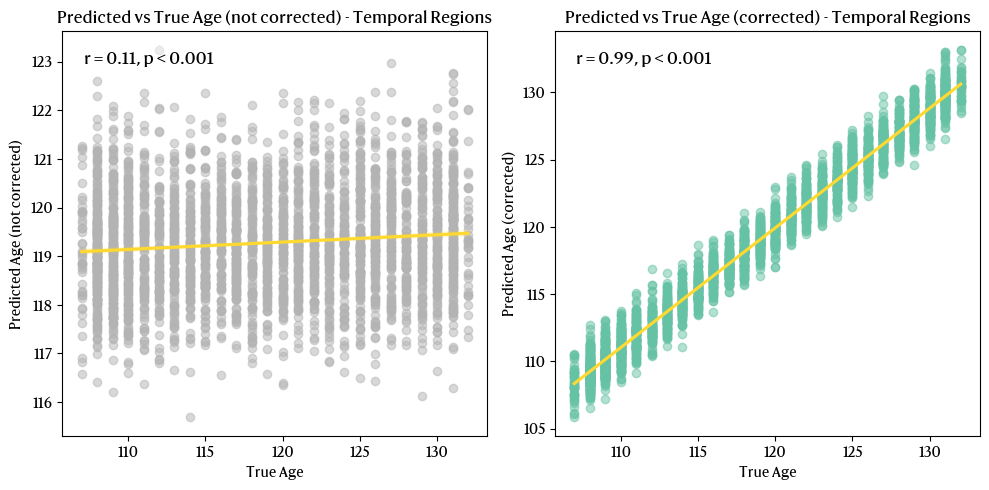

In [584]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_temporal_test, y=y_temporal_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[7]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Temporal Regions")

r, pval = scipy.stats.pearsonr(y_temporal_test["age"], y_temporal_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_temporal_test, y=y_temporal_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Temporal Regions")

r, pval = scipy.stats.pearsonr(y_temporal_test["age"], y_temporal_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Building the parietal regions model.**

Model for the parietal structures include the following regions (R and L denotes right/left):

* **SPL_L(R)_3_1**: A7c, caudal area 7
* **SPL_L(R)_3_2**: A5l, lateral area 5
* **SPL_L(R)_3_3**: A7pc, postcentral area 7
* **IPL_L(R)_6_1**: A39c, caudal area 39
* **IPL_L(R)_6_2**: A39rd, rostrodorsal area 39
* **IPL_L(R)_6_3**: A40rd, rostrodorsal area 40
* **IPL_L(R)_6_4**: A40c, caudal area 40
* **IPL_L(R)_6_5**: A39rv, rostroventral area 39
* **IPL_L(R)_6_6**: A40rv, rostroventral area 40
* **PCun_L(R)_4_1**: A7m, medial area 7
* **PCun_L(R)_4_2**: A5m, medial area 5
* **PCun_L(R)_4_3**: dmPOS, dorsomedial parietooccipital sulcus
* **PCun_L(R)_4_4**: A31, area 31
* **PoG_L(R)_4_1**: A1/2/3ulhf, area 1/2/3
* **PoG_L(R)_4_2**: A1/2/3tonIa, area 1/2/3
* **PoG_L(R)_4_3**: A2, area 2
* **PoG_L(R)_4_4**: A1/2/3tru, area 1/2/3

In [585]:
# Append _vol, _thick, and _area to the regions in columns names.
parietal_vol = [f"{col}_vol" for col in parietal_col]
parietal_thick = [f"{col}_thick" for col in parietal_col]
parietal_area = [f"{col}_area" for col in parietal_col]

# Select only the parietal regions (and identifiers).
parietal_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + parietal_vol + parietal_thick + parietal_area]

# Save the dataset.
parietal_df.to_csv(f"{output_dir}/ABCDParietal.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_par, test_idx_par = next(gss.split(parietal_df, groups=parietal_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_par) + len(test_idx_par) == len(parietal_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(parietal_df["family_id"].iloc[train_idx_par]).intersection(set(parietal_df["family_id"].iloc[test_idx_par]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_parietal_train = parietal_df.iloc[train_idx_par].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_parietal_train = pd.DataFrame(parietal_df.iloc[train_idx_par]["age"], columns=["age"])
X_parietal_test = parietal_df.iloc[test_idx_par].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_parietal_test = pd.DataFrame(parietal_df.iloc[test_idx_par]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_parietal_train["age"], y_parietal_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_parietal_train = pd.DataFrame(scale(X_parietal_train), columns=X_parietal_train.columns)
X_parietal_test = pd.DataFrame(scale(X_parietal_test), columns=X_parietal_test.columns)

Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [586]:
# Build a regression model using XGBoost.
xgb_model_parietal = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_parietal = BayesSearchCV(
    xgb_model_parietal,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_parietal.fit(X_parietal_train, y_parietal_train)

# Print the best parameters.
print(f"Best parameters: {clf_parietal.best_params_}")
# Print the best score.
print(f"Best score: {clf_parietal.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.9387595341558111, gamma=1.1750706826537771, learning_rate=0.012497879688828097, max_depth=4, min_child_weight=3, n_estimators=1689, reg_alpha=8.600599517499784e-06, reg_lambda=0.0010503616523264978, subsample=0.9377121323464287; total time=   6.8s
[CV] END colsample_bytree=0.9387595341558111, gamma=1.1750706826537771, learning_rate=0.012497879688828097, max_depth=4, min_child_weight=3, n_estimators=1689, reg_alpha=8.600599517499784e-06, reg_lambda=0.0010503616523264978, subsample=0.9377121323464287; total time=   6.8s
[CV] END colsample_bytree=0.9387595341558111, gamma=1.1750706826537771, learning_rate=0.012497879688828097, max_depth=4, min_child_weight=3, n_estimators=1689, reg_alpha=8.600599517499784e-06, reg_lambda=0.0010503616523264978, subsample=0.9377121323464287; total time=   6.9s
[CV] END colsample_bytree=0.9387595341558111, gamma=1.1750706826537771, learning_rate=0.012497879688828097, max_d

In [587]:
# Fitting the model with the best parameeters.
xgb_model_parietal = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_parietal.best_params_["n_estimators"],
    max_depth=clf_parietal.best_params_["max_depth"],
    gamma=clf_parietal.best_params_["gamma"],
    reg_alpha=clf_parietal.best_params_["reg_alpha"],
    reg_lambda=clf_parietal.best_params_["reg_lambda"],
    learning_rate=clf_parietal.best_params_["learning_rate"],
    subsample=clf_parietal.best_params_["subsample"],
    colsample_bytree=clf_parietal.best_params_["colsample_bytree"],
    min_child_weight=clf_parietal.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_parietal.fit(X_parietal_train, y_parietal_train)

# Predict on the training data.
y_parietal_train_pred = xgb_model_parietal.predict(X_parietal_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_parietal_train, y_parietal_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_parietal_train, y_parietal_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_parietal_train["age"], y_parietal_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_parietal_pred = xgb_model_parietal.predict(X_parietal_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_parietal_test, y_parietal_pred)
print(f"Mean absolute error: {mae}")
# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_parietal_test, y_parietal_pred) )
print(f"RMSLE: {rmsle}")
# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_parietal_test["age"], y_parietal_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_parietal.save_model(f"{output_dir}/brainAgeModelParietal.json")

Mean absolute error on training data: 6.0731892585754395
Explained variance score on training data: 0.12350617262579489
Pearson correlation coefficient on training data: 0.48821343922148147
Mean absolute error: 6.477965831756592
RMSLE: 0.062249312337055926
Pearson correlation coefficient: 0.17343109933067477


In [588]:
# Compute the bias using the training data.
mod_parietal = compute_bias(y_parietal_train, y_parietal_train_pred)

# Apply the bias to the test data.
y_parietal_pred_corrected = y_parietal_pred - mod_parietal.predict(y_parietal_test["age"].values.reshape(-1, 1))
#y_parietal_pred_corrected = (y_parietal_pred - mod_parietal.intercept_) / mod_parietal.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/parietalBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_parietal, f)

# Compute the mean absolute error.
mae_parietal_corrected = mean_absolute_error(y_parietal_test, y_parietal_pred_corrected)
print(f"Mean absolute error (corrected): {mae_parietal_corrected}")
# Compute the RMSLE.
rmsle_parietal_corrected = np.sqrt( mean_squared_log_error(y_parietal_test, y_parietal_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_parietal_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_parietal_corrected = scipy.stats.pearsonr(y_parietal_test["age"], y_parietal_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_parietal_corrected[0]}")

Mean absolute error (corrected): 0.8761495483117715
RMSLE (corrected): 0.009072632152592647
Pearson correlation coefficient (corrected): 0.9901939413306391


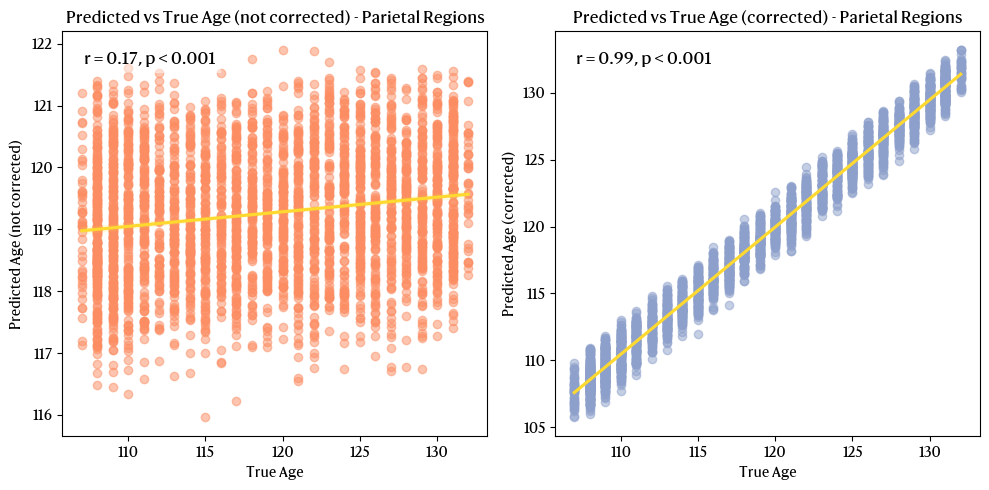

In [589]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_parietal_test, y=y_parietal_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Parietal Regions")

r, pval = scipy.stats.pearsonr(y_parietal_test["age"], y_parietal_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_parietal_test, y=y_parietal_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[2]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Parietal Regions")

r, pval = scipy.stats.pearsonr(y_parietal_test["age"], y_parietal_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Build the insular regions model.**

Model for the insular structures include the following regions (R and L denotes right/left):

* **Ins_L(R)_3_1**: vIa, ventral agranular insula
* **Ins_L(R)_3_2**: G/vId/vIg/dIg, hypergranular insula/ventral dysgranular and granular insula/dorsal granular insula
* **Ins_L(R)_3_3**: dIa/dId, dorsal agranular insula/dorsal dysgranular insula

In [591]:
# Append _vol, _thick, and _area to the regions in columns names.
insula_vol = [f"{col}_vol" for col in insular_col]
insula_thick = [f"{col}_thick" for col in insular_col]
insula_area = [f"{col}_area" for col in insular_col]

# Select only the insular regions (and identifiers).
insula_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + insula_vol + insula_thick + insula_area]

# Save the dataset.
insula_df.to_csv(f"{output_dir}/ABCDInsula.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_ins, test_idx_ins = next(gss.split(insula_df, groups=insula_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_ins) + len(test_idx_ins) == len(insula_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(insula_df["family_id"].iloc[train_idx_ins]).intersection(set(insula_df["family_id"].iloc[test_idx_ins]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_insula_train = insula_df.iloc[train_idx_ins].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_insula_train = pd.DataFrame(insula_df.iloc[train_idx_ins]["age"], columns=["age"])
X_insula_test = insula_df.iloc[test_idx_ins].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_insula_test = pd.DataFrame(insula_df.iloc[test_idx_ins]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_insula_train["age"], y_insula_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_insula_train = pd.DataFrame(scale(X_insula_train), columns=X_insula_train.columns)
X_insula_test = pd.DataFrame(scale(X_insula_test), columns=X_insula_test.columns)

Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [592]:
# Build a regression model using XGBoost.
xgb_model_insula = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_insula = BayesSearchCV(
    xgb_model_insula,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_insula.fit(X_insula_train, y_insula_train)

# Print the best parameters.
print(f"Best parameters: {clf_insula.best_params_}")
# Print the best score.
print(f"Best score: {clf_insula.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.7153947102783558, gamma=0.015701397517680755, learning_rate=0.062200068161452106, max_depth=4, min_child_weight=2, n_estimators=1327, reg_alpha=48.19185249497773, reg_lambda=2.641877840822389, subsample=0.7319273841582926; total time=   1.0s
[CV] END colsample_bytree=0.7153947102783558, gamma=0.015701397517680755, learning_rate=0.062200068161452106, max_depth=4, min_child_weight=2, n_estimators=1327, reg_alpha=48.19185249497773, reg_lambda=2.641877840822389, subsample=0.7319273841582926; total time=   1.0s
[CV] END colsample_bytree=0.7153947102783558, gamma=0.015701397517680755, learning_rate=0.062200068161452106, max_depth=4, min_child_weight=2, n_estimators=1327, reg_alpha=48.19185249497773, reg_lambda=2.641877840822389, subsample=0.7319273841582926; total time=   1.0s
[CV] END colsample_bytree=0.7153947102783558, gamma=0.015701397517680755, learning_rate=0.062200068161452106, max_depth=4, min_chil

In [593]:
# Fitting the model with the best parameeters.
xgb_model_insula = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_insula.best_params_["n_estimators"],
    max_depth=clf_insula.best_params_["max_depth"],
    gamma=clf_insula.best_params_["gamma"],
    reg_alpha=clf_insula.best_params_["reg_alpha"],
    reg_lambda=clf_insula.best_params_["reg_lambda"],
    learning_rate=clf_insula.best_params_["learning_rate"],
    subsample=clf_insula.best_params_["subsample"],
    colsample_bytree=clf_insula.best_params_["colsample_bytree"],
    min_child_weight=clf_insula.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_insula.fit(X_insula_train, y_insula_train)

# Predict on the training data.
y_insula_train_pred = xgb_model_insula.predict(X_insula_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_insula_train, y_insula_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_insula_train, y_insula_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_insula_train["age"], y_insula_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_insula_pred = xgb_model_insula.predict(X_insula_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_insula_test, y_insula_pred)
print(f"Mean absolute error: {mae}")
# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_insula_test, y_insula_pred) )
print(f"RMSLE: {rmsle}")
# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_insula_test["age"], y_insula_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_insula.save_model(f"{output_dir}/brainAgeModelInsula.json")

Mean absolute error on training data: 6.30156946182251
Explained variance score on training data: 0.05693480856709898
Pearson correlation coefficient on training data: 0.2875153179591523
Mean absolute error: 6.533540725708008
RMSLE: 0.06277397574506735
Pearson correlation coefficient: 0.11359234676176892


In [594]:
# Coompute the bias using the training data.
mod_insula = compute_bias(y_insula_train, y_insula_train_pred)

# Apply the bias to the test data.
y_insula_pred_corrected = y_insula_pred - mod_insula.predict(y_insula_test["age"].values.reshape(-1, 1))
#y_insula_pred_corrected = (y_insula_pred - mod_insula.intercept_) / mod_insula.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/insulaBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_insula, f)

# Compute the mean absolute error.
mae_insula_corrected = mean_absolute_error(y_insula_test, y_insula_pred_corrected)
print(f"Mean absolute error (corrected): {mae_insula_corrected}")
# Compute the RMSLE.
rmsle_insula_corrected = np.sqrt( mean_squared_log_error(y_insula_test, y_insula_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_insula_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_insula_corrected = scipy.stats.pearsonr(y_insula_test["age"], y_insula_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_insula_corrected[0]}")

Mean absolute error (corrected): 0.7750374880077294
RMSLE (corrected): 0.00797149348638103
Pearson correlation coefficient (corrected): 0.9920837625969042


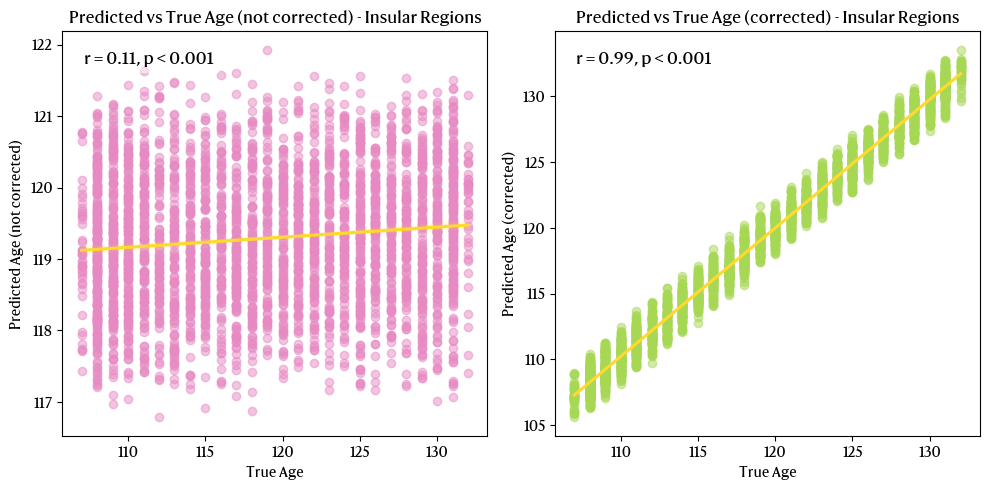

In [595]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_insula_test, y=y_insula_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[3]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Insular Regions")

r, pval = scipy.stats.pearsonr(y_insula_test["age"], y_insula_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_insula_test, y=y_insula_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[4]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Insular Regions")

r, pval = scipy.stats.pearsonr(y_insula_test["age"], y_insula_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Building the limbic regions model.**

Model for the limbic structures include the following regions (R and L denotes right/left):

* **CG_L(R)_5_1**: A23d, dorsal area 23
* **CG_L(R)_5_2**: A32p, pregenual area 32
* **CG_L(R)_5_3**: A23v, ventral area 23
* **CG_L(R)_5_4**: A23c, caudal area 23
* **CG_L(R)_5_5**: A32sg, subgenual area 32


In [596]:
# Append _vol, _thick, and _area to the regions in columns names.
limbic_vol = [f"{col}_vol" for col in limbic_col]
limbic_thick = [f"{col}_thick" for col in limbic_col]
limbic_area = [f"{col}_area" for col in limbic_col]

# Select only the limbic regions (and identifiers).
limbic_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + limbic_vol + limbic_thick + limbic_area]

# Save the dataset.
limbic_df.to_csv(f"{output_dir}/ABCDLimbic.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_limb, test_idx_limb = next(gss.split(limbic_df, groups=limbic_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_limb) + len(test_idx_limb) == len(limbic_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(limbic_df["family_id"].iloc[train_idx_limb]).intersection(set(limbic_df["family_id"].iloc[test_idx_limb]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_limbic_train = limbic_df.iloc[train_idx_limb].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_limbic_train = pd.DataFrame(limbic_df.iloc[train_idx_limb]["age"], columns=["age"])
X_limbic_test = limbic_df.iloc[test_idx_limb].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_limbic_test = pd.DataFrame(limbic_df.iloc[test_idx_limb]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_limbic_train["age"], y_limbic_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_limbic_train = pd.DataFrame(scale(X_limbic_train), columns=X_limbic_train.columns)
X_limbic_test = pd.DataFrame(scale(X_limbic_test), columns=X_limbic_test.columns)

Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [597]:
# Build a regression model using XGBoost.
xgb_model_limbic = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_limbic = BayesSearchCV(
    xgb_model_limbic,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_limbic.fit(X_limbic_train, y_limbic_train)

# Print the best parameters.
print(f"Best parameters: {clf_limbic.best_params_}")
# Print the best score.
print(f"Best score: {clf_limbic.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.9112373483272056, gamma=0.057145626353627084, learning_rate=0.0022256029664094127, max_depth=7, min_child_weight=2, n_estimators=1947, reg_alpha=16.169673565495078, reg_lambda=0.0012436269278067503, subsample=0.6662560876722065; total time=  11.3s
[CV] END colsample_bytree=0.9112373483272056, gamma=0.057145626353627084, learning_rate=0.0022256029664094127, max_depth=7, min_child_weight=2, n_estimators=1947, reg_alpha=16.169673565495078, reg_lambda=0.0012436269278067503, subsample=0.6662560876722065; total time=  11.3s
[CV] END colsample_bytree=0.9112373483272056, gamma=0.057145626353627084, learning_rate=0.0022256029664094127, max_depth=7, min_child_weight=2, n_estimators=1947, reg_alpha=16.169673565495078, reg_lambda=0.0012436269278067503, subsample=0.6662560876722065; total time=  11.3s
[CV] END colsample_bytree=0.9112373483272056, gamma=0.057145626353627084, learning_rate=0.0022256029664094127, ma

In [598]:
# Fitting the model with the best parameeters.
xgb_model_limbic = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_limbic.best_params_["n_estimators"],
    max_depth=clf_limbic.best_params_["max_depth"],
    gamma=clf_limbic.best_params_["gamma"],
    reg_alpha=clf_limbic.best_params_["reg_alpha"],
    reg_lambda=clf_limbic.best_params_["reg_lambda"],
    learning_rate=clf_limbic.best_params_["learning_rate"],
    subsample=clf_limbic.best_params_["subsample"],
    colsample_bytree=clf_limbic.best_params_["colsample_bytree"],
    min_child_weight=clf_limbic.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_limbic.fit(X_limbic_train, y_limbic_train)

# Predict on the training data.
y_limbic_train_pred = xgb_model_limbic.predict(X_limbic_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_limbic_train, y_limbic_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_limbic_train, y_limbic_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_limbic_train["age"], y_limbic_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_limbic_pred = xgb_model_limbic.predict(X_limbic_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_limbic_test, y_limbic_pred)
print(f"Mean absolute error: {mae}")
# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_limbic_test, y_limbic_pred) )
print(f"RMSLE: {rmsle}")
# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_limbic_test["age"], y_limbic_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_limbic.save_model(f"{output_dir}/brainAgeModelLimbic.json")

Mean absolute error on training data: 3.6321370601654053
Explained variance score on training data: 0.6777116444721796
Pearson correlation coefficient on training data: 0.9561690502879796
Mean absolute error: 6.543365955352783
RMSLE: 0.06302265958990405
Pearson correlation coefficient: 0.10461143326393503


In [599]:
# Compute the bias using the training data.
mod_limbic = compute_bias(y_limbic_train, y_limbic_train_pred)

# Apply the bias to the test data.
y_limbic_pred_corrected = y_limbic_pred - mod_limbic.predict(y_limbic_test["age"].values.reshape(-1, 1))
#y_limbic_pred_corrected = (y_limbic_pred - mod_limbic.intercept_) / mod_limbic.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/limbicBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_limbic, f)

# Compute the mean absolute error.
mae_limbic_corrected = mean_absolute_error(y_limbic_test, y_limbic_pred_corrected)
print(f"Mean absolute error (corrected): {mae_limbic_corrected}")
# Compute the RMSLE.
rmsle_limbic_corrected = np.sqrt( mean_squared_log_error(y_limbic_test, y_limbic_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_limbic_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_limbic_corrected = scipy.stats.pearsonr(y_limbic_test["age"], y_limbic_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_limbic_corrected[0]}")

Mean absolute error (corrected): 2.997009282690964
RMSLE (corrected): 0.02967746642492486
Pearson correlation coefficient (corrected): 0.9506335380029368


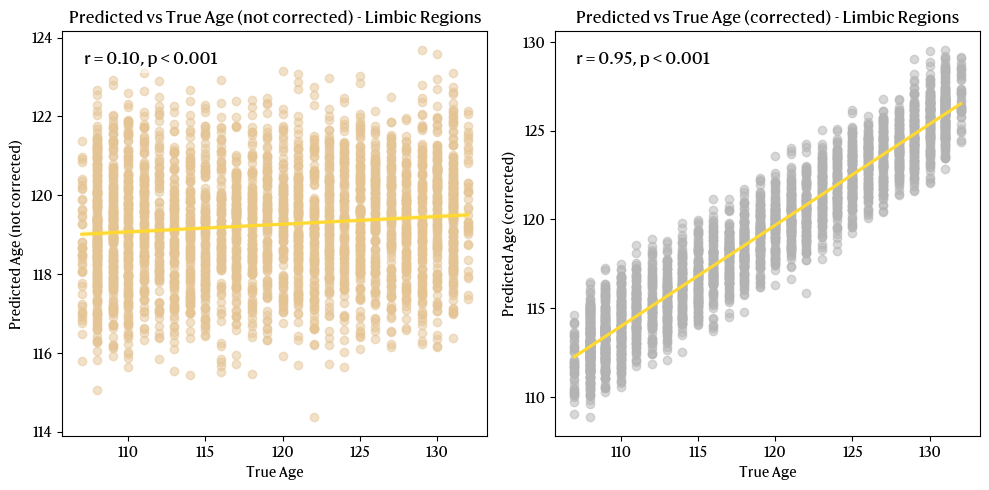

In [600]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_limbic_test, y=y_limbic_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[6]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Limbic Regions")

r, pval = scipy.stats.pearsonr(y_limbic_test["age"], y_limbic_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_limbic_test, y=y_limbic_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[7]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Limbic Regions")

r, pval = scipy.stats.pearsonr(y_limbic_test["age"], y_limbic_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Building the occipital regions model.**

Model for the occipital structures include the following regions (R and L denotes right/left):

* **MVOcC_L(R)_5_1**: cLinG, caudal lingual gyrus
* **MVOcC_L(R)_5_2**: rCunG, rostral cuneus gyrus
* **MVOcC_L(R)_5_3**: cCunG, caudal cuneus gyrus
* **MVOcC_L(R)_5_4**: rLinG, rostral lingual gyrus
* **MVOcC_L(R)_5_5**: vmPOS, ventromedial parietooccipital sulcus
* **LOcC_L(R)_4_1**: mOccG, middle occipital gyrus
* **LOcC_L(R)_4_2**: V5/MT+, area V5/MT+
* **LOcC_L(R)_4_3**: OPC, occipital polar cortex
* **LOcC_L(R)_4_4**: iOccG, inferior occipital gyrus
* **LOcC_L(R)_1_1**: msOccG/lsOccG, medial superior occipital gyrus/lateral superior occipital gyrus

In [601]:
# Append _vol, _thick, and _area to the regions in columns names.
occipital_vol = [f"{col}_vol" for col in occipital_col]
occipital_thick = [f"{col}_thick" for col in occipital_col]
occipital_area = [f"{col}_area" for col in occipital_col]

# Select only the occipital regions (and identifiers).
occipital_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + occipital_vol + occipital_thick + occipital_area]

# Save the dataset.
occipital_df.to_csv(f"{output_dir}/ABCDOccipital.csv", index=False)

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=1234)
train_idx_occ, test_idx_occ = next(gss.split(occipital_df, groups=occipital_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_occ) + len(test_idx_occ) == len(occipital_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(occipital_df["family_id"].iloc[train_idx_occ]).intersection(set(occipital_df["family_id"].iloc[test_idx_occ]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_occipital_train = occipital_df.iloc[train_idx_occ].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_occipital_train = pd.DataFrame(occipital_df.iloc[train_idx_occ]["age"], columns=["age"])
X_occipital_test = occipital_df.iloc[test_idx_occ].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_occipital_test = pd.DataFrame(occipital_df.iloc[test_idx_occ]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_occipital_train["age"], y_occipital_test["age"])
if p_value < 0.05:
    print(f"Age distributions are significantly different between train and test sets. {p_value}")
else:
    print(f"Age distributions are not significantly different between train and test sets. {p_value}")

# Scale the data.
X_occipital_train = pd.DataFrame(scale(X_occipital_train), columns=X_occipital_train.columns)
X_occipital_test = pd.DataFrame(scale(X_occipital_test), columns=X_occipital_test.columns)

Age distributions are not significantly different between train and test sets. 0.14133814431799174


In [602]:
# Build a regression model using XGBoost.
xgb_model_occipital = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform grid search for hyperparameters.
clf_occipital = BayesSearchCV(
    xgb_model_occipital,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2,
)

# Fit the model to the training data.
clf_occipital.fit(X_occipital_train, y_occipital_train)

# Print the best parameters.
print(f"Best parameters: {clf_occipital.best_params_}")
# Print the best score.
print(f"Best score: {clf_occipital.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.8394729947231218, gamma=0.20154829624487144, learning_rate=0.017522530900070728, max_depth=6, min_child_weight=6, n_estimators=765, reg_alpha=0.024056297036761057, reg_lambda=0.7197794577860651, subsample=0.7540832036490015; total time=   4.2s
[CV] END colsample_bytree=0.8394729947231218, gamma=0.20154829624487144, learning_rate=0.017522530900070728, max_depth=6, min_child_weight=6, n_estimators=765, reg_alpha=0.024056297036761057, reg_lambda=0.7197794577860651, subsample=0.7540832036490015; total time=   4.3s
[CV] END colsample_bytree=0.8394729947231218, gamma=0.20154829624487144, learning_rate=0.017522530900070728, max_depth=6, min_child_weight=6, n_estimators=765, reg_alpha=0.024056297036761057, reg_lambda=0.7197794577860651, subsample=0.7540832036490015; total time=   4.4s
[CV] END colsample_bytree=0.8394729947231218, gamma=0.20154829624487144, learning_rate=0.017522530900070728, max_depth=6, min

In [603]:
# Fitting the model with the best parameters.
xgb_model_occipital = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_occipital.best_params_["n_estimators"],
    max_depth=clf_occipital.best_params_["max_depth"],
    gamma=clf_occipital.best_params_["gamma"],
    reg_alpha=clf_occipital.best_params_["reg_alpha"],
    reg_lambda=clf_occipital.best_params_["reg_lambda"],
    learning_rate=clf_occipital.best_params_["learning_rate"],
    subsample=clf_occipital.best_params_["subsample"],
    colsample_bytree=clf_occipital.best_params_["colsample_bytree"],
    min_child_weight=clf_occipital.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_occipital.fit(X_occipital_train, y_occipital_train)

# Predict on the training data.
y_occipital_train_pred = xgb_model_occipital.predict(X_occipital_train)

# Calculate the mean absolute error on the training data.
mae_train = mean_absolute_error(y_occipital_train, y_occipital_train_pred)
print(f"Mean absolute error on training data: {mae_train}")
# Calculate the explained variance score on the training data.
evs_train = explained_variance_score(y_occipital_train, y_occipital_train_pred)
print(f"Explained variance score on training data: {evs_train}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train = scipy.stats.pearsonr(y_occipital_train["age"], y_occipital_train_pred)
print(f"Pearson correlation coefficient on training data: {pearson_corr_train[0]}")

# Make predictions on the test data.
y_occipital_pred = xgb_model_occipital.predict(X_occipital_test)

# Calculate the mean absolute error.
mae = mean_absolute_error(y_occipital_test, y_occipital_pred)
print(f"Mean absolute error: {mae}")
# Compute the RMSLE.
rmsle = np.sqrt( mean_squared_log_error(y_occipital_test, y_occipital_pred) )
print(f"RMSLE: {rmsle}")
# Compute the pearson correlation coefficient.
pearson_corr = scipy.stats.pearsonr(y_occipital_test["age"], y_occipital_pred)
print(f"Pearson correlation coefficient: {pearson_corr[0]}")

# Save the model.
xgb_model_occipital.save_model(f"{output_dir}/brainAgeModelOccipital.json")

Mean absolute error on training data: 6.008056640625
Explained variance score on training data: 0.13669962693125615
Pearson correlation coefficient on training data: 0.45270074270079763
Mean absolute error: 6.423407077789307
RMSLE: 0.062000384383754936
Pearson correlation coefficient: 0.19119775233507205


In [604]:
# Compute the bias using the training data.
mod_occipital = compute_bias(y_occipital_train, y_occipital_train_pred)

# Apply the bias to the test data.
y_occipital_pred_corrected = y_occipital_pred - mod_occipital.predict(y_occipital_test["age"].values.reshape(-1, 1))
#y_occipital_pred_corrected = (y_occipital_pred - mod_occipital.intercept_) / mod_occipital.coef_[0]

# Save the model for bias correction.
with open(f"{output_dir}/occipitalBiasCorrectionModel.pkl", "wb") as f:
    pickle.dump(mod_occipital, f)

# Compute the mean absolute error.
mae_occipital_corrected = mean_absolute_error(y_occipital_test, y_occipital_pred_corrected)
print(f"Mean absolute error (corrected): {mae_occipital_corrected}")
# Compute the RMSLE.
rmsle_occipital_corrected = np.sqrt( mean_squared_log_error(y_occipital_test, y_occipital_pred_corrected) )
print(f"RMSLE (corrected): {rmsle_occipital_corrected}")
# Compute the pearson correlation coefficient.
pearson_corr_occipital_corrected = scipy.stats.pearsonr(y_occipital_test["age"], y_occipital_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_occipital_corrected[0]}")

Mean absolute error (corrected): 1.1320057875544463
RMSLE (corrected): 0.011740832339118934
Pearson correlation coefficient (corrected): 0.9826771445944377


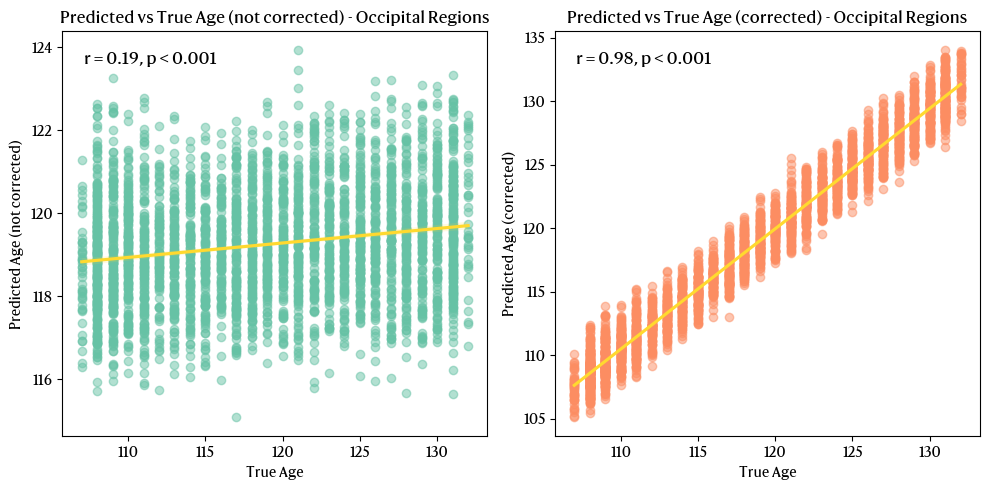

In [605]:
# Plot 2 subplots side by side.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_occipital_test, y=y_occipital_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Occipital Regions")

r, pval = scipy.stats.pearsonr(y_occipital_test["age"], y_occipital_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_occipital_test, y=y_occipital_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Occipital Regions")

r, pval = scipy.stats.pearsonr(y_occipital_test["age"], y_occipital_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.show()

#### **Applying the models on the data to derive the BrainAgeGap (BAG) estimate**

The following cells will load/apply the previously trained model and their accompanying bias correction (located in `{output_folder}/BrainAge/`). Furthermore, for all subjects, the BrainAgeGap estimate will be calculated for all models. This will result in multiple BAG estimate for each of the available model:

1. Whole-brain
2. Subcortical/cerebellar
3. Frontal
4. Temporal
5. Parietal
6. Insular
7. Limbic
8. Occipital

In [59]:
# Loading the whole-brain models.
whole_brain_model = xgb.XGBRegressor()
whole_brain_model.load_model(f"{output_dir}/brainAgeModelWholeBrain.json")

# Bias correction model.
with open(f"{output_dir}/wholeBrainBiasCorrectionModel.pkl", "rb") as f:
    whole_brain_bias_model = pickle.load(f)

# Cole bias correction model.
with open(f"{output_dir}/wholeBrainBiasCorrectionModelCole2018.pkl", "rb") as f:
    whole_brain_bias_model_cole = pickle.load(f)

# Load the whole-brain data.
whole_brain_df = pd.read_csv(f"{output_dir}/ABCDWholeBrain.csv")

# Applying the model to the whole-brain data.
X_whole_brain = whole_brain_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_whole_brain = pd.DataFrame(whole_brain_df["age"], columns=["age"])

# Scale the data.
X_whole_brain = pd.DataFrame(scale(X_whole_brain), columns=X_whole_brain.columns)

# Predict on the whole-brain data.
y_whole_brain_pred = whole_brain_model.predict(X_whole_brain)

# Apply the pretrained bias correction model.
y_whole_brain_pred_corrected = y_whole_brain_pred - whole_brain_bias_model.predict(whole_brain_df["age"].values.reshape(-1, 1))
y_whole_brain_pred_corrected_cole = (y_whole_brain_pred - whole_brain_bias_model_cole.intercept_) / whole_brain_bias_model_cole.coef_[0]

# Compute the mean absolute error.
mae_whole_brain = mean_absolute_error(y_whole_brain, y_whole_brain_pred)
print(f"Mean absolute error: {mae_whole_brain}")
# Compute the RMSLE.
rmsle_whole_brain = np.sqrt( mean_squared_log_error(y_whole_brain, y_whole_brain_pred) )
print(f"RMSLE: {rmsle_whole_brain}")
# Compute the pearson correlation coefficient.
pearson_corr_whole_brain = scipy.stats.pearsonr(y_whole_brain["age"], y_whole_brain_pred)
print(f"Pearson correlation coefficient: {pearson_corr_whole_brain[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_whole_brain_corrected = scipy.stats.pearsonr(y_whole_brain["age"], y_whole_brain_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_whole_brain_corrected[0]}")
# Compute the pearson correlation coefficient (Cole 2018 corrected).
pearson_corr_whole_brain_cole_corrected = scipy.stats.pearsonr(y_whole_brain["age"], y_whole_brain_pred_corrected_cole)
print(f"Pearson correlation coefficient (Cole 2018 corrected): {pearson_corr_whole_brain_cole_corrected[0]}")

Mean absolute error: 5.281301021575928
RMSLE: 0.05293260729925313
Pearson correlation coefficient: 0.5532439155425264
Pearson correlation coefficient (corrected): 0.9089829793118261
Pearson correlation coefficient (Cole 2018 corrected): 0.5532439115344119


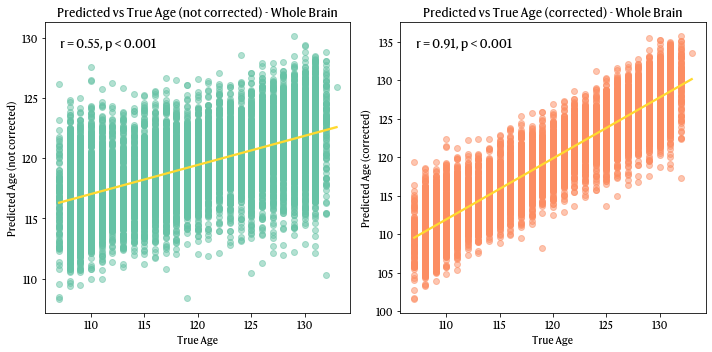

In [60]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_whole_brain, y=y_whole_brain_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Whole Brain")
r, pval = scipy.stats.pearsonr(y_whole_brain["age"], y_whole_brain_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_whole_brain, y=y_whole_brain_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Whole Brain")
r, pval = scipy.stats.pearsonr(y_whole_brain["age"], y_whole_brain_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_whole_brain_model.png", dpi=300)

In [61]:
# Extract the brain age gap for the whole-brain model.
whole_brain_BAG = y_whole_brain_pred - y_whole_brain["age"]
whole_brain_BAG_corrected = y_whole_brain_pred_corrected - y_whole_brain["age"]
whole_brain_BAG_corrected_cole = y_whole_brain_pred_corrected_cole - y_whole_brain["age"]

In [62]:
# Load the frontal model.
frontal_model = xgb.XGBRegressor()
frontal_model.load_model(f"{output_dir}/brainAgeModelFrontal.json")

# Bias correction model.
with open(f"{output_dir}/frontalBiasCorrectionModel.pkl", "rb") as f:
    frontal_bias_model = pickle.load(f)

# Load the frontal data.
# Append _vol, _thick, and _area to the regions in columns names.
frnt_thick = [f"{col}_thick" for col in frontal_col]
frnt_area = [f"{col}_area" for col in frontal_col]
frnt_vol = [f"{col}_vol" for col in frontal_col]
frontal_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + frnt_vol + frnt_thick + frnt_area]

# Applying the model to the frontal data.
X_frontal = frontal_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_frontal = pd.DataFrame(frontal_df["age"], columns=["age"])

# Scale the data.
X_frontal = pd.DataFrame(scale(X_frontal), columns=X_frontal.columns)

# Predict on the frontal data.
y_frontal_pred = frontal_model.predict(X_frontal)

# Apply the pretrained bias correction model.
y_frontal_pred_corrected = y_frontal_pred - frontal_bias_model.predict(y_frontal["age"].values.reshape(-1, 1))
#y_frontal_pred_corrected = (y_frontal_pred - frontal_bias_model.intercept_) / frontal_bias_model.coef_[0]

# Compute the mean absolute error.
mae_frontal = mean_absolute_error(y_frontal, y_frontal_pred)
print(f"Mean absolute error: {mae_frontal}")
# Compute the RMSLE.
rmsle_frontal = np.sqrt( mean_squared_log_error(y_frontal, y_frontal_pred) )
print(f"RMSLE: {rmsle_frontal}")
# Compute the pearson correlation coefficient.
pearson_corr_frontal = scipy.stats.pearsonr(y_frontal["age"], y_frontal_pred)
print(f"Pearson correlation coefficient: {pearson_corr_frontal[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_frontal_corrected = scipy.stats.pearsonr(y_frontal["age"], y_frontal_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_frontal_corrected[0]}")

Mean absolute error: 5.9172515869140625
RMSLE: 0.05776174845197805
Pearson correlation coefficient: 0.40961723025057306
Pearson correlation coefficient (corrected): 0.9561322732221783


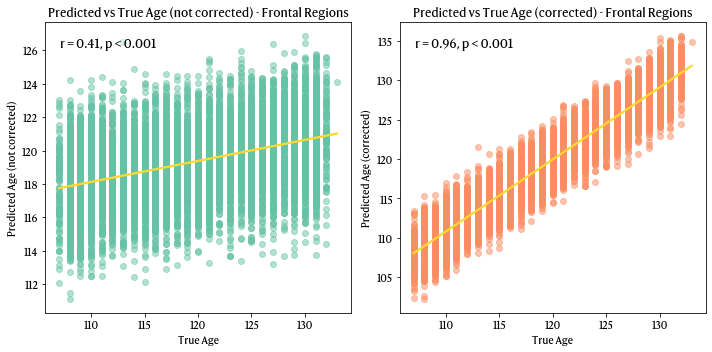

In [63]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_frontal, y=y_frontal_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Frontal Regions")
r, pval = scipy.stats.pearsonr(y_frontal["age"], y_frontal_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_frontal, y=y_frontal_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Frontal Regions")
r, pval = scipy.stats.pearsonr(y_frontal["age"], y_frontal_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_frontal_model.png", dpi=300)

In [64]:
# Extract the brain age gap for the frontal model.
frontal_BAG = y_frontal_pred - y_frontal["age"]
frontal_BAG_corrected = y_frontal_pred_corrected - y_frontal["age"]

In [68]:
# Load the parietal model.
xgb_model_parietal = xgb.XGBRegressor()
xgb_model_parietal.load_model(f"{output_dir}/brainAgeModelParietal.json")
# Load the bias correction model.
with open(f"{output_dir}/parietalBiasCorrectionModel.pkl", "rb") as f:
    parietal_bias_model = pickle.load(f)

# Load the parietal data.
# Append _vol, _thick, and _area to the regions in columns names.
parietal_vol = [f"{col}_vol" for col in parietal_col]
parietal_thick = [f"{col}_thick" for col in parietal_col]
parietal_area = [f"{col}_area" for col in parietal_col]
parietal_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + parietal_vol + parietal_thick + parietal_area]

# Applying the model to the parietal data.
X_parietal = parietal_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_parietal = pd.DataFrame(parietal_df["age"], columns=["age"])

# Scale the data.
X_parietal = pd.DataFrame(scale(X_parietal), columns=X_parietal.columns)

# Predict on the parietal data.
y_parietal_pred = xgb_model_parietal.predict(X_parietal)

# Apply the pretrained bias correction model.
y_parietal_pred_corrected = y_parietal_pred - parietal_bias_model.predict(y_parietal["age"].values.reshape(-1, 1))
#y_parietal_pred_corrected = (y_parietal_pred - mod_parietal.intercept_) / mod_parietal.coef_[0]

# Compute the mean absolute error.
mae_parietal = mean_absolute_error(y_parietal, y_parietal_pred)
print(f"Mean absolute error: {mae_parietal}")
# Compute the RMSLE.
rmsle_parietal = np.sqrt( mean_squared_log_error(y_parietal, y_parietal_pred) )
print(f"RMSLE: {rmsle_parietal}")
# Compute the pearson correlation coefficient.
pearson_corr_parietal = scipy.stats.pearsonr(y_parietal["age"], y_parietal_pred)
print(f"Pearson correlation coefficient: {pearson_corr_parietal[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_parietal_corrected = scipy.stats.pearsonr(y_parietal["age"], y_parietal_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_parietal_corrected[0]}")

Mean absolute error: 6.355567932128906
RMSLE: 0.061029159251281405
Pearson correlation coefficient: 0.27843712265345155
Pearson correlation coefficient (corrected): 0.990419204610504


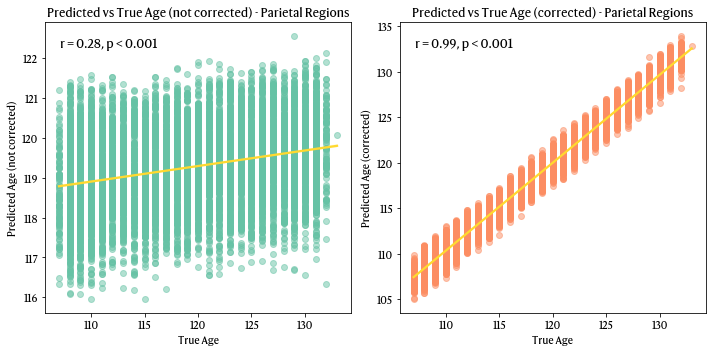

In [69]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_parietal, y=y_parietal_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Parietal Regions")
r, pval = scipy.stats.pearsonr(y_parietal["age"], y_parietal_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_parietal, y=y_parietal_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Parietal Regions")
r, pval = scipy.stats.pearsonr(y_parietal["age"], y_parietal_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_parietal_model.png", dpi=300)

In [70]:
# Extract the brainAgeGap for the parietal model.
parietal_BAG = y_parietal_pred - y_parietal["age"]
parietal_BAG_corrected = y_parietal_pred_corrected - y_parietal["age"]

In [71]:
# Load the temporal model.
xgb_model_temporal = xgb.XGBRegressor()
xgb_model_temporal.load_model(f"{output_dir}/brainAgeModelTemporal.json")

# Load the bias correction model.
with open(f"{output_dir}/temporalBiasCorrectionModel.pkl", "rb") as f:
    temporal_bias_model = pickle.load(f)

# Load the temporal data.
# Append _vol, _thick, and _area to the regions in columns names.
temporal_vol = [f"{col}_vol" for col in temporal_col]
temporal_thick = [f"{col}_thick" for col in temporal_col]
temporal_area = [f"{col}_area" for col in temporal_col]
temporal_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + temporal_vol + temporal_thick + temporal_area]

# Applying the model to the temporal data.
X_temporal = temporal_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_temporal = pd.DataFrame(temporal_df["age"], columns=["age"])

# Scale the data.
X_temporal = pd.DataFrame(scale(X_temporal), columns=X_temporal.columns)

# Predict on the temporal data.
y_temporal_pred = xgb_model_temporal.predict(X_temporal)

# Apply the pretrained bias correction model.
y_temporal_pred_corrected = y_temporal_pred - temporal_bias_model.predict(y_temporal["age"].values.reshape(-1, 1))
#y_temporal_pred_corrected = (y_temporal_pred - temporal_bias_model.intercept_) / temporal_bias_model.coef_[0]

# Compute the mean absolute error.
mae_temporal = mean_absolute_error(y_temporal, y_temporal_pred)
print(f"Mean absolute error: {mae_temporal}")
# Compute the RMSLE.
rmsle_temporal = np.sqrt( mean_squared_log_error(y_temporal, y_temporal_pred) )
print(f"RMSLE: {rmsle_temporal}")
# Compute the pearson correlation coefficient.
pearson_corr_temporal = scipy.stats.pearsonr(y_temporal["age"], y_temporal_pred)
print(f"Pearson correlation coefficient: {pearson_corr_temporal[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_temporal_corrected = scipy.stats.pearsonr(y_temporal["age"], y_temporal_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_temporal_corrected[0]}")

Mean absolute error: 6.2749924659729
RMSLE: 0.06037810669321648
Pearson correlation coefficient: 0.33168212297576305
Pearson correlation coefficient (corrected): 0.9876966929619954


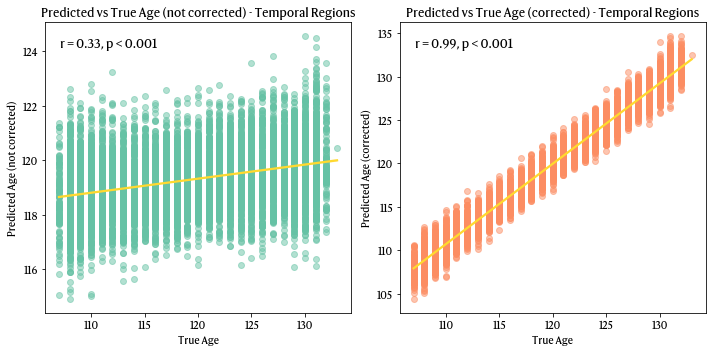

In [72]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_temporal, y=y_temporal_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Temporal Regions")
r, pval = scipy.stats.pearsonr(y_temporal["age"], y_temporal_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_temporal, y=y_temporal_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Temporal Regions")
r, pval = scipy.stats.pearsonr(y_temporal["age"], y_temporal_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_temporal_model.png", dpi=300)

In [73]:
# Extract the brain age gap for the temporal model.
temporal_BAG = y_temporal_pred - y_temporal["age"]
temporal_BAG_corrected = y_temporal_pred_corrected - y_temporal["age"]

In [74]:
# Load the subcortical model.
xgb_model_subcortical = xgb.XGBRegressor()
xgb_model_subcortical.load_model(f"{output_dir}/brainAgeModelSubcortical.json")

# Load the bias correction model.
with open(f"{output_dir}/subcorticalBiasCorrectionModel.pkl", "rb") as f:
    subcortical_bias_model = pickle.load(f)

# Load the subcortical data.
# Append _vol to the regions in columns names.
subcortical_vol = [f"{col}_vol" for col in subcortical_col]
subcortical_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + subcortical_vol]

# Applying the model to the subcortical data.
X_subcortical = subcortical_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_subcortical = pd.DataFrame(subcortical_df["age"], columns=["age"])

# Scale the data.
X_subcortical = pd.DataFrame(scale(X_subcortical), columns=X_subcortical.columns)

# Predict on the subcortical data.
y_subcortical_pred = xgb_model_subcortical.predict(X_subcortical)

# Apply the pretrained bias correction model.
y_subcortical_pred_corrected = y_subcortical_pred - subcortical_bias_model.predict(y_subcortical["age"].values.reshape(-1, 1))
#y_subcortical_pred_corrected = (y_subcortical_pred - subcortical_bias_model.intercept_) / subcortical_bias_model.coef_[0]

# Compute the mean absolute error.
mae_subcortical = mean_absolute_error(y_subcortical, y_subcortical_pred)
print(f"Mean absolute error: {mae_subcortical}")
# Compute the RMSLE.
rmsle_subcortical = np.sqrt( mean_squared_log_error(y_subcortical, y_subcortical_pred) )
print(f"RMSLE: {rmsle_subcortical}")
# Compute the pearson correlation coefficient.
pearson_corr_subcortical = scipy.stats.pearsonr(y_subcortical["age"], y_subcortical_pred)
print(f"Pearson correlation coefficient: {pearson_corr_subcortical[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_subcortical_corrected = scipy.stats.pearsonr(y_subcortical["age"], y_subcortical_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_subcortical_corrected[0]}")

Mean absolute error: 6.107405185699463
RMSLE: 0.05931157258228701
Pearson correlation coefficient: 0.33564094008108813
Pearson correlation coefficient (corrected): 0.9612216593657346


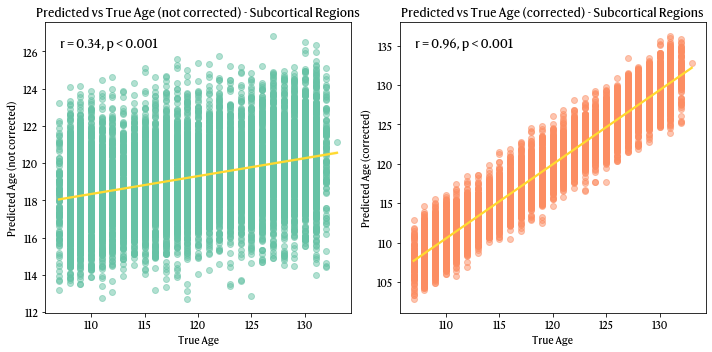

In [75]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_subcortical, y=y_subcortical_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Subcortical Regions")
r, pval = scipy.stats.pearsonr(y_subcortical["age"], y_subcortical_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_subcortical, y=y_subcortical_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Subcortical Regions")
r, pval = scipy.stats.pearsonr(y_subcortical["age"], y_subcortical_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_subcortical_model.png", dpi=300)

In [76]:
# Extract the brain age gap for the subcortical model.
subcortical_BAG = y_subcortical_pred - y_subcortical["age"]
subcortical_BAG_corrected = y_subcortical_pred_corrected - y_subcortical["age"]

In [77]:
# Load the insula model.
xgb_model_insular = xgb.XGBRegressor()
xgb_model_insular.load_model(f"{output_dir}/brainAgeModelInsula.json")

# Load the bias correction model.
with open(f"{output_dir}/insulaBiasCorrectionModel.pkl", "rb") as f:
    insular_bias_model = pickle.load(f)

# Load the insula data.
# Append _vol, _thick, and _area to the regions in columns names.
insula_vol = [f"{col}_vol" for col in insular_col]
insula_thick = [f"{col}_thick" for col in insular_col]
insula_area = [f"{col}_area" for col in insular_col]
insula_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + insula_vol + insula_thick + insula_area]

# Applying the model to the insula data.
X_insula = insula_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_insula = pd.DataFrame(insula_df["age"], columns=["age"])

# Scale the data.
X_insula = pd.DataFrame(scale(X_insula), columns=X_insula.columns)

# Predict on the insula data.
y_insula_pred = xgb_model_insular.predict(X_insula)

# Apply the pretrained bias correction model.
y_insula_pred_corrected = y_insula_pred - insular_bias_model.predict(y_insula["age"].values.reshape(-1, 1))
#y_insula_pred_corrected = (y_insula_pred - insular_bias_model.intercept_) / insular_bias_model.coef_[0]

# Compute the mean absolute error.
mae_insula = mean_absolute_error(y_insula, y_insula_pred)
print(f"Mean absolute error: {mae_insula}")
# Compute the RMSLE.
rmsle_insula = np.sqrt( mean_squared_log_error(y_insula, y_insula_pred) )
print(f"RMSLE: {rmsle_insula}")
# Compute the pearson correlation coefficient.
pearson_corr_insula = scipy.stats.pearsonr(y_insula["age"], y_insula_pred)
print(f"Pearson correlation coefficient: {pearson_corr_insula[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_insula_corrected = scipy.stats.pearsonr(y_insula["age"], y_insula_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_insula_corrected[0]}")


Mean absolute error: 6.45949125289917
RMSLE: 0.06204928551823237
Pearson correlation coefficient: 0.1711266990777736
Pearson correlation coefficient (corrected): 0.9922556498115226


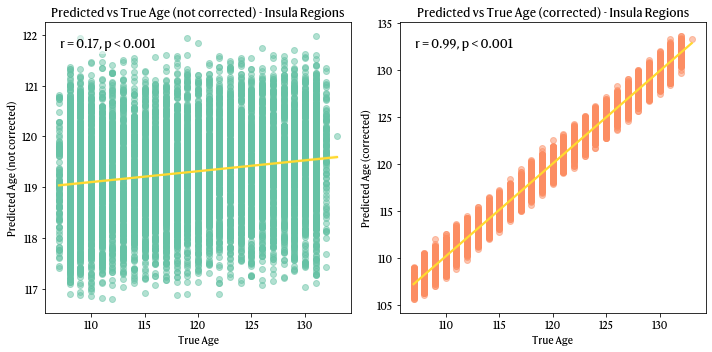

In [78]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_insula, y=y_insula_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Insula Regions")
r, pval = scipy.stats.pearsonr(y_insula["age"], y_insula_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_insula, y=y_insula_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Insula Regions")
r, pval = scipy.stats.pearsonr(y_insula["age"], y_insula_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_insula_model.png", dpi=300)

In [79]:
# Extract the brain age gap for the insula model.
insula_BAG = y_insula_pred - y_insula["age"]
insula_BAG_corrected = y_insula_pred_corrected - y_insula["age"]

In [80]:
# Load the limbic model.
xgb_model_limbic = xgb.XGBRegressor()
xgb_model_limbic.load_model(f"{output_dir}/brainAgeModelLimbic.json")

# Load the bias correction model.
with open(f"{output_dir}/limbicBiasCorrectionModel.pkl", "rb") as f:
    limbic_bias_model = pickle.load(f)

# Load the limbic data.
# Append _vol, _thick, and _area to the regions in columns names.
limbic_vol = [f"{col}_vol" for col in limbic_col]
limbic_thick = [f"{col}_thick" for col in limbic_col]
limbic_area = [f"{col}_area" for col in limbic_col]
limbic_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + limbic_vol + limbic_thick + limbic_area]

# Applying the model to the limbic data.
X_limbic = limbic_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_limbic = pd.DataFrame(limbic_df["age"], columns=["age"])

# Scale the data.
X_limbic = pd.DataFrame(scale(X_limbic), columns=X_limbic.columns)

# Predict on the limbic data.
y_limbic_pred = xgb_model_limbic.predict(X_limbic)

# Apply the pretrained bias correction model.
y_limbic_pred_corrected = y_limbic_pred - limbic_bias_model.predict(y_limbic["age"].values.reshape(-1, 1))
#y_limbic_pred_corrected = (y_limbic_pred - limbic_bias_model.intercept_) / limbic_bias_model.coef_[0]

# Compute the mean absolute error.
mae_limbic = mean_absolute_error(y_limbic, y_limbic_pred)
print(f"Mean absolute error: {mae_limbic}")
# Compute the RMSLE.
rmsle_limbic = np.sqrt( mean_squared_log_error(y_limbic, y_limbic_pred) )
print(f"RMSLE: {rmsle_limbic}")
# Compute the pearson correlation coefficient.
pearson_corr_limbic = scipy.stats.pearsonr(y_limbic["age"], y_limbic_pred)
print(f"Pearson correlation coefficient: {pearson_corr_limbic[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_limbic_corrected = scipy.stats.pearsonr(y_limbic["age"], y_limbic_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_limbic_corrected[0]}")

Mean absolute error: 5.687329292297363
RMSLE: 0.05595568760162437
Pearson correlation coefficient: 0.512557017229164
Pearson correlation coefficient (corrected): 0.9442995302709732


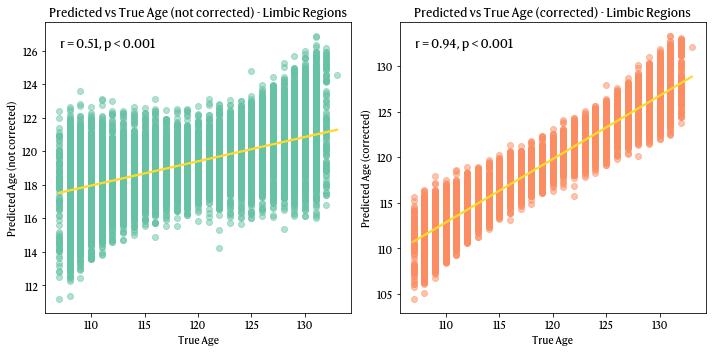

In [81]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_limbic, y=y_limbic_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Limbic Regions")
r, pval = scipy.stats.pearsonr(y_limbic["age"], y_limbic_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
            transform=ax[0].transAxes, fontsize=12,
            verticalalignment="top", horizontalalignment="left",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_limbic, y=y_limbic_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Limbic Regions")
r, pval = scipy.stats.pearsonr(y_limbic["age"], y_limbic_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
            transform=ax[1].transAxes, fontsize=12,
            verticalalignment="top", horizontalalignment="left",
            bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_limbic_model.png", dpi=300)


In [82]:
# Extract the brain age gap for the limbic model.
limbic_BAG = y_limbic_pred - y_limbic["age"]
limbic_BAG_corrected = y_limbic_pred_corrected - y_limbic["age"]

In [83]:
# Load the occipital model.
xgb_model_occipital = xgb.XGBRegressor()
xgb_model_occipital.load_model(f"{output_dir}/brainAgeModelOccipital.json")

# Load the bias correction model.
with open(f"{output_dir}/occipitalBiasCorrectionModel.pkl", "rb") as f:
    occipital_bias_model = pickle.load(f)

# Load the occipital data.
# Append _vol, _thick, and _area to the regions in columns names.
occipital_vol = [f"{col}_vol" for col in occipital_col]
occipital_thick = [f"{col}_thick" for col in occipital_col]
occipital_area = [f"{col}_area" for col in occipital_col]
occipital_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + occipital_vol + occipital_thick + occipital_area]

# Applying the model to the occipital data.
X_occipital = occipital_df.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_occipital = pd.DataFrame(occipital_df["age"], columns=["age"])

# Scale the data.
X_occipital = pd.DataFrame(scale(X_occipital), columns=X_occipital.columns)

# Predict on the occipital data.
y_occipital_pred = xgb_model_occipital.predict(X_occipital)

# Apply the pretrained bias correction model.
y_occipital_pred_corrected = y_occipital_pred - occipital_bias_model.predict(y_occipital["age"].values.reshape(-1, 1))
#y_occipital_pred_corrected = (y_occipital_pred - occipital_bias_model.intercept_) / occipital_bias_model.coef_[0]

# Compute the mean absolute error.
mae_occipital = mean_absolute_error(y_occipital, y_occipital_pred)
print(f"Mean absolute error: {mae_occipital}")
# Compute the RMSLE.
rmsle_occipital = np.sqrt( mean_squared_log_error(y_occipital, y_occipital_pred) )
print(f"RMSLE: {rmsle_occipital}")
# Compute the pearson correlation coefficient.
pearson_corr_occipital = scipy.stats.pearsonr(y_occipital["age"], y_occipital_pred)
print(f"Pearson correlation coefficient: {pearson_corr_occipital[0]}")
# Compute the pearson correlation coefficient (corrected).
pearson_corr_occipital_corrected = scipy.stats.pearsonr(y_occipital["age"], y_occipital_pred_corrected)
print(f"Pearson correlation coefficient (corrected): {pearson_corr_occipital_corrected[0]}")

Mean absolute error: 6.3070149421691895
RMSLE: 0.06081123475408125
Pearson correlation coefficient: 0.269620608560977
Pearson correlation coefficient (corrected): 0.9833756021693983


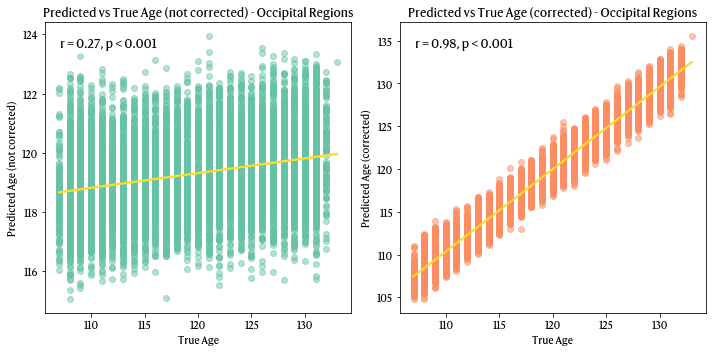

In [84]:
# VIsualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Plot the predicted vs true values.
sns.regplot(x=y_occipital, y=y_occipital_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Occipital Regions")
r, pval = scipy.stats.pearsonr(y_occipital["age"], y_occipital_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

# Plot the predicted vs true values (corrected).
sns.regplot(x=y_occipital, y=y_occipital_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Occipital Regions")
r, pval = scipy.stats.pearsonr(y_occipital["age"], y_occipital_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_occipital_model.png", dpi=300)

In [85]:
# Extract the brain age gap for the occipital model.
occipital_BAG = y_occipital_pred - y_occipital["age"]
occipital_BAG_corrected = y_occipital_pred_corrected - y_occipital["age"]

In [86]:
# Merging together all the brain age gaps estimates into a single dataframe including
# all identifiers.
bag_df = pd.DataFrame({
    "sid": whole_brain_df["sid"],
    "family_id": whole_brain_df["family_id"],
    "site": whole_brain_df["site"],
    "age": whole_brain_df["age"],
    "sex": whole_brain_df["sex"],
    "handedness": whole_brain_df["handedness"]
    },
    columns=["sid", "family_id", "site", "age", "sex", "handedness"])

bag_df["BAG_WholeBrain"] = whole_brain_BAG
bag_df["BAG_Frontal"] = frontal_BAG
bag_df["BAG_Parietal"] = parietal_BAG
bag_df["BAG_Temporal"] = temporal_BAG
bag_df["BAG_Subcortical"] = subcortical_BAG
bag_df["BAG_Insula"] = insula_BAG
bag_df["BAG_Limbic"] = limbic_BAG
bag_df["BAG_Occipital"] = occipital_BAG
bag_df["BAG_WholeBrain_Corrected"] = whole_brain_BAG_corrected
bag_df["BAG_Frontal_Corrected"] = frontal_BAG_corrected
bag_df["BAG_Parietal_Corrected"] = parietal_BAG_corrected
bag_df["BAG_Temporal_Corrected"] = temporal_BAG_corrected
bag_df["BAG_Subcortical_Corrected"] = subcortical_BAG_corrected
bag_df["BAG_Insula_Corrected"] = insula_BAG_corrected
bag_df["BAG_Limbic_Corrected"] = limbic_BAG_corrected
bag_df["BAG_Occipital_Corrected"] = occipital_BAG_corrected
bag_df["BAG_WholeBrain_Corrected_Cole"] = whole_brain_BAG_corrected_cole

# Save the brain age gaps estimates.
bag_df.to_csv(f"{output_dir}/brainAgeGaps.csv", index=False)

#### **Building models for male and female participants separately**

Recent studies have suggested different maturation rate between males and females.
Therefore, we will build independent models for both, and use the derived
BAG in sentivity analyses. 

In [249]:
# Look at the df without dx.
print("Number of subjects without dx:", df.shape[0])

# Let's split the data into male and female.
df_male = df[df['sex'] == 2]
df_female = df[df['sex'] == 1]

# Further split the data into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, test_size=0.6, random_state=1234)
train_idx_male, test_idx_male = next(gss.split(df_male, groups=df_male['family_id']))
train_idx_female, test_idx_female = next(gss.split(df_female, groups=df_female['family_id']))

# Assertions to check the splits.
assert len(train_idx_male) + len(test_idx_male) == len(df_male), "Train and test sets do not match the original data length."
assert len(train_idx_female) + len(test_idx_female) == len(df_female), "Train and test sets do not match the original data length."
# Assert that the family_id is not in the train and test sets.
assert len(set(df_male['family_id'].iloc[train_idx_male]).intersection(set(df_male['family_id'].iloc[test_idx_male]))) == 0, "Family IDs overlap between train and test sets."
assert len(set(df_female['family_id'].iloc[train_idx_female]).intersection(set(df_female['family_id'].iloc[test_idx_female]))) == 0, "Family IDs overlap between train and test sets."

# Create the actual training and testing sets.
X_train_df_male = df_male.iloc[train_idx_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_train_df_male = pd.DataFrame(df_male.iloc[train_idx_male]["age"], columns=["age"])
X_test_df_male = df_male.iloc[test_idx_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_test_df_male = pd.DataFrame(df_male.iloc[test_idx_male]["age"], columns=["age"])
X_train_df_female = df_female.iloc[train_idx_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_train_df_female = pd.DataFrame(df_female.iloc[train_idx_female]["age"], columns=["age"])
X_test_df_female = df_female.iloc[test_idx_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_test_df_female = pd.DataFrame(df_female.iloc[test_idx_female]["age"], columns=["age"])

# Ensure age is not significantly different between training and testing sets.
_, pval = scipy.stats.ttest_ind(y_train_df_male["age"], y_test_df_male["age"])
assert pval > 0.05, "Age distribution is significantly different between male train and test sets."

_, pval = scipy.stats.ttest_ind(y_train_df_female["age"], y_test_df_female["age"])
assert pval > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_df_male = pd.DataFrame(scale(X_train_df_male), columns=X_train_df_male.columns)
X_test_df_male = pd.DataFrame(scale(X_test_df_male), columns=X_test_df_male.columns)
X_train_df_female = pd.DataFrame(scale(X_train_df_female), columns=X_train_df_female.columns)
X_test_df_female = pd.DataFrame(scale(X_test_df_female), columns=X_test_df_female.columns)


Number of subjects without dx: 6582


In [250]:
# Whole-brain model training and prediction for male subjects.
xgb_model_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_male = BayesSearchCV(
    xgb_model_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data.
clf_male.fit(X_train_df_male, y_train_df_male)
# Print the best parameters.
print("Best parameters found: ", clf_male.best_params_)
# Print the best score.
print("Best score found: ", clf_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.8205772586141448, gamma=0.0048314885261063825, learning_rate=0.049546209780049616, max_depth=8, min_child_weight=4, n_estimators=997, reg_alpha=3.86969598076506e-06, reg_lambda=0.025233317981398443, subsample=0.8713214715121402; total time=  38.7s
[CV] END colsample_bytree=0.8205772586141448, gamma=0.0048314885261063825, learning_rate=0.049546209780049616, max_depth=8, min_child_weight=4, n_estimators=997, reg_alpha=3.86969598076506e-06, reg_lambda=0.025233317981398443, subsample=0.8713214715121402; total time=  38.8s
[CV] END colsample_bytree=0.8205772586141448, gamma=0.0048314885261063825, learning_rate=0.049546209780049616, max_depth=8, min_child_weight=4, n_estimators=997, reg_alpha=3.86969598076506e-06, reg_lambda=0.025233317981398443, subsample=0.8713214715121402; total time=  39.3s
[CV] END colsample_bytree=0.8205772586141448, gamma=0.0048314885261063825, learning_rate=0.049546209780049616, ma

In [251]:
# Fitting the model with the best parameters.
xgb_model_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_male.best_params_["n_estimators"],
    max_depth=clf_male.best_params_["max_depth"],
    gamma=clf_male.best_params_["gamma"],
    reg_alpha=clf_male.best_params_["reg_alpha"],
    reg_lambda=clf_male.best_params_["reg_lambda"],
    learning_rate=clf_male.best_params_["learning_rate"],
    subsample=clf_male.best_params_["subsample"],
    colsample_bytree=clf_male.best_params_["colsample_bytree"],
    min_child_weight=clf_male.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_male.fit(X_train_df_male, y_train_df_male)

# Predict on the training data.
y_train_pred_male = xgb_model_male.predict(X_train_df_male)

# Calculate the mean absolute error on the training data.
mae_train_male = mean_absolute_error(y_train_df_male, y_train_pred_male)
print(f"Mean absolute error on training data for male subjects: {mae_train_male}")
# Calculate the explained variance score on the training data.
evs_train_male = explained_variance_score(y_train_df_male, y_train_pred_male)
print(f"Explained variance score on training data for male subjects: {evs_train_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_male = scipy.stats.pearsonr(y_train_df_male["age"], y_train_pred_male)[0]
print(f"Pearson correlation coefficient on training data for male subjects: {pearson_corr_male}")

# Make predictions on the test data.
y_pred_male = xgb_model_male.predict(X_test_df_male)

# Calculate the mean absolute error on the test data.
mae_test_male = mean_absolute_error(y_test_df_male, y_pred_male)
print(f"Mean absolute error on test data for male subjects: {mae_test_male}")

# Calculate the explained variance score on the test data.
evs_test_male = explained_variance_score(y_test_df_male, y_pred_male)
print(f"Explained variance score on test data for male subjects: {evs_test_male}")

# Compute the pearson correlation coefficient on the test data.
pearson_corr_male = scipy.stats.pearsonr(y_test_df_male["age"], y_pred_male)[0]
print(f"Pearson correlation coefficient on test data for male subjects: {pearson_corr_male}")

# Save the model.
xgb_model_male.save_model("brainAgeModelWholeBrainMale.json")


Mean absolute error on training data for male subjects: 3.1454415321350098
Explained variance score on training data for male subjects: 0.7509993830867778
Pearson correlation coefficient on training data for male subjects: 0.9335160179755029
Mean absolute error on test data for male subjects: 5.984377384185791
Explained variance score on test data for male subjects: 0.11576374370992037
Pearson correlation coefficient on test data for male subjects: 0.3410691069437146


In [252]:
# Compute the bias using the training data.
mod_male = compute_bias(y_train_df_male, y_train_pred_male)

# Apply the bias correction to the test data.
y_pred_corrected_male = y_pred_male - mod_male.predict(y_test_df_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("wholeBrainBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_male = mean_absolute_error(y_test_df_male["age"], y_pred_corrected_male)
print(f"Mean absolute error on test data for male subjects after bias correction: {mae_test_corrected_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_male = scipy.stats.pearsonr(y_test_df_male["age"], y_pred_corrected_male)[0]
print(f"Pearson correlation coefficient on test data for male subjects after bias correction: {pearson_corr_corrected_male}")

Mean absolute error on test data for male subjects after bias correction: 3.351176443970498
Pearson correlation coefficient on test data for male subjects after bias correction: 0.8596088094997886


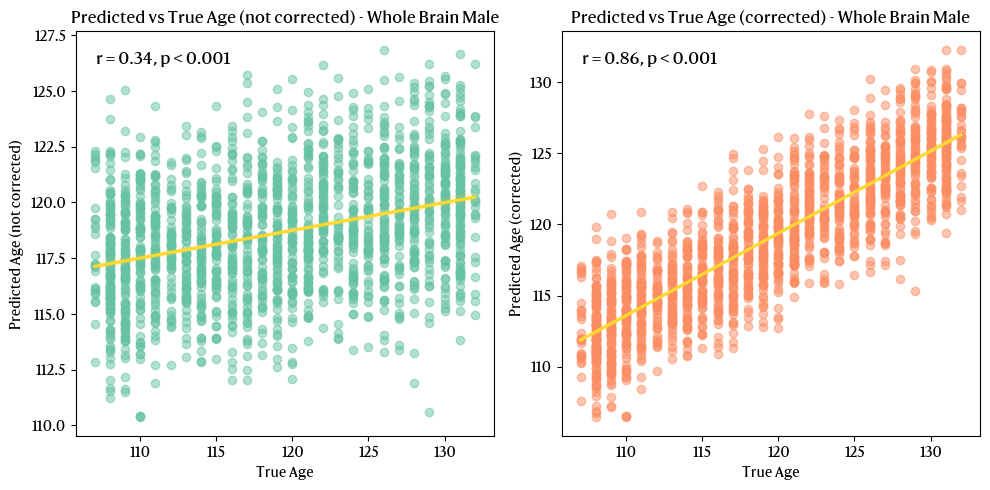

In [253]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_df_male, y=y_pred_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Whole Brain Male")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_df_male["age"], y_pred_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_df_male, y=y_pred_corrected_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Whole Brain Male")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_df_male["age"], y_pred_corrected_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [254]:
# Whole-brain model training and prediction for female subjects.
xgb_model_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_female = BayesSearchCV(
    xgb_model_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data.
clf_female.fit(X_train_df_female, y_train_df_female)
# Print the best parameters.
print("Best parameters found: ", clf_female.best_params_)
# Print the best score.
print("Best score found: ", clf_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.6264819261307103, gamma=0.07401724840546227, learning_rate=0.004443100144665409, max_depth=7, min_child_weight=4, n_estimators=118, reg_alpha=1.1268291596965973e-06, reg_lambda=0.0003098872638440618, subsample=0.9297558922182229; total time=   8.1s
[CV] END colsample_bytree=0.6264819261307103, gamma=0.07401724840546227, learning_rate=0.004443100144665409, max_depth=7, min_child_weight=4, n_estimators=118, reg_alpha=1.1268291596965973e-06, reg_lambda=0.0003098872638440618, subsample=0.9297558922182229; total time=   8.1s
[CV] END colsample_bytree=0.6264819261307103, gamma=0.07401724840546227, learning_rate=0.004443100144665409, max_depth=7, min_child_weight=4, n_estimators=118, reg_alpha=1.1268291596965973e-06, reg_lambda=0.0003098872638440618, subsample=0.9297558922182229; total time=   8.3s
[CV] END colsample_bytree=0.6264819261307103, gamma=0.07401724840546227, learning_rate=0.004443100144665409, m

In [255]:
# Fitting the model with the best parameters.
xgb_model_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_female.best_params_["n_estimators"],
    max_depth=clf_female.best_params_["max_depth"],
    gamma=clf_female.best_params_["gamma"],
    reg_alpha=clf_female.best_params_["reg_alpha"],
    reg_lambda=clf_female.best_params_["reg_lambda"],
    learning_rate=clf_female.best_params_["learning_rate"],
    subsample=clf_female.best_params_["subsample"],
    colsample_bytree=clf_female.best_params_["colsample_bytree"],
    min_child_weight=clf_female.best_params_["min_child_weight"],
)

# Fit the model to the training data.
xgb_model_female.fit(X_train_df_female, y_train_df_female)

# Predict on the training data.
y_train_pred_female = xgb_model_female.predict(X_train_df_female)

# Calculate the mean absolute error on the training data.
mae_train_female = mean_absolute_error(y_train_df_female, y_train_pred_female)
print(f"Mean absolute error on training data for female subjects: {mae_train_female}")
# Calculate the explained variance score on the training data.
evs_train_female = explained_variance_score(y_train_df_female, y_train_pred_female)
print(f"Explained variance score on training data for female subjects: {evs_train_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_female = scipy.stats.pearsonr(y_train_df_female["age"], y_train_pred_female)[0]
print(f"Pearson correlation coefficient on training data for female subjects: {pearson_corr_female}")

# Make predictions on the test data.
y_pred_female = xgb_model_female.predict(X_test_df_female)

# Calculate the mean absolute error on the test data.
mae_test_female = mean_absolute_error(y_test_df_female, y_pred_female)
print(f"Mean absolute error on test data for female subjects: {mae_test_female}")

# Calculate the explained variance score on the test data.
evs_test_female = explained_variance_score(y_test_df_female, y_pred_female)
print(f"Explained variance score on test data for female subjects: {evs_test_female}")

# Compute the pearson correlation coefficient on the test data.
pearson_corr_female = scipy.stats.pearsonr(y_test_df_female["age"], y_pred_female)[0]
print(f"Pearson correlation coefficient on test data for female subjects: {pearson_corr_female}")

# Save the model.
xgb_model_female.save_model("brainAgeModelWholeBrainFemale.json")


Mean absolute error on training data for female subjects: 3.852725028991699
Explained variance score on training data for female subjects: 0.6359576706896097
Pearson correlation coefficient on training data for female subjects: 0.8921444881681009
Mean absolute error on test data for female subjects: 6.192561149597168
Explained variance score on test data for female subjects: 0.09862723543481089
Pearson correlation coefficient on test data for female subjects: 0.31442313285274887


In [256]:
# Compute the bias using the training data.
mod_female = compute_bias(y_train_df_female, y_train_pred_female)

# Apply the bias correction to the test data.
y_pred_corrected_female = y_pred_female - mod_female.predict(y_test_df_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("wholeBrainBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_female = mean_absolute_error(y_test_df_female["age"], y_pred_corrected_female)
print(f"Mean absolute error on test data for female subjects after bias correction: {mae_test_corrected_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_female = scipy.stats.pearsonr(y_test_df_female["age"], y_pred_corrected_female)[0]
print(f"Pearson correlation coefficient on test data for female subjects after bias correction: {pearson_corr_corrected_female}")

Mean absolute error on test data for female subjects after bias correction: 2.851011564374369
Pearson correlation coefficient on test data for female subjects after bias correction: 0.9046730595527721


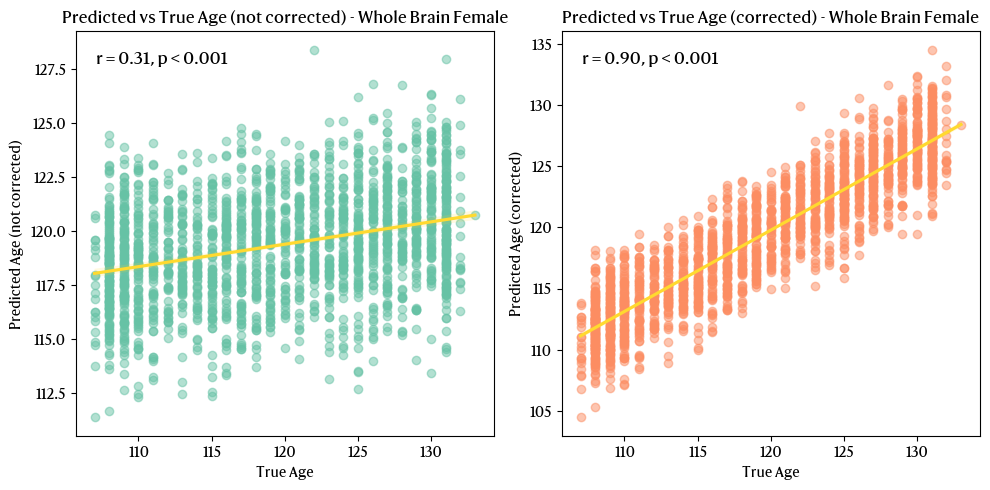

In [257]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_df_female, y=y_pred_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Whole Brain Female")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_df_female["age"], y_pred_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_df_female, y=y_pred_corrected_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Whole Brain Female")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_df_female["age"], y_pred_corrected_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Building the subcortical structures model for male and female individually.**

Model for the subcortical structures include the following regions (R and L denotes right/left):

* **Amyg_L(R)_2_1**: mAmyg, medial amygdala
* **Amyg_L(R)_2_2**: lAmyg, lateral amygdala
* **Hipp_L(R)_2_1**: rHipp, rostral hippocampus
* **Hipp_L(R)_2_2**: cHipp, caudal hippocampus
* **BG_L(R)_6_1**: vCa, ventral caudate
* **BG_L(R)_6_2**: GP, globus pallidum
* **BG_L(R)_6_3**: NAC, nucleus accumbens
* **BG_L(R)_6_4**: vmPu, ventromedial putamen
* **BG_L(R)_6_5**: dCa, dorsal caudate
* **BG_L(R)_6_6**: dlPu, dorsolateral putamen
* **Tha_L(R)_8_1**: mPFtha, medial pre-frontal thalamus
* **Tha_L(R)_8_2**: mPMtha, pre-motor thalamus
* **Tha_L(R)_8_3**: Stha, sensory thalamus
* **Tha_L(R)_8_4**: rTtha, rostral temporal thalamus
* **Tha_L(R)_8_5**: PPtha, posterior parietal thalamus
* **Tha_L(R)_8_6**: Otha, occipital thalamus
* **Tha_L(R)_8_7**: cTtha, caudal temporal thalamus
* **Tha_L(R)_8_8**: lPFtha, 3lateral pre-frontal thalamus

In [258]:
# Append _vol, _thick, and _area to the regions in columns names.
sub_vol = [f"{col}_vol" for col in subcortical_col]

# Select only the subcortical regions (and identifiers).
subcortical_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + sub_vol]

# Split into male and female subcortical dataframes.
subcortical_male_df = subcortical_df[subcortical_df["sex"] == 2]
subcortical_female_df = subcortical_df[subcortical_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_sub_male, test_idx_sub_male = next(gss.split(subcortical_male_df, groups=subcortical_male_df["family_id"]))
train_idx_sub_female, test_idx_sub_female = next(gss.split(subcortical_female_df, groups=subcortical_female_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_sub_male) + len(test_idx_sub_male) == len(subcortical_male_df), "Train and test lengths do not match the original dataset length."
assert len(train_idx_sub_female) + len(test_idx_sub_female) == len(subcortical_female_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(subcortical_male_df["family_id"].iloc[train_idx_sub_male]).intersection(set(subcortical_male_df["family_id"].iloc[test_idx_sub_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(subcortical_female_df["family_id"].iloc[train_idx_sub_female]).intersection(set(subcortical_female_df["family_id"].iloc[test_idx_sub_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_sub_male = subcortical_male_df.iloc[train_idx_sub_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_sub_male = pd.DataFrame(subcortical_male_df.iloc[train_idx_sub_male]["age"], columns=["age"])
X_test_sub_male = subcortical_male_df.iloc[test_idx_sub_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_test_sub_male = pd.DataFrame(subcortical_male_df.iloc[test_idx_sub_male]["age"], columns=["age"])

X_train_sub_female = subcortical_female_df.iloc[train_idx_sub_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_sub_female = pd.DataFrame(subcortical_female_df.iloc[train_idx_sub_female]["age"], columns=["age"])
X_test_sub_female = subcortical_female_df.iloc[test_idx_sub_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_test_sub_female = pd.DataFrame(subcortical_female_df.iloc[test_idx_sub_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_sub_male["age"], y_test_sub_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."
_, p_value = scipy.stats.ttest_ind(y_train_sub_female["age"], y_test_sub_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_sub_male = pd.DataFrame(scale(X_train_sub_male), columns=X_train_sub_male.columns)
X_test_sub_male = pd.DataFrame(scale(X_test_sub_male), columns=X_test_sub_male.columns)
X_train_sub_female = pd.DataFrame(scale(X_train_sub_female), columns=X_train_sub_female.columns)
X_test_sub_female = pd.DataFrame(scale(X_test_sub_female), columns=X_test_sub_female.columns)

In [259]:
xgb_model_sub_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_sub_male = BayesSearchCV(
    xgb_model_sub_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_sub_male.fit(X_train_sub_male, y_train_sub_male)

# Print the best parameters.
print("Best parameters found: ", clf_sub_male.best_params_)

# Print the best score.
print("Best score found: ", clf_sub_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.9444508353494993, gamma=0.03349009127381803, learning_rate=0.030659572407847, max_depth=9, min_child_weight=4, n_estimators=1611, reg_alpha=2.1431149330351404, reg_lambda=0.0022423892847300148, subsample=0.6715224756486197; total time=   5.7s
[CV] END colsample_bytree=0.9444508353494993, gamma=0.03349009127381803, learning_rate=0.030659572407847, max_depth=9, min_child_weight=4, n_estimators=1611, reg_alpha=2.1431149330351404, reg_lambda=0.0022423892847300148, subsample=0.6715224756486197; total time=   5.7s
[CV] END colsample_bytree=0.9444508353494993, gamma=0.03349009127381803, learning_rate=0.030659572407847, max_depth=9, min_child_weight=4, n_estimators=1611, reg_alpha=2.1431149330351404, reg_lambda=0.0022423892847300148, subsample=0.6715224756486197; total time=   5.7s
[CV] END colsample_bytree=0.9444508353494993, gamma=0.03349009127381803, learning_rate=0.030659572407847, max_depth=9, min_child

In [260]:
xgb_model_sub_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_sub_male.best_params_["n_estimators"],
    max_depth=clf_sub_male.best_params_["max_depth"],
    gamma=clf_sub_male.best_params_["gamma"],
    reg_alpha=clf_sub_male.best_params_["reg_alpha"],
    reg_lambda=clf_sub_male.best_params_["reg_lambda"],
    learning_rate=clf_sub_male.best_params_["learning_rate"],
    subsample=clf_sub_male.best_params_["subsample"],
    colsample_bytree=clf_sub_male.best_params_["colsample_bytree"],
    min_child_weight=clf_sub_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_sub_male.fit(X_train_sub_male, y_train_sub_male)

# Predict on the training data.
y_train_pred_sub_male = xgb_model_sub_male.predict(X_train_sub_male)

# Calculate the mean absolute error on the training data.
mae_train_sub_male = mean_absolute_error(y_train_sub_male, y_train_pred_sub_male)
print(f"Mean absolute error on training data: {mae_train_sub_male}")
# Calculate the explained variance score on the training data.
evs_train_sub_male = explained_variance_score(y_train_sub_male, y_train_pred_sub_male)
print(f"Explained variance score on training data: {evs_train_sub_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_sub_male = scipy.stats.pearsonr(y_train_sub_male["age"], y_train_pred_sub_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_sub_male}")

# Make predictions on the test data.
y_pred_sub_male = xgb_model_sub_male.predict(X_test_sub_male)

# Calculate the mean absolute error on the test data.
mae_test_sub_male = mean_absolute_error(y_test_sub_male, y_pred_sub_male)
print(f"Mean absolute error on test data: {mae_test_sub_male}")
# Calculate the explained variance score on the test data.
evs_test_sub_male = explained_variance_score(y_test_sub_male, y_pred_sub_male)
print(f"Explained variance score on test data: {evs_test_sub_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_sub_male = scipy.stats.pearsonr(y_test_sub_male["age"], y_pred_sub_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_sub_male}")

# Save the model.
xgb_model_sub_male.save_model("brainAgeModelSubcorticalMale.json")


Mean absolute error on training data: 4.95159387588501
Explained variance score on training data: 0.4018332325621988
Pearson correlation coefficient on training data: 0.806666965235899
Mean absolute error on test data: 6.2545485496521
Explained variance score on test data: 0.0535256439204963
Pearson correlation coefficient on test data: 0.23141938089872868


In [261]:
# Compute the bias using the training data.
mod_sub_male = compute_bias(y_train_sub_male, y_train_pred_sub_male)

# Apply the bias correction to the test data.
y_pred_corrected_sub_male = y_pred_sub_male - mod_sub_male.predict(y_test_sub_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("subcorticalBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_sub_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_sub_male = mean_absolute_error(y_test_sub_male["age"], y_pred_corrected_sub_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_sub_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_sub_male = scipy.stats.pearsonr(y_test_sub_male["age"], y_pred_corrected_sub_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_sub_male}")

Mean absolute error on test data after bias correction: 1.7604095957428751
Pearson correlation coefficient on test data after bias correction: 0.9645824732861615


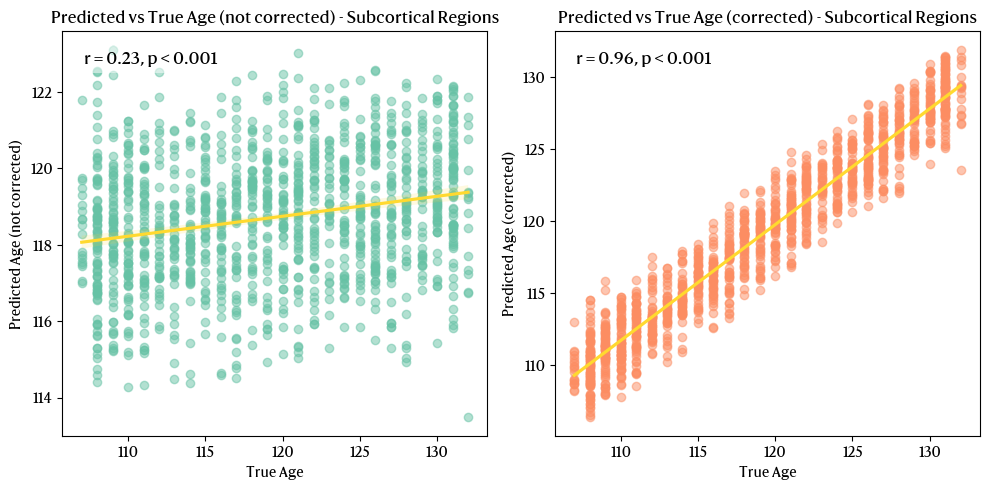

In [262]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_sub_male["age"], y=y_pred_sub_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Subcortical Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_sub_male["age"], y_pred_sub_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_sub_male["age"], y=y_pred_corrected_sub_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Subcortical Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_sub_male["age"], y_pred_corrected_sub_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [263]:
xgb_model_sub_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_sub_female = BayesSearchCV(
    xgb_model_sub_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_sub_female.fit(X_train_sub_female, y_train_sub_female)

# Print the best parameters.
print("Best parameters found: ", clf_sub_female.best_params_)

# Print the best score.
print("Best score found: ", clf_sub_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.703293042677542, gamma=7.03989028310078, learning_rate=0.005583289818056259, max_depth=4, min_child_weight=4, n_estimators=1990, reg_alpha=0.0003162788224973038, reg_lambda=2.9664977392100447e-05, subsample=0.7437914343014651; total time=   2.1s
[CV] END colsample_bytree=0.703293042677542, gamma=7.03989028310078, learning_rate=0.005583289818056259, max_depth=4, min_child_weight=4, n_estimators=1990, reg_alpha=0.0003162788224973038, reg_lambda=2.9664977392100447e-05, subsample=0.7437914343014651; total time=   2.2s
[CV] END colsample_bytree=0.703293042677542, gamma=7.03989028310078, learning_rate=0.005583289818056259, max_depth=4, min_child_weight=4, n_estimators=1990, reg_alpha=0.0003162788224973038, reg_lambda=2.9664977392100447e-05, subsample=0.7437914343014651; total time=   2.2s
[CV] END colsample_bytree=0.703293042677542, gamma=7.03989028310078, learning_rate=0.005583289818056259, max_depth=4, m

In [264]:
xgb_model_sub_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_sub_female.best_params_["n_estimators"],
    max_depth=clf_sub_female.best_params_["max_depth"],
    gamma=clf_sub_female.best_params_["gamma"],
    reg_alpha=clf_sub_female.best_params_["reg_alpha"],
    reg_lambda=clf_sub_female.best_params_["reg_lambda"],
    learning_rate=clf_sub_female.best_params_["learning_rate"],
    subsample=clf_sub_female.best_params_["subsample"],
    colsample_bytree=clf_sub_female.best_params_["colsample_bytree"],
    min_child_weight=clf_sub_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_sub_female.fit(X_train_sub_female, y_train_sub_female)

# Predict on the training data.
y_train_pred_sub_female = xgb_model_sub_female.predict(X_train_sub_female)

# Calculate the mean absolute error on the training data.
mae_train_sub_female = mean_absolute_error(y_train_sub_female, y_train_pred_sub_female)
print(f"Mean absolute error on training data: {mae_train_sub_female}")
# Calculate the explained variance score on the training data.
evs_train_sub_female = explained_variance_score(y_train_sub_female, y_train_pred_sub_female)
print(f"Explained variance score on training data: {evs_train_sub_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_sub_female = scipy.stats.pearsonr(y_train_sub_female["age"], y_train_pred_sub_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_sub_female}")

# Make predictions on the test data.
y_pred_sub_female = xgb_model_sub_female.predict(X_test_sub_female)

# Calculate the mean absolute error on the test data.
mae_test_sub_female = mean_absolute_error(y_test_sub_female, y_pred_sub_female)
print(f"Mean absolute error on test data: {mae_test_sub_female}")
# Calculate the explained variance score on the test data.
evs_test_sub_female = explained_variance_score(y_test_sub_female, y_pred_sub_female)
print(f"Explained variance score on test data: {evs_test_sub_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_sub_female = scipy.stats.pearsonr(y_test_sub_female["age"], y_pred_sub_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_sub_female}")

# Save the model.
xgb_model_sub_female.save_model("brainAgeModelSubcorticalFemale.json")


Mean absolute error on training data: 4.899633884429932
Explained variance score on training data: 0.4185742806434124
Pearson correlation coefficient on training data: 0.7399072627670817
Mean absolute error on test data: 6.379118919372559
Explained variance score on test data: 0.05919133822328049
Pearson correlation coefficient on test data: 0.24909745841206396


In [265]:
# Compute the bias using the training data.
mod_sub_female = compute_bias(y_train_sub_female, y_train_pred_sub_female)

# Apply the bias correction to the test data.
y_pred_corrected_sub_female = y_pred_sub_female - mod_sub_female.predict(y_test_sub_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("subcorticalBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_sub_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_sub_female = mean_absolute_error(y_test_sub_female["age"], y_pred_corrected_sub_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_sub_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_sub_female = scipy.stats.pearsonr(y_test_sub_female["age"], y_pred_corrected_sub_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_sub_female}")

Mean absolute error on test data after bias correction: 2.2123910349566516
Pearson correlation coefficient on test data after bias correction: 0.9380873851231253


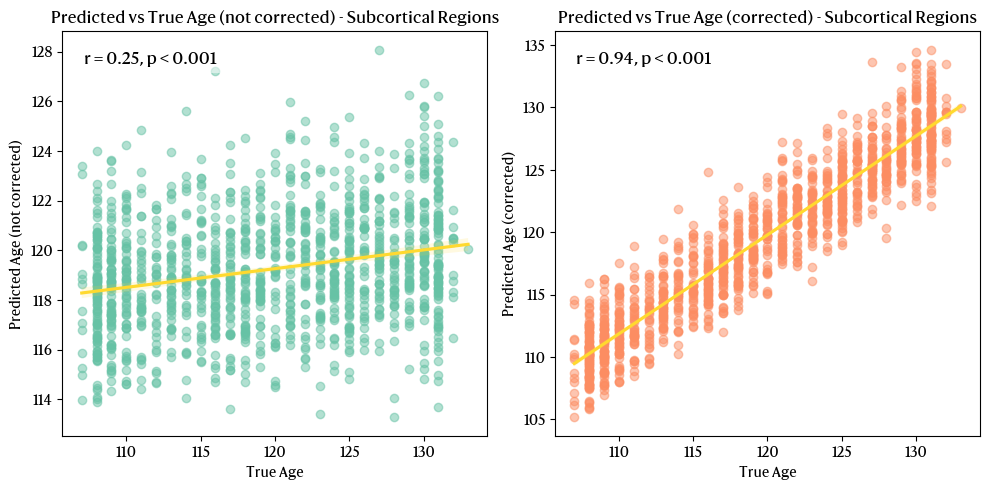

In [266]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_sub_female["age"], y=y_pred_sub_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Subcortical Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_sub_female["age"], y_pred_sub_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_sub_female["age"], y=y_pred_corrected_sub_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Subcortical Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_sub_female["age"], y_pred_corrected_sub_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Build the frontal structures model for male and female individually.**

Model for the frontal structures include the following regions (R and L denotes right/left):

* **SFG_L(R)_6_1**: A8m, medial area 8
* **SFG_L(R)_6_2**: A8dl, dorsolateral area 8
* **SFG_L(R)_6_3**: A9m/A9l, medial area 9/lateral area 9
* **SFG_L(R)_6_4**: A6dl, dorsolateral area 6
* **SFG_L(R)_6_5**: A6m, medial area 6
* **SFG_L(R)_6_6**: A10m, medial area 10
* **MFG_L(R)_7_1**: A9/46d, dorsal area 9/46
* **MFG_L(R)_7_2**: IFJ, inferior frontal junction
* **MFG_L(R)_7_3**: A46, area 46
* **MFG_L(R)_7_4**: A9/46v, ventral area 9/46
* **MFG_L(R)_7_5**: A8vl, ventrolateral area 8
* **MFG_L(R)_7_6**: A6vl, ventrolateral area 6
* **MFG_L(R)_7_7**: A10l, lateral area 10
* **IFG_L(R)_6_1**: A44d, dorsal area 44
* **IFG_L(R)_6_2**: IFS, inferior frontal sulcus
* **IFG_L(R)_6_3**: A45c, caudal area 45
* **IFG_L(R)_6_4**: A45r, rostral area 45
* **IFG_L(R)_6_5**: A44op, opercular area 44
* **IFG_L(R)_6_6**: A44v, ventral area 44
* **OrG_L(R)_6_1**: A14m, medial area 14
* **OrG_L(R)_6_2**: A12/47o, orbital area 12/47
* **OrG_L(R)_6_3**: A11l, lateral area 11
* **OrG_L(R)_6_4**: A11m, medial area 11
* **OrG_L(R)_6_5**: A13, area 13
* **OrG_L(R)_6_6**: A12/47l, lateral area 12/47
* **PrG_L(R)_6_1**: A4hf, area 4(head and face region)
* **PrG_L(R)_6_2**: A6cdl, caudal dorsolateral area 6
* **PrG_L(R)_6_3**: A4ul, area 4(upper limb region)
* **PrG_L(R)_6_4**: A4t, area 4(trunk region)
* **PrG_L(R)_6_5**: A4tl, area 4(tongue and larynx region)
* **PrG_L(R)_6_6**: A6cvl, caudal ventrolateral area 6
* **PCL_L(R)_2_1**: A1/2/3ll, area 1/2/3(lower limb region)
* **PCL_L(R)_2_2**: A4ll, area 4

In [267]:
# Append _vol, _thick, and _area to the regions in columns names.
frnt_thick = [f"{col}_thick" for col in frontal_col]
frnt_area = [f"{col}_area" for col in frontal_col]
frnt_vol = [f"{col}_vol" for col in frontal_col]

# Select only the frontal regions (and identifiers).
frontal_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + frnt_vol + frnt_thick + frnt_area]

# Split into male and female frontal dataframes.
frontal_male_df = frontal_df[frontal_df["sex"] == 2]
frontal_female_df = frontal_df[frontal_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_frt_male, test_idx_frt_male = next(gss.split(frontal_male_df, groups=frontal_male_df["family_id"]))
train_idx_frt_female, test_idx_frt_female = next(gss.split(frontal_female_df, groups=frontal_female_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_frt_male) + len(test_idx_frt_male) == len(frontal_male_df), "Train and test lengths do not match the original dataset length."
assert len(train_idx_frt_female) + len(test_idx_frt_female) == len(frontal_female_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(frontal_male_df["family_id"].iloc[train_idx_frt_male]).intersection(set(frontal_male_df["family_id"].iloc[test_idx_frt_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(frontal_female_df["family_id"].iloc[train_idx_frt_female]).intersection(set(frontal_female_df["family_id"].iloc[test_idx_frt_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_frt_male = frontal_male_df.iloc[train_idx_frt_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_frt_male = frontal_male_df.iloc[test_idx_frt_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_frt_male = pd.DataFrame(frontal_male_df.iloc[train_idx_frt_male]["age"], columns=["age"])
y_test_frt_male = pd.DataFrame(frontal_male_df.iloc[test_idx_frt_male]["age"], columns=["age"])

X_train_frt_female = frontal_female_df.iloc[train_idx_frt_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_frt_female = frontal_female_df.iloc[test_idx_frt_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_frt_female = pd.DataFrame(frontal_female_df.iloc[train_idx_frt_female]["age"], columns=["age"])
y_test_frt_female = pd.DataFrame(frontal_female_df.iloc[test_idx_frt_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_frt_male["age"], y_test_frt_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."
_, p_value = scipy.stats.ttest_ind(y_train_frt_female["age"], y_test_frt_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_frt_male = pd.DataFrame(scale(X_train_frt_male), columns=X_train_frt_male.columns)
X_test_frt_male = pd.DataFrame(scale(X_test_frt_male), columns=X_test_frt_male.columns)
X_train_frt_female = pd.DataFrame(scale(X_train_frt_female), columns=X_train_frt_female.columns)
X_test_frt_female = pd.DataFrame(scale(X_test_frt_female), columns=X_test_frt_female.columns)


In [268]:
xgb_model_frt_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_frt_male = BayesSearchCV(
    xgb_model_frt_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_frt_male.fit(X_train_frt_male, y_train_frt_male)

# Print the best parameters.
print("Best parameters found: ", clf_frt_male.best_params_)

# Print the best score.
print("Best score found: ", clf_frt_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.5298959337235138, gamma=7.1017263407075895, learning_rate=0.05402406696345838, max_depth=4, min_child_weight=2, n_estimators=1154, reg_alpha=0.18517119414481878, reg_lambda=0.0004885757700793827, subsample=0.9797988830388588; total time=   3.0s
[CV] END colsample_bytree=0.5298959337235138, gamma=7.1017263407075895, learning_rate=0.05402406696345838, max_depth=4, min_child_weight=2, n_estimators=1154, reg_alpha=0.18517119414481878, reg_lambda=0.0004885757700793827, subsample=0.9797988830388588; total time=   3.0s
[CV] END colsample_bytree=0.5298959337235138, gamma=7.1017263407075895, learning_rate=0.05402406696345838, max_depth=4, min_child_weight=2, n_estimators=1154, reg_alpha=0.18517119414481878, reg_lambda=0.0004885757700793827, subsample=0.9797988830388588; total time=   3.1s
[CV] END colsample_bytree=0.5298959337235138, gamma=7.1017263407075895, learning_rate=0.05402406696345838, max_depth=4, mi

In [269]:
xgb_model_frt_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_frt_male.best_params_["n_estimators"],
    max_depth=clf_frt_male.best_params_["max_depth"],
    gamma=clf_frt_male.best_params_["gamma"],
    reg_alpha=clf_frt_male.best_params_["reg_alpha"],
    reg_lambda=clf_frt_male.best_params_["reg_lambda"],
    learning_rate=clf_frt_male.best_params_["learning_rate"],
    subsample=clf_frt_male.best_params_["subsample"],
    colsample_bytree=clf_frt_male.best_params_["colsample_bytree"],
    min_child_weight=clf_frt_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_frt_male.fit(X_train_frt_male, y_train_frt_male)

# Predict on the training data.
y_train_pred_frt_male = xgb_model_frt_male.predict(X_train_frt_male)

# Calculate the mean absolute error on the training data.
mae_train_frt_male = mean_absolute_error(y_train_frt_male, y_train_pred_frt_male)
print(f"Mean absolute error on training data: {mae_train_frt_male}")
# Calculate the explained variance score on the training data.
evs_train_frt_male = explained_variance_score(y_train_frt_male, y_train_pred_frt_male)
print(f"Explained variance score on training data: {evs_train_frt_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_frt_male = scipy.stats.pearsonr(y_train_frt_male["age"], y_train_pred_frt_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_frt_male}")

# Make predictions on the test data.
y_pred_frt_male = xgb_model_frt_male.predict(X_test_frt_male)

# Calculate the mean absolute error on the test data.
mae_test_frt_male = mean_absolute_error(y_test_frt_male, y_pred_frt_male)
print(f"Mean absolute error on test data: {mae_test_frt_male}")
# Calculate the explained variance score on the test data.
evs_test_frt_male = explained_variance_score(y_test_frt_male, y_pred_frt_male)
print(f"Explained variance score on test data: {evs_test_frt_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_frt_male = scipy.stats.pearsonr(y_test_frt_male["age"], y_pred_frt_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_frt_male}")

# Save the model.
xgb_model_frt_male.save_model("brainAgeModelFrontalMale.json")


Mean absolute error on training data: 3.7013490200042725
Explained variance score on training data: 0.6641516667049746
Pearson correlation coefficient on training data: 0.923385724232057
Mean absolute error on test data: 6.258510589599609
Explained variance score on test data: 0.04412309043759921
Pearson correlation coefficient on test data: 0.21851723627692662


In [270]:
# Compute the bias using the training data.
mod_frt_male = compute_bias(y_train_frt_male, y_train_pred_frt_male)

# Apply the bias correction to the test data.
y_pred_corrected_frt_male = y_pred_frt_male - mod_frt_male.predict(y_test_frt_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("frontalBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_frt_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_frt_male = mean_absolute_error(y_test_frt_male["age"], y_pred_corrected_frt_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_frt_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_frt_male = scipy.stats.pearsonr(y_test_frt_male["age"], y_pred_corrected_frt_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_frt_male}")

Mean absolute error on test data after bias correction: 2.9621118188194138
Pearson correlation coefficient on test data after bias correction: 0.913106209954833


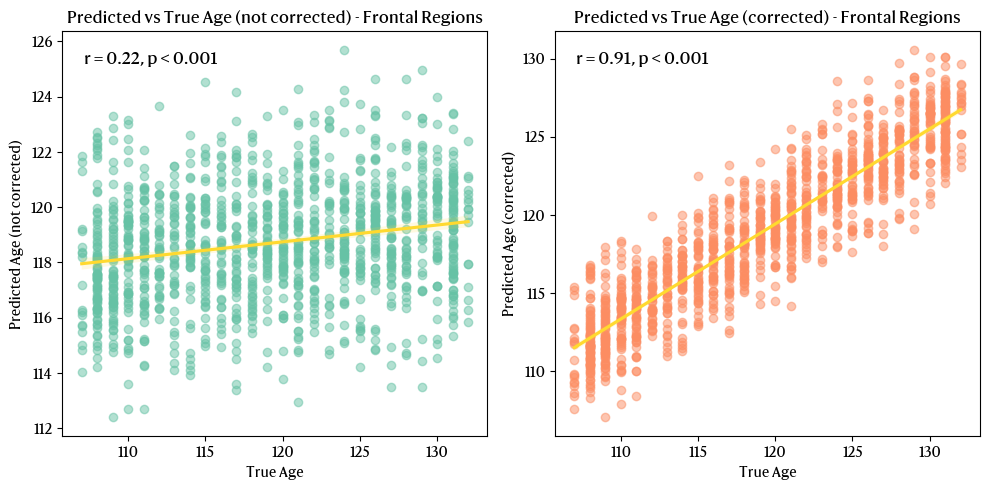

In [271]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_frt_male["age"], y=y_pred_frt_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Frontal Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_frt_male["age"], y_pred_frt_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_frt_male["age"], y=y_pred_corrected_frt_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Frontal Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_frt_male["age"], y_pred_corrected_frt_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [272]:
xgb_model_frt_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_frt_female = BayesSearchCV(
    xgb_model_frt_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_frt_female.fit(X_train_frt_female, y_train_frt_female)

# Print the best parameters.
print("Best parameters found: ", clf_frt_female.best_params_)

# Print the best score.
print("Best score found: ", clf_frt_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.6544864376211188, gamma=1.1186888252816602, learning_rate=0.09232025079954755, max_depth=3, min_child_weight=4, n_estimators=422, reg_alpha=0.2862350446371702, reg_lambda=7.886259069176819e-06, subsample=0.8081440997375606; total time=   1.6s
[CV] END colsample_bytree=0.6544864376211188, gamma=1.1186888252816602, learning_rate=0.09232025079954755, max_depth=3, min_child_weight=4, n_estimators=422, reg_alpha=0.2862350446371702, reg_lambda=7.886259069176819e-06, subsample=0.8081440997375606; total time=   1.6s
[CV] END colsample_bytree=0.6544864376211188, gamma=1.1186888252816602, learning_rate=0.09232025079954755, max_depth=3, min_child_weight=4, n_estimators=422, reg_alpha=0.2862350446371702, reg_lambda=7.886259069176819e-06, subsample=0.8081440997375606; total time=   1.6s
[CV] END colsample_bytree=0.6544864376211188, gamma=1.1186888252816602, learning_rate=0.09232025079954755, max_depth=3, min_chil

In [273]:
xgb_model_frt_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_frt_female.best_params_["n_estimators"],
    max_depth=clf_frt_female.best_params_["max_depth"],
    gamma=clf_frt_female.best_params_["gamma"],
    reg_alpha=clf_frt_female.best_params_["reg_alpha"],
    reg_lambda=clf_frt_female.best_params_["reg_lambda"],
    learning_rate=clf_frt_female.best_params_["learning_rate"],
    subsample=clf_frt_female.best_params_["subsample"],
    colsample_bytree=clf_frt_female.best_params_["colsample_bytree"],
    min_child_weight=clf_frt_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_frt_female.fit(X_train_frt_female, y_train_frt_female)

# Predict on the training data.
y_train_pred_frt_female = xgb_model_frt_female.predict(X_train_frt_female)

# Calculate the mean absolute error on the training data.
mae_train_frt_female = mean_absolute_error(y_train_frt_female, y_train_pred_frt_female)
print(f"Mean absolute error on training data: {mae_train_frt_female}")
# Calculate the explained variance score on the training data.
evs_train_frt_female = explained_variance_score(y_train_frt_female, y_train_pred_frt_female)
print(f"Explained variance score on training data: {evs_train_frt_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_frt_female = scipy.stats.pearsonr(y_train_frt_female["age"], y_train_pred_frt_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_frt_female}")

# Make predictions on the test data.
y_pred_frt_female = xgb_model_frt_female.predict(X_test_frt_female)

# Calculate the mean absolute error on the test data.
mae_test_frt_female = mean_absolute_error(y_test_frt_female, y_pred_frt_female)
print(f"Mean absolute error on test data: {mae_test_frt_female}")
# Calculate the explained variance score on the test data.
evs_test_frt_female = explained_variance_score(y_test_frt_female, y_pred_frt_female)
print(f"Explained variance score on test data: {evs_test_frt_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_frt_female = scipy.stats.pearsonr(y_test_frt_female["age"], y_pred_frt_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_frt_female}")

# Save the model.
xgb_model_frt_female.save_model("brainAgeModelFrontalFemale.json")


Mean absolute error on training data: 4.470452308654785
Explained variance score on training data: 0.5171651544225544
Pearson correlation coefficient on training data: 0.8396294171034245
Mean absolute error on test data: 6.465845108032227
Explained variance score on test data: 0.045621949810702334
Pearson correlation coefficient on test data: 0.22208894308272234


In [274]:
# Compute the bias using the training data.
mod_frt_female = compute_bias(y_train_frt_female, y_train_pred_frt_female)

# Apply the bias correction to the test data.
y_pred_corrected_frt_female = y_pred_frt_female - mod_frt_female.predict(y_test_frt_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("frontalBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_frt_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_frt_female = mean_absolute_error(y_test_frt_female["age"], y_pred_corrected_frt_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_frt_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_frt_female = scipy.stats.pearsonr(y_test_frt_female["age"], y_pred_corrected_frt_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_frt_female}")

Mean absolute error on test data after bias correction: 2.4554278373947422
Pearson correlation coefficient on test data after bias correction: 0.934091713990936


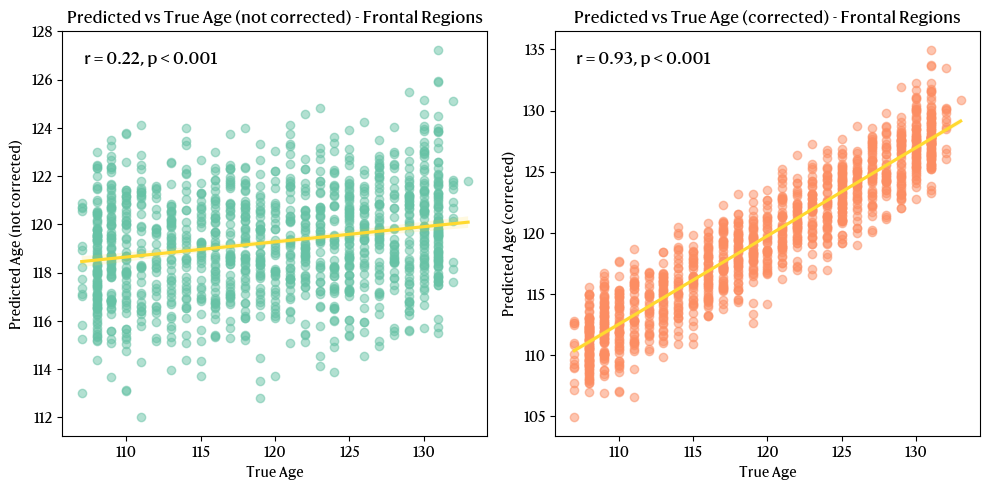

In [275]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_frt_female["age"], y=y_pred_frt_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Frontal Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_frt_female["age"], y_pred_frt_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_frt_female["age"], y=y_pred_corrected_frt_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Frontal Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_frt_female["age"], y_pred_corrected_frt_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Building the temporal regions model for male and female individually.**

Model for the temporal structures include the following regions (R and L denotes right/left):

* **STG_L(R)_6_1**: A38m, medial area 38
* **STG_L(R)_6_2**: A41/42, area 41/42
* **STG_L(R)_6_3**: TE1.0 and TE1.2
* **STG_L(R)_6_4**: A22c, caudal area 22
* **STG_L(R)_6_5**: A38l, lateral area 38
* **STG_L(R)_6_6**: A22r, rostral area 22
* **MTG_L(R)_4_1**: A21c, caudal area 21
* **MTG_L(R)_4_2**: A21r, rostral area 21
* **MTG_L(R)_4_3**: A37dl, dorsolateral area 37
* **MTG_L(R)_4_4**: aSTS, anterior superior temporal sulcus
* **ITG_L(R)_5_1**: A37elv, extreme lateroventral area 37
* **ITG_L(R)_5_2**: A20r, rostral area 20
* **ITG_L(R)_5_3**: A20il, intermediate lateral area 20
* **ITG_L(R)_5_4**: A20cl, caudolateral of area 20
* **ITG_L(R)_5_5**: A20cv, caudoventral of area 20
* **FuG_L(R)_3_1**: A20rv, rostroventral area 20
* **FuG_L(R)_3_2**: A37mv, medioventral area 37
* **FuG_L(R)_3_3**: A37lv, lateroventral area 37
* **PhG_L(R)_6_1**: A35/36r, rostral area 35/36
* **PhG_L(R)_6_2**: A35/36c, caudal area 35/36
* **PhG_L(R)_6_3**: TL, area TL
* **PhG_L(R)_6_4**: A28/34, area 28/34
* **PhG_L(R)_6_5**: TI, area TI
* **PhG_L(R)_6_6**: TH, area TH
* **pSTS_L(R)_2_1**: rpSTS, rostroposterior superior temporal sulcus
* **pSTS_L(R)_2_2**: cpSTS, caudoposterior superior temporal sulcus

In [276]:
# Append _vol, _thick, and _area to the regions in columns names.
temp_vol = [f"{col}_vol" for col in temporal_col]
temp_thick = [f"{col}_thick" for col in temporal_col]
temp_area = [f"{col}_area" for col in temporal_col]

# Select only the temporal regions (and identifiers).
temporal_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + temp_vol + temp_thick + temp_area]

# Split into male and female temporal dataframes.
temporal_male_df = temporal_df[temporal_df["sex"] == 2]
temporal_female_df = temporal_df[temporal_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_temp_male, test_idx_temp_male = next(gss.split(temporal_male_df, groups=temporal_male_df["family_id"]))
train_idx_temp_female, test_idx_temp_female = next(gss.split(temporal_female_df, groups=temporal_female_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_temp_male) + len(test_idx_temp_male) == len(temporal_male_df), "Train and test lengths do not match the original dataset length."
assert len(train_idx_temp_female) + len(test_idx_temp_female) == len(temporal_female_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(temporal_male_df["family_id"].iloc[train_idx_temp_male]).intersection(set(temporal_male_df["family_id"].iloc[test_idx_temp_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(temporal_female_df["family_id"].iloc[train_idx_temp_female]).intersection(set(temporal_female_df["family_id"].iloc[test_idx_temp_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_temp_male = temporal_male_df.iloc[train_idx_temp_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_temp_male = temporal_male_df.iloc[test_idx_temp_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_temp_male = pd.DataFrame(temporal_male_df.iloc[train_idx_temp_male]["age"], columns=["age"])
y_test_temp_male = pd.DataFrame(temporal_male_df.iloc[test_idx_temp_male]["age"], columns=["age"])

X_train_temp_female = temporal_female_df.iloc[train_idx_temp_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_temp_female = temporal_female_df.iloc[test_idx_temp_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_temp_female = pd.DataFrame(temporal_female_df.iloc[train_idx_temp_female]["age"], columns=["age"])
y_test_temp_female = pd.DataFrame(temporal_female_df.iloc[test_idx_temp_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_temp_male["age"], y_test_temp_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."
_, p_value = scipy.stats.ttest_ind(y_train_temp_female["age"], y_test_temp_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_temp_male = pd.DataFrame(scale(X_train_temp_male), columns=X_train_temp_male.columns)
X_test_temp_male = pd.DataFrame(scale(X_test_temp_male), columns=X_test_temp_male.columns)
X_train_temp_female = pd.DataFrame(scale(X_train_temp_female), columns=X_train_temp_female.columns)
X_test_temp_female = pd.DataFrame(scale(X_test_temp_female), columns=X_test_temp_female.columns)


In [277]:
xgb_model_temp_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_temp_male = BayesSearchCV(
    xgb_model_temp_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_temp_male.fit(X_train_temp_male, y_train_temp_male)

# Print the best parameters.
print("Best parameters found: ", clf_temp_male.best_params_)

# Print the best score.
print("Best score found: ", clf_temp_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.5841910105707069, gamma=0.0010205789671945001, learning_rate=0.0026301849896471835, max_depth=9, min_child_weight=3, n_estimators=432, reg_alpha=7.6401811601173195, reg_lambda=66.12914504696286, subsample=0.6329730583549928; total time=  13.5s
[CV] END colsample_bytree=0.5841910105707069, gamma=0.0010205789671945001, learning_rate=0.0026301849896471835, max_depth=9, min_child_weight=3, n_estimators=432, reg_alpha=7.6401811601173195, reg_lambda=66.12914504696286, subsample=0.6329730583549928; total time=  13.7s
[CV] END colsample_bytree=0.5841910105707069, gamma=0.0010205789671945001, learning_rate=0.0026301849896471835, max_depth=9, min_child_weight=3, n_estimators=432, reg_alpha=7.6401811601173195, reg_lambda=66.12914504696286, subsample=0.6329730583549928; total time=  13.7s
[CV] END colsample_bytree=0.5841910105707069, gamma=0.0010205789671945001, learning_rate=0.0026301849896471835, max_depth=9, 

In [278]:
xgb_model_temp_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_temp_male.best_params_["n_estimators"],
    max_depth=clf_temp_male.best_params_["max_depth"],
    gamma=clf_temp_male.best_params_["gamma"],
    reg_alpha=clf_temp_male.best_params_["reg_alpha"],
    reg_lambda=clf_temp_male.best_params_["reg_lambda"],
    learning_rate=clf_temp_male.best_params_["learning_rate"],
    subsample=clf_temp_male.best_params_["subsample"],
    colsample_bytree=clf_temp_male.best_params_["colsample_bytree"],
    min_child_weight=clf_temp_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_temp_male.fit(X_train_temp_male, y_train_temp_male)

# Predict on the training data.
y_train_pred_temp_male = xgb_model_temp_male.predict(X_train_temp_male)

# Calculate the mean absolute error on the training data.
mae_train_temp_male = mean_absolute_error(y_train_temp_male, y_train_pred_temp_male)
print(f"Mean absolute error on training data: {mae_train_temp_male}")
# Calculate the explained variance score on the training data.
evs_train_temp_male = explained_variance_score(y_train_temp_male, y_train_pred_temp_male)
print(f"Explained variance score on training data: {evs_train_temp_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_temp_male = scipy.stats.pearsonr(y_train_temp_male["age"], y_train_pred_temp_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_temp_male}")

# Make predictions on the test data.
y_pred_temp_male = xgb_model_temp_male.predict(X_test_temp_male)

# Calculate the mean absolute error on the test data.
mae_test_temp_male = mean_absolute_error(y_test_temp_male, y_pred_temp_male)
print(f"Mean absolute error on test data: {mae_test_temp_male}")
# Calculate the explained variance score on the test data.
evs_test_temp_male = explained_variance_score(y_test_temp_male, y_pred_temp_male)
print(f"Explained variance score on test data: {evs_test_temp_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_temp_male = scipy.stats.pearsonr(y_test_temp_male["age"], y_pred_temp_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_temp_male}")

# Save the model.
xgb_model_temp_male.save_model("brainAgeModelTemporalMale.json")


Mean absolute error on training data: 5.269110679626465
Explained variance score on training data: 0.3388347754128215
Pearson correlation coefficient on training data: 0.9537158644492228
Mean absolute error on test data: 6.475880146026611
Explained variance score on test data: 0.006414175332429939
Pearson correlation coefficient on test data: 0.08017200130186204


In [279]:
# Compute the bias using the training data.
mod_temp_male = compute_bias(y_train_temp_male, y_train_pred_temp_male)

# Apply the bias correction to the test data.
y_pred_corrected_temp_male = y_pred_temp_male - mod_temp_male.predict(y_test_temp_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("temporalBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_temp_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_temp_male = mean_absolute_error(y_test_temp_male["age"], y_pred_corrected_temp_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_temp_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_temp_male = scipy.stats.pearsonr(y_test_temp_male["age"], y_pred_corrected_temp_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_temp_male}")

Mean absolute error on test data after bias correction: 1.264413938367977
Pearson correlation coefficient on test data after bias correction: 0.9956716782650913


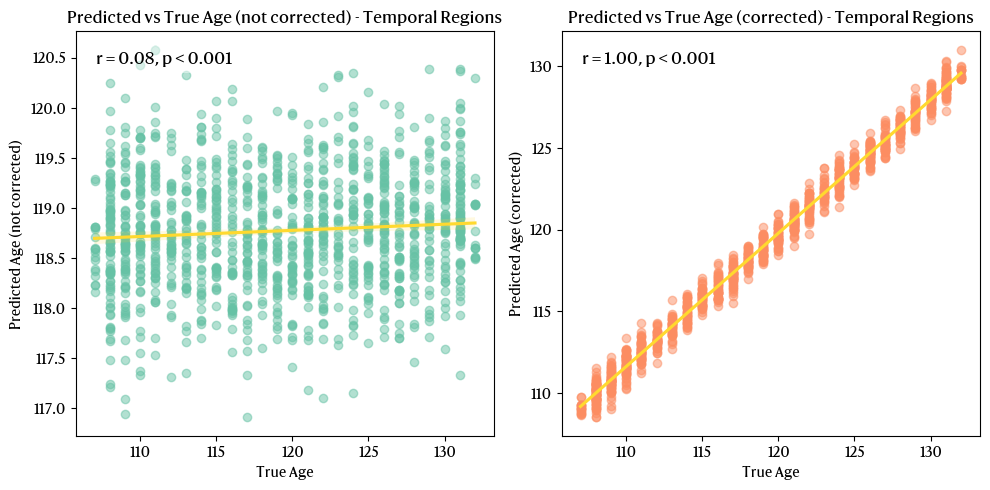

In [280]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_temp_male["age"], y=y_pred_temp_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Temporal Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_temp_male["age"], y_pred_temp_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_temp_male["age"], y=y_pred_corrected_temp_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Temporal Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_temp_male["age"], y_pred_corrected_temp_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [281]:
xgb_model_temp_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_temp_female = BayesSearchCV(
    xgb_model_temp_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_temp_female.fit(X_train_temp_female, y_train_temp_female)

# Print the best parameters.
print("Best parameters found: ", clf_temp_female.best_params_)

# Print the best score.
print("Best score found: ", clf_temp_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.574202624406216, gamma=0.0022758128908044227, learning_rate=0.04170791450649948, max_depth=10, min_child_weight=2, n_estimators=909, reg_alpha=2.2277064156991164e-06, reg_lambda=11.159407337485623, subsample=0.6842439005225158; total time=  37.5s
[CV] END colsample_bytree=0.574202624406216, gamma=0.0022758128908044227, learning_rate=0.04170791450649948, max_depth=10, min_child_weight=2, n_estimators=909, reg_alpha=2.2277064156991164e-06, reg_lambda=11.159407337485623, subsample=0.6842439005225158; total time=  37.8s
[CV] END colsample_bytree=0.574202624406216, gamma=0.0022758128908044227, learning_rate=0.04170791450649948, max_depth=10, min_child_weight=2, n_estimators=909, reg_alpha=2.2277064156991164e-06, reg_lambda=11.159407337485623, subsample=0.6842439005225158; total time=  37.8s
[CV] END colsample_bytree=0.574202624406216, gamma=0.0022758128908044227, learning_rate=0.04170791450649948, max_dep

In [282]:
xgb_model_temp_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_temp_female.best_params_["n_estimators"],
    max_depth=clf_temp_female.best_params_["max_depth"],
    gamma=clf_temp_female.best_params_["gamma"],
    reg_alpha=clf_temp_female.best_params_["reg_alpha"],
    reg_lambda=clf_temp_female.best_params_["reg_lambda"],
    learning_rate=clf_temp_female.best_params_["learning_rate"],
    subsample=clf_temp_female.best_params_["subsample"],
    colsample_bytree=clf_temp_female.best_params_["colsample_bytree"],
    min_child_weight=clf_temp_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_temp_female.fit(X_train_temp_female, y_train_temp_female)

# Predict on the training data.
y_train_pred_temp_female = xgb_model_temp_female.predict(X_train_temp_female)

# Calculate the mean absolute error on the training data.
mae_train_temp_female = mean_absolute_error(y_train_temp_female, y_train_pred_temp_female)
print(f"Mean absolute error on training data: {mae_train_temp_female}")
# Calculate the explained variance score on the training data.
evs_train_temp_female = explained_variance_score(y_train_temp_female, y_train_pred_temp_female)
print(f"Explained variance score on training data: {evs_train_temp_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_temp_female = scipy.stats.pearsonr(y_train_temp_female["age"], y_train_pred_temp_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_temp_female}")

# Make predictions on the test data.
y_pred_temp_female = xgb_model_temp_female.predict(X_test_temp_female)

# Calculate the mean absolute error on the test data.
mae_test_temp_female = mean_absolute_error(y_test_temp_female, y_pred_temp_female)
print(f"Mean absolute error on test data: {mae_test_temp_female}")
# Calculate the explained variance score on the test data.
evs_test_temp_female = explained_variance_score(y_test_temp_female, y_pred_temp_female)
print(f"Explained variance score on test data: {evs_test_temp_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_temp_female = scipy.stats.pearsonr(y_test_temp_female["age"], y_pred_temp_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_temp_female}")

# Save the model.
xgb_model_temp_female.save_model("brainAgeModelTemporalFemale.json")


Mean absolute error on training data: 1.4944164752960205
Explained variance score on training data: 0.944979658642005
Pearson correlation coefficient on training data: 0.9960712139013701
Mean absolute error on test data: 6.728191375732422
Explained variance score on test data: -0.027042058865168972
Pearson correlation coefficient on test data: 0.04764748450836508


In [283]:
# Compute the bias using the training data.
mod_temp_female = compute_bias(y_train_temp_female, y_train_pred_temp_female)

# Apply the bias correction to the test data.
y_pred_corrected_temp_female = y_pred_temp_female - mod_temp_female.predict(y_test_temp_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("temporalBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_temp_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_temp_female = mean_absolute_error(y_test_temp_female["age"], y_pred_corrected_temp_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_temp_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_temp_female = scipy.stats.pearsonr(y_test_temp_female["age"], y_pred_corrected_temp_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_temp_female}")

Mean absolute error on test data after bias correction: 5.254312714951212
Pearson correlation coefficient on test data after bias correction: 0.731635661635542


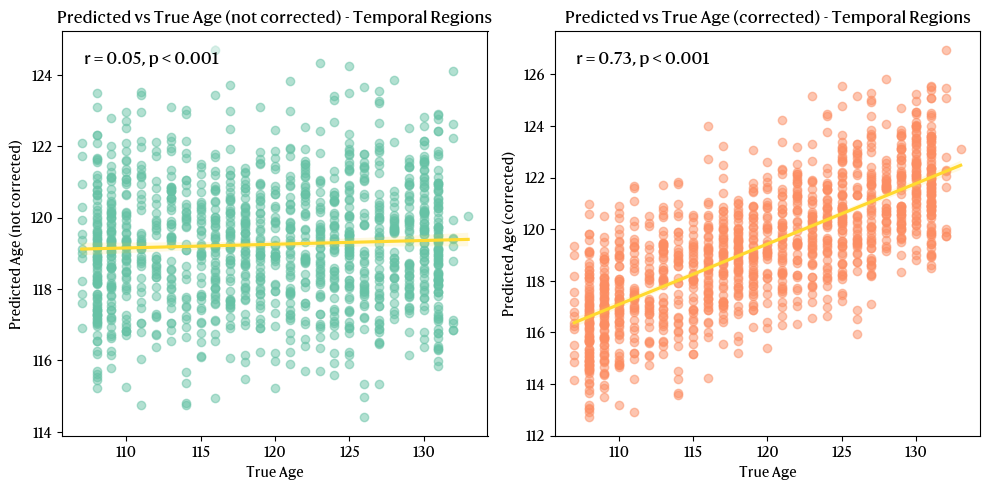

In [284]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_temp_female["age"], y=y_pred_temp_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Temporal Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_temp_female["age"], y_pred_temp_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_temp_female["age"], y=y_pred_corrected_temp_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Temporal Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_temp_female["age"], y_pred_corrected_temp_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Building the parietal regions model for male and female individually.**

Model for the parietal structures include the following regions (R and L denotes right/left):

* **SPL_L(R)_3_1**: A7c, caudal area 7
* **SPL_L(R)_3_2**: A5l, lateral area 5
* **SPL_L(R)_3_3**: A7pc, postcentral area 7
* **IPL_L(R)_6_1**: A39c, caudal area 39
* **IPL_L(R)_6_2**: A39rd, rostrodorsal area 39
* **IPL_L(R)_6_3**: A40rd, rostrodorsal area 40
* **IPL_L(R)_6_4**: A40c, caudal area 40
* **IPL_L(R)_6_5**: A39rv, rostroventral area 39
* **IPL_L(R)_6_6**: A40rv, rostroventral area 40
* **PCun_L(R)_4_1**: A7m, medial area 7
* **PCun_L(R)_4_2**: A5m, medial area 5
* **PCun_L(R)_4_3**: dmPOS, dorsomedial parietooccipital sulcus
* **PCun_L(R)_4_4**: A31, area 31
* **PoG_L(R)_4_1**: A1/2/3ulhf, area 1/2/3
* **PoG_L(R)_4_2**: A1/2/3tonIa, area 1/2/3
* **PoG_L(R)_4_3**: A2, area 2
* **PoG_L(R)_4_4**: A1/2/3tru, area 1/2/3

In [285]:
# Append _vol, _thick, and _area to the regions in columns names.
parietal_vol = [f"{col}_vol" for col in parietal_col]
parietal_thick = [f"{col}_thick" for col in parietal_col]
parietal_area = [f"{col}_area" for col in parietal_col]

# Select only the parietal regions (and identifiers).
parietal_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + parietal_vol + parietal_thick + parietal_area]

# Split into male and female parietal dataframes.
parietal_male_df = parietal_df[parietal_df["sex"] == 2]
parietal_female_df = parietal_df[parietal_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_par_male, test_idx_par_male = next(gss.split(parietal_male_df, groups=parietal_male_df["family_id"]))
train_idx_par_female, test_idx_par_female = next(gss.split(parietal_female_df, groups=parietal_female_df["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_par_male) + len(test_idx_par_male) == len(parietal_male_df), "Train and test lengths do not match the original dataset length."
assert len(train_idx_par_female) + len(test_idx_par_female) == len(parietal_female_df), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(parietal_male_df["family_id"].iloc[train_idx_par_male]).intersection(set(parietal_male_df["family_id"].iloc[test_idx_par_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(parietal_female_df["family_id"].iloc[train_idx_par_female]).intersection(set(parietal_female_df["family_id"].iloc[test_idx_par_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_par_male = parietal_male_df.iloc[train_idx_par_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_par_male = parietal_male_df.iloc[test_idx_par_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_par_male = pd.DataFrame(parietal_male_df.iloc[train_idx_par_male]["age"], columns=["age"])
y_test_par_male = pd.DataFrame(parietal_male_df.iloc[test_idx_par_male]["age"], columns=["age"])

X_train_par_female = parietal_female_df.iloc[train_idx_par_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_par_female = parietal_female_df.iloc[test_idx_par_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_par_female = pd.DataFrame(parietal_female_df.iloc[train_idx_par_female]["age"], columns=["age"])
y_test_par_female = pd.DataFrame(parietal_female_df.iloc[test_idx_par_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_par_male["age"], y_test_par_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."
_, p_value = scipy.stats.ttest_ind(y_train_par_female["age"], y_test_par_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_par_male = pd.DataFrame(scale(X_train_par_male), columns=X_train_par_male.columns)
X_test_par_male = pd.DataFrame(scale(X_test_par_male), columns=X_test_par_male.columns)
X_train_par_female = pd.DataFrame(scale(X_train_par_female), columns=X_train_par_female.columns)
X_test_par_female = pd.DataFrame(scale(X_test_par_female), columns=X_test_par_female.columns)

In [286]:
xgb_model_par_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_par_male = BayesSearchCV(
    xgb_model_par_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_par_male.fit(X_train_par_male, y_train_par_male)

# Print the best parameters.
print("Best parameters found: ", clf_par_male.best_params_)

# Print the best score.
print("Best score found: ", clf_par_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.8421640166036559, gamma=0.030879839414877455, learning_rate=0.02375925746265344, max_depth=5, min_child_weight=3, n_estimators=1961, reg_alpha=9.772129549585132e-06, reg_lambda=7.019499641357013e-05, subsample=0.8818454931187005; total time=  11.1s
[CV] END colsample_bytree=0.8421640166036559, gamma=0.030879839414877455, learning_rate=0.02375925746265344, max_depth=5, min_child_weight=3, n_estimators=1961, reg_alpha=9.772129549585132e-06, reg_lambda=7.019499641357013e-05, subsample=0.8818454931187005; total time=  11.3s
[CV] END colsample_bytree=0.8421640166036559, gamma=0.030879839414877455, learning_rate=0.02375925746265344, max_depth=5, min_child_weight=3, n_estimators=1961, reg_alpha=9.772129549585132e-06, reg_lambda=7.019499641357013e-05, subsample=0.8818454931187005; total time=  11.3s
[CV] END colsample_bytree=0.8421640166036559, gamma=0.030879839414877455, learning_rate=0.02375925746265344, m

In [287]:
xgb_model_par_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_par_male.best_params_["n_estimators"],
    max_depth=clf_par_male.best_params_["max_depth"],
    gamma=clf_par_male.best_params_["gamma"],
    reg_alpha=clf_par_male.best_params_["reg_alpha"],
    reg_lambda=clf_par_male.best_params_["reg_lambda"],
    learning_rate=clf_par_male.best_params_["learning_rate"],
    subsample=clf_par_male.best_params_["subsample"],
    colsample_bytree=clf_par_male.best_params_["colsample_bytree"],
    min_child_weight=clf_par_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_par_male.fit(X_train_par_male, y_train_par_male)

# Predict on the training data.
y_train_pred_par_male = xgb_model_par_male.predict(X_train_par_male)

# Calculate the mean absolute error on the training data.
mae_train_par_male = mean_absolute_error(y_train_par_male, y_train_pred_par_male)
print(f"Mean absolute error on training data: {mae_train_par_male}")
# Calculate the explained variance score on the training data.
evs_train_par_male = explained_variance_score(y_train_par_male, y_train_pred_par_male)
print(f"Explained variance score on training data: {evs_train_par_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_par_male = scipy.stats.pearsonr(y_train_par_male["age"], y_train_pred_par_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_par_male}")

# Make predictions on the test data.
y_pred_par_male = xgb_model_par_male.predict(X_test_par_male)

# Calculate the mean absolute error on the test data.
mae_test_par_male = mean_absolute_error(y_test_par_male, y_pred_par_male)
print(f"Mean absolute error on test data: {mae_test_par_male}")
# Calculate the explained variance score on the test data.
evs_test_par_male = explained_variance_score(y_test_par_male, y_pred_par_male)
print(f"Explained variance score on test data: {evs_test_par_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_par_male = scipy.stats.pearsonr(y_test_par_male["age"], y_pred_par_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_par_male}")

# Save the model.
xgb_model_par_male.save_model("brainAgeModelParietalMale.json")


Mean absolute error on training data: 6.124826908111572
Explained variance score on training data: 0.10418883022453684
Pearson correlation coefficient on training data: 0.4305682106300112
Mean absolute error on test data: 6.406858921051025
Explained variance score on test data: 0.022446121568083344
Pearson correlation coefficient on test data: 0.14990511481693783


In [288]:
# Compute the bias using the training data.
mod_par_male = compute_bias(y_train_par_male, y_train_pred_par_male)

# Apply the bias correction to the test data.
y_pred_corrected_par_male = y_pred_par_male - mod_par_male.predict(y_test_par_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("parietalBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_par_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_par_male = mean_absolute_error(y_test_par_male["age"], y_pred_corrected_par_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_par_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_par_male = scipy.stats.pearsonr(y_test_par_male["age"], y_pred_corrected_par_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_par_male}")

Mean absolute error on test data after bias correction: 0.9272295538598969
Pearson correlation coefficient on test data after bias correction: 0.9890309762916752


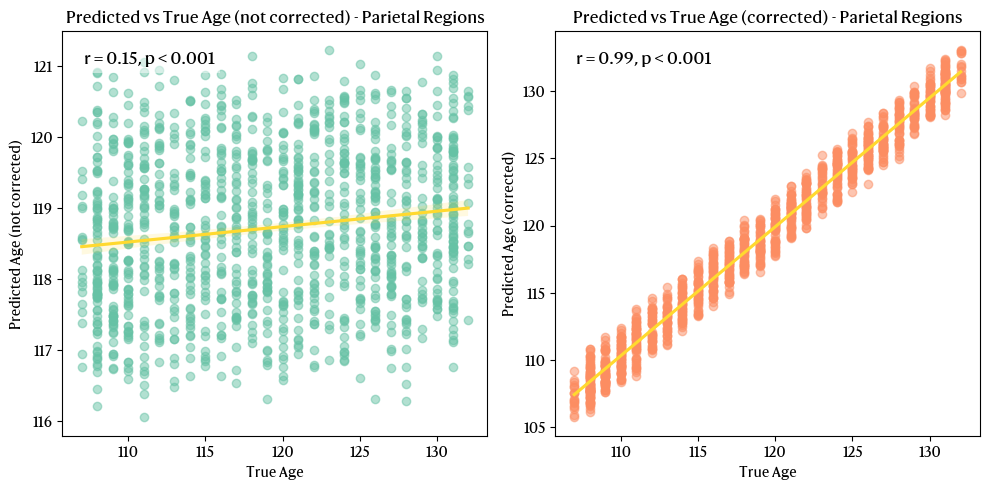

In [289]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_par_male["age"], y=y_pred_par_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Parietal Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_par_male["age"], y_pred_par_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_par_male["age"], y=y_pred_corrected_par_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Parietal Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_par_male["age"], y_pred_corrected_par_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [290]:
xgb_model_par_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_par_female = BayesSearchCV(
    xgb_model_par_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_par_female.fit(X_train_par_female, y_train_par_female)

# Print the best parameters.
print("Best parameters found: ", clf_par_female.best_params_)

# Print the best score.
print("Best score found: ", clf_par_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.5505313649099765, gamma=0.007948139222435213, learning_rate=0.023365389599591002, max_depth=9, min_child_weight=5, n_estimators=954, reg_alpha=3.4198852981936407, reg_lambda=2.1777793689853562e-06, subsample=0.9104977112357816; total time=  11.6s
[CV] END colsample_bytree=0.5505313649099765, gamma=0.007948139222435213, learning_rate=0.023365389599591002, max_depth=9, min_child_weight=5, n_estimators=954, reg_alpha=3.4198852981936407, reg_lambda=2.1777793689853562e-06, subsample=0.9104977112357816; total time=  11.7s
[CV] END colsample_bytree=0.5505313649099765, gamma=0.007948139222435213, learning_rate=0.023365389599591002, max_depth=9, min_child_weight=5, n_estimators=954, reg_alpha=3.4198852981936407, reg_lambda=2.1777793689853562e-06, subsample=0.9104977112357816; total time=  11.8s
[CV] END colsample_bytree=0.5505313649099765, gamma=0.007948139222435213, learning_rate=0.023365389599591002, max_de

In [291]:
xgb_model_par_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_par_female.best_params_["n_estimators"],
    max_depth=clf_par_female.best_params_["max_depth"],
    gamma=clf_par_female.best_params_["gamma"],
    reg_alpha=clf_par_female.best_params_["reg_alpha"],
    reg_lambda=clf_par_female.best_params_["reg_lambda"],
    learning_rate=clf_par_female.best_params_["learning_rate"],
    subsample=clf_par_female.best_params_["subsample"],
    colsample_bytree=clf_par_female.best_params_["colsample_bytree"],
    min_child_weight=clf_par_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_par_female.fit(X_train_par_female, y_train_par_female)

# Predict on the training data.
y_train_pred_par_female = xgb_model_par_female.predict(X_train_par_female)

# Calculate the mean absolute error on the training data.
mae_train_par_female = mean_absolute_error(y_train_par_female, y_train_pred_par_female)
print(f"Mean absolute error on training data: {mae_train_par_female}")
# Calculate the explained variance score on the training data.
evs_train_par_female = explained_variance_score(y_train_par_female, y_train_pred_par_female)
print(f"Explained variance score on training data: {evs_train_par_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_par_female = scipy.stats.pearsonr(y_train_par_female["age"], y_train_pred_par_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_par_female}")

# Make predictions on the test data.
y_pred_par_female = xgb_model_par_female.predict(X_test_par_female)

# Calculate the mean absolute error on the test data.
mae_test_par_female = mean_absolute_error(y_test_par_female, y_pred_par_female)
print(f"Mean absolute error on test data: {mae_test_par_female}")
# Calculate the explained variance score on the test data.
evs_test_par_female = explained_variance_score(y_test_par_female, y_pred_par_female)
print(f"Explained variance score on test data: {evs_test_par_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_par_female = scipy.stats.pearsonr(y_test_par_female["age"], y_pred_par_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_par_female}")

# Save the model.
xgb_model_par_female.save_model("brainAgeModelParietalFemale.json")


Mean absolute error on training data: 5.0594162940979
Explained variance score on training data: 0.3977315388448196
Pearson correlation coefficient on training data: 0.8517542730142906
Mean absolute error on test data: 6.627150535583496
Explained variance score on test data: 0.009379458384064732
Pearson correlation coefficient on test data: 0.11562077270701204


In [292]:
# Compute the bias using the training data.
mod_par_female = compute_bias(y_train_par_female, y_train_pred_par_female)

# Apply the bias correction to the test data.
y_pred_corrected_par_female = y_pred_par_female - mod_par_female.predict(y_test_par_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("parietalBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_par_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_par_female = mean_absolute_error(y_test_par_female["age"], y_pred_corrected_par_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_par_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_par_female = scipy.stats.pearsonr(y_test_par_female["age"], y_pred_corrected_par_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_par_female}")

Mean absolute error on test data after bias correction: 1.7482359769042317
Pearson correlation coefficient on test data after bias correction: 0.9752226828659247


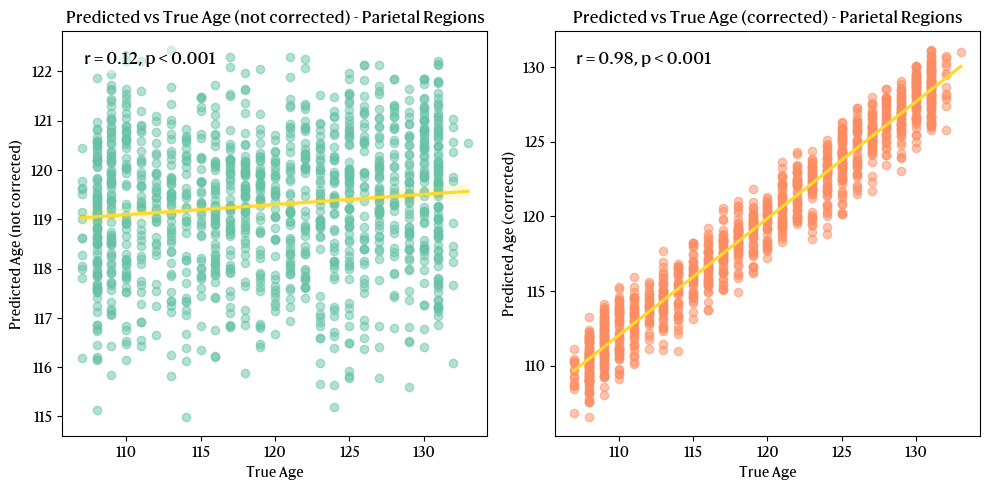

In [293]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_par_female["age"], y=y_pred_par_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Parietal Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_par_female["age"], y_pred_par_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_par_female["age"], y=y_pred_corrected_par_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Parietal Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_par_female["age"], y_pred_corrected_par_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Build the insular regions model for male and female individually.**

Model for the insular structures include the following regions (R and L denotes right/left):

* **Ins_L(R)_3_1**: vIa, ventral agranular insula
* **Ins_L(R)_3_2**: G/vId/vIg/dIg, hypergranular insula/ventral dysgranular and granular insula/dorsal granular insula
* **Ins_L(R)_3_3**: dIa/dId, dorsal agranular insula/dorsal dysgranular insula

In [294]:
# Append _vol, _thick, and _area to the regions in columns names.
insula_vol = [f"{col}_vol" for col in insular_col]
insula_thick = [f"{col}_thick" for col in insular_col]
insula_area = [f"{col}_area" for col in insular_col]

# Select only the insular regions (and identifiers).
insula_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + insula_vol + insula_thick + insula_area]

# Split into male and female insula dataframes.
insula_df_male = insula_df[insula_df["sex"] == 2]
insula_df_female = insula_df[insula_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_ins_male, test_idx_ins_male = next(gss.split(insula_df_male, groups=insula_df_male["family_id"]))
train_idx_ins_female, test_idx_ins_female = next(gss.split(insula_df_female, groups=insula_df_female["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_ins_male) + len(test_idx_ins_male) == len(insula_df_male), "Train and test lengths do not match the original dataset length."
assert len(train_idx_ins_female) + len(test_idx_ins_female) == len(insula_df_female), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(insula_df_male["family_id"].iloc[train_idx_ins_male]).intersection(set(insula_df_male["family_id"].iloc[test_idx_ins_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(insula_df_female["family_id"].iloc[train_idx_ins_female]).intersection(set(insula_df_female["family_id"].iloc[test_idx_ins_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_ins_male = insula_df_male.iloc[train_idx_ins_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_ins_male = insula_df_male.iloc[test_idx_ins_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_ins_male = pd.DataFrame(insula_df_male.iloc[train_idx_ins_male]["age"], columns=["age"])
y_test_ins_male = pd.DataFrame(insula_df_male.iloc[test_idx_ins_male]["age"], columns=["age"])
X_train_ins_female = insula_df_female.iloc[train_idx_ins_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_ins_female = insula_df_female.iloc[test_idx_ins_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_ins_female = pd.DataFrame(insula_df_female.iloc[train_idx_ins_female]["age"], columns=["age"])
y_test_ins_female = pd.DataFrame(insula_df_female.iloc[test_idx_ins_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_ins_male["age"], y_test_ins_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."
_, p_value = scipy.stats.ttest_ind(y_train_ins_female["age"], y_test_ins_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_ins_male = pd.DataFrame(scale(X_train_ins_male), columns=X_train_ins_male.columns)
X_test_ins_male = pd.DataFrame(scale(X_test_ins_male), columns=X_test_ins_male.columns)
X_train_ins_female = pd.DataFrame(scale(X_train_ins_female), columns=X_train_ins_female.columns)
X_test_ins_female = pd.DataFrame(scale(X_test_ins_female), columns=X_test_ins_female.columns)

In [295]:
xgb_model_ins_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_ins_male = BayesSearchCV(
    xgb_model_ins_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_ins_male.fit(X_train_ins_male, y_train_ins_male)

# Print the best parameters.
print("Best parameters found: ", clf_ins_male.best_params_)

# Print the best score.
print("Best score found: ", clf_ins_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.9494880721587305, gamma=5.5316952538274435, learning_rate=0.0045647015712700426, max_depth=4, min_child_weight=6, n_estimators=1994, reg_alpha=0.00016914925112697702, reg_lambda=78.56186264039496, subsample=0.8675318404011461; total time=   1.4s
[CV] END colsample_bytree=0.9494880721587305, gamma=5.5316952538274435, learning_rate=0.0045647015712700426, max_depth=4, min_child_weight=6, n_estimators=1994, reg_alpha=0.00016914925112697702, reg_lambda=78.56186264039496, subsample=0.8675318404011461; total time=   1.5s
[CV] END colsample_bytree=0.9494880721587305, gamma=5.5316952538274435, learning_rate=0.0045647015712700426, max_depth=4, min_child_weight=6, n_estimators=1994, reg_alpha=0.00016914925112697702, reg_lambda=78.56186264039496, subsample=0.8675318404011461; total time=   1.5s
[CV] END colsample_bytree=0.9494880721587305, gamma=5.5316952538274435, learning_rate=0.0045647015712700426, max_depth=

In [296]:
xgb_model_ins_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_ins_male.best_params_["n_estimators"],
    max_depth=clf_ins_male.best_params_["max_depth"],
    gamma=clf_ins_male.best_params_["gamma"],
    reg_alpha=clf_ins_male.best_params_["reg_alpha"],
    reg_lambda=clf_ins_male.best_params_["reg_lambda"],
    learning_rate=clf_ins_male.best_params_["learning_rate"],
    subsample=clf_ins_male.best_params_["subsample"],
    colsample_bytree=clf_ins_male.best_params_["colsample_bytree"],
    min_child_weight=clf_ins_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_ins_male.fit(X_train_ins_male, y_train_ins_male)

# Predict on the training data.
y_train_pred_ins_male = xgb_model_ins_male.predict(X_train_ins_male)

# Calculate the mean absolute error on the training data.
mae_train_ins_male = mean_absolute_error(y_train_ins_male, y_train_pred_ins_male)
print(f"Mean absolute error on training data: {mae_train_ins_male}")
# Calculate the explained variance score on the training data.
evs_train_ins_male = explained_variance_score(y_train_ins_male, y_train_pred_ins_male)
print(f"Explained variance score on training data: {evs_train_ins_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_ins_male = scipy.stats.pearsonr(y_train_ins_male["age"], y_train_pred_ins_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_ins_male}")

# Make predictions on the test data.
y_pred_ins_male = xgb_model_ins_male.predict(X_test_ins_male)

# Calculate the mean absolute error on the test data.
mae_test_ins_male = mean_absolute_error(y_test_ins_male, y_pred_ins_male)
print(f"Mean absolute error on test data: {mae_test_ins_male}")
# Calculate the explained variance score on the test data.
evs_test_ins_male = explained_variance_score(y_test_ins_male, y_pred_ins_male)
print(f"Explained variance score on test data: {evs_test_ins_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_ins_male = scipy.stats.pearsonr(y_test_ins_male["age"], y_pred_ins_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_ins_male}")

# Save the model.
xgb_model_ins_male.save_model("brainAgeModelInsularMale.json")


Mean absolute error on training data: 6.146238327026367
Explained variance score on training data: 0.09878524829616586
Pearson correlation coefficient on training data: 0.4586333832579991
Mean absolute error on test data: 6.4127373695373535
Explained variance score on test data: 0.02099725038303224
Pearson correlation coefficient on test data: 0.14826111296473096


In [297]:
# Compute the bias using the training data.
mod_ins_male = compute_bias(y_train_ins_male, y_train_pred_ins_male)

# Apply the bias correction to the test data.
y_pred_corrected_ins_male = y_pred_ins_male - mod_ins_male.predict(y_test_ins_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("insularBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_ins_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_ins_male = mean_absolute_error(y_test_ins_male["age"], y_pred_corrected_ins_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_ins_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_ins_male = scipy.stats.pearsonr(y_test_ins_male["age"], y_pred_corrected_ins_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_ins_male}")

Mean absolute error on test data after bias correction: 0.7246377259621433
Pearson correlation coefficient on test data after bias correction: 0.9928305030601359


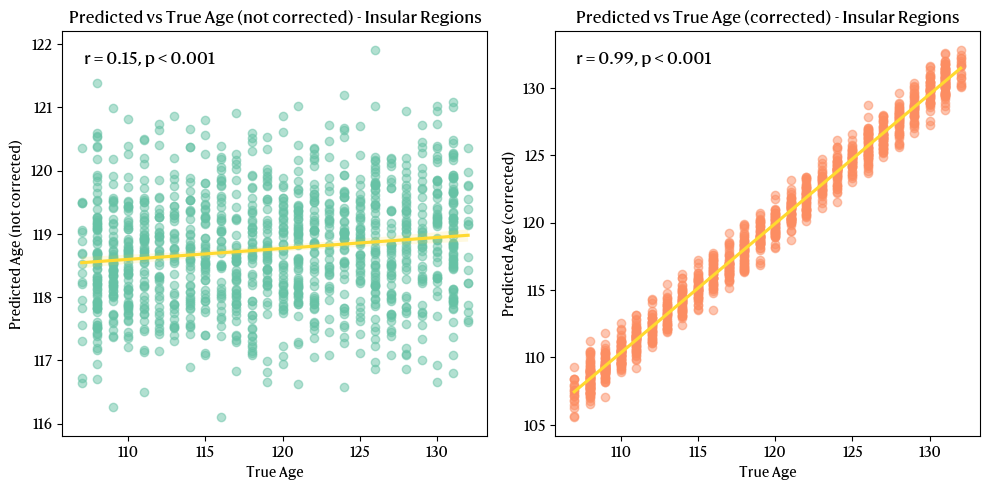

In [298]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_ins_male["age"], y=y_pred_ins_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Insular Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_ins_male["age"], y_pred_ins_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_ins_male["age"], y=y_pred_corrected_ins_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Insular Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_ins_male["age"], y_pred_corrected_ins_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [299]:
xgb_model_ins_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_ins_female = BayesSearchCV(
    xgb_model_ins_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_ins_female.fit(X_train_ins_female, y_train_ins_female)

# Print the best parameters.
print("Best parameters found: ", clf_ins_female.best_params_)

# Print the best score.
print("Best score found: ", clf_ins_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.7183253044687625, gamma=0.08241045753081071, learning_rate=0.01797448038817254, max_depth=3, min_child_weight=6, n_estimators=367, reg_alpha=0.08169326664698574, reg_lambda=25.055835065408267, subsample=0.908836511813615; total time=   0.1s
[CV] END colsample_bytree=0.7183253044687625, gamma=0.08241045753081071, learning_rate=0.01797448038817254, max_depth=3, min_child_weight=6, n_estimators=367, reg_alpha=0.08169326664698574, reg_lambda=25.055835065408267, subsample=0.908836511813615; total time=   0.1s
[CV] END colsample_bytree=0.7183253044687625, gamma=0.08241045753081071, learning_rate=0.01797448038817254, max_depth=3, min_child_weight=6, n_estimators=367, reg_alpha=0.08169326664698574, reg_lambda=25.055835065408267, subsample=0.908836511813615; total time=   0.1s
[CV] END colsample_bytree=0.7183253044687625, gamma=0.08241045753081071, learning_rate=0.01797448038817254, max_depth=3, min_child_wei

In [300]:
xgb_model_ins_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_ins_female.best_params_["n_estimators"],
    max_depth=clf_ins_female.best_params_["max_depth"],
    gamma=clf_ins_female.best_params_["gamma"],
    reg_alpha=clf_ins_female.best_params_["reg_alpha"],
    reg_lambda=clf_ins_female.best_params_["reg_lambda"],
    learning_rate=clf_ins_female.best_params_["learning_rate"],
    subsample=clf_ins_female.best_params_["subsample"],
    colsample_bytree=clf_ins_female.best_params_["colsample_bytree"],
    min_child_weight=clf_ins_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_ins_female.fit(X_train_ins_female, y_train_ins_female)

# Predict on the training data.
y_train_pred_ins_female = xgb_model_ins_female.predict(X_train_ins_female)

# Calculate the mean absolute error on the training data.
mae_train_ins_female = mean_absolute_error(y_train_ins_female, y_train_pred_ins_female)
print(f"Mean absolute error on training data: {mae_train_ins_female}")
# Calculate the explained variance score on the training data.
evs_train_ins_female = explained_variance_score(y_train_ins_female, y_train_pred_ins_female)
print(f"Explained variance score on training data: {evs_train_ins_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_ins_female = scipy.stats.pearsonr(y_train_ins_female["age"], y_train_pred_ins_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_ins_female}")

# Make predictions on the test data.
y_pred_ins_female = xgb_model_ins_female.predict(X_test_ins_female)

# Calculate the mean absolute error on the test data.
mae_test_ins_female = mean_absolute_error(y_test_ins_female, y_pred_ins_female)
print(f"Mean absolute error on test data: {mae_test_ins_female}")
# Calculate the explained variance score on the test data.
evs_test_ins_female = explained_variance_score(y_test_ins_female, y_pred_ins_female)
print(f"Explained variance score on test data: {evs_test_ins_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_ins_female = scipy.stats.pearsonr(y_test_ins_female["age"], y_pred_ins_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_ins_female}")

# Save the model.
xgb_model_ins_female.save_model("brainAgeModelInsularFemale.json")


Mean absolute error on training data: 3.9611494541168213
Explained variance score on training data: 0.6245382987922372
Pearson correlation coefficient on training data: 0.9515434755462109
Mean absolute error on test data: 6.737351417541504
Explained variance score on test data: -0.0302363645952195
Pearson correlation coefficient on test data: 0.02203285420839981


In [301]:
# Compute the bias using the training data.
mod_ins_female = compute_bias(y_train_ins_female, y_train_pred_ins_female)

# Apply the bias correction to the test data.
y_pred_corrected_ins_female = y_pred_ins_female - mod_ins_female.predict(y_test_ins_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("insularBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_ins_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_ins_female = mean_absolute_error(y_test_ins_female["age"], y_pred_corrected_ins_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_ins_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_ins_female = scipy.stats.pearsonr(y_test_ins_female["age"], y_pred_corrected_ins_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_ins_female}")

Mean absolute error on test data after bias correction: 2.8714408661579265
Pearson correlation coefficient on test data after bias correction: 0.9504709389184904


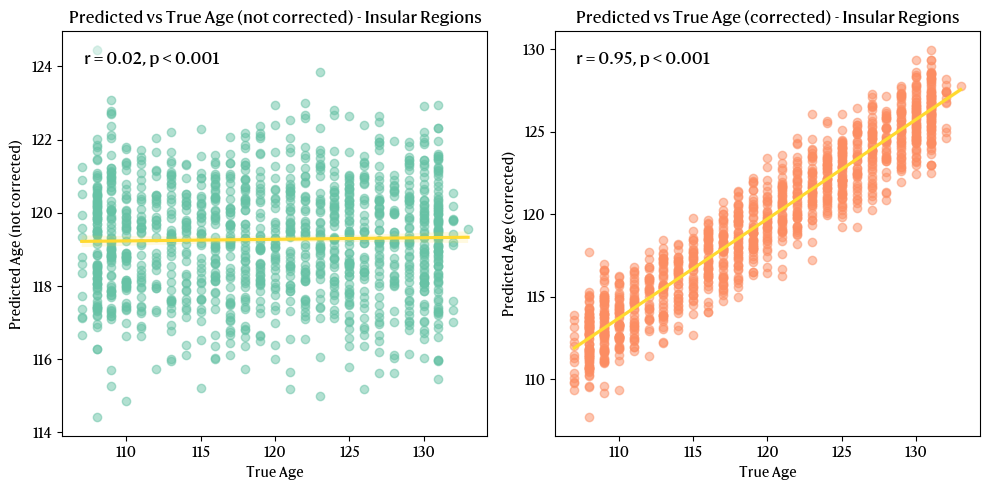

In [302]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_ins_female["age"], y=y_pred_ins_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Insular Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_ins_female["age"], y_pred_ins_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_ins_female["age"], y=y_pred_corrected_ins_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Insular Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_ins_female["age"], y_pred_corrected_ins_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Building the limbic regions model for male and female individually.**

Model for the limbic structures include the following regions (R and L denotes right/left):

* **CG_L(R)_5_1**: A23d, dorsal area 23
* **CG_L(R)_5_2**: A32p, pregenual area 32
* **CG_L(R)_5_3**: A23v, ventral area 23
* **CG_L(R)_5_4**: A23c, caudal area 23
* **CG_L(R)_5_5**: A32sg, subgenual area 32


In [303]:
# Append _vol, _thick, and _area to the regions in columns names.
limbic_vol = [f"{col}_vol" for col in limbic_col]
limbic_thick = [f"{col}_thick" for col in limbic_col]
limbic_area = [f"{col}_area" for col in limbic_col]

# Select only the limbic regions (and identifiers).
limbic_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + limbic_vol + limbic_thick + limbic_area]

# Split into male and female limbic dataframes.
limbic_df_male = limbic_df[limbic_df["sex"] == 2]
limbic_df_female = limbic_df[limbic_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_limb_male, test_idx_limb_male = next(gss.split(limbic_df_male, groups=limbic_df_male["family_id"]))
train_idx_limb_female, test_idx_limb_female = next(gss.split(limbic_df_female, groups=limbic_df_female["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_limb_male) + len(test_idx_limb_male) == len(limbic_df_male), "Train and test lengths do not match the original dataset length."
assert len(train_idx_limb_female) + len(test_idx_limb_female) == len(limbic_df_female), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(limbic_df_male["family_id"].iloc[train_idx_limb_male]).intersection(set(limbic_df_male["family_id"].iloc[test_idx_limb_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(limbic_df_female["family_id"].iloc[train_idx_limb_female]).intersection(set(limbic_df_female["family_id"].iloc[test_idx_limb_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_limb_male = limbic_df_male.iloc[train_idx_limb_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_limb_male = limbic_df_male.iloc[test_idx_limb_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_limb_male = pd.DataFrame(limbic_df_male.iloc[train_idx_limb_male]["age"], columns=["age"])
y_test_limb_male = pd.DataFrame(limbic_df_male.iloc[test_idx_limb_male]["age"], columns=["age"])

X_train_limb_female = limbic_df_female.iloc[train_idx_limb_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_limb_female = limbic_df_female.iloc[test_idx_limb_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_limb_female = pd.DataFrame(limbic_df_female.iloc[train_idx_limb_female]["age"], columns=["age"])
y_test_limb_female = pd.DataFrame(limbic_df_female.iloc[test_idx_limb_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_limb_male["age"], y_test_limb_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."

_, p_value = scipy.stats.ttest_ind(y_train_limb_female["age"], y_test_limb_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_limb_male = pd.DataFrame(scale(X_train_limb_male), columns=X_train_limb_male.columns)
X_test_limb_male = pd.DataFrame(scale(X_test_limb_male), columns=X_test_limb_male.columns)
X_train_limb_female = pd.DataFrame(scale(X_train_limb_female), columns=X_train_limb_female.columns)
X_test_limb_female = pd.DataFrame(scale(X_test_limb_female), columns=X_test_limb_female.columns)

In [304]:
xgb_model_limb_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_limb_male = BayesSearchCV(
    xgb_model_limb_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_limb_male.fit(X_train_limb_male, y_train_limb_male)

# Print the best parameters.
print("Best parameters found: ", clf_limb_male.best_params_)

# Print the best score.
print("Best score found: ", clf_limb_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.5886106223795852, gamma=0.019668956800583788, learning_rate=0.04486437089379314, max_depth=7, min_child_weight=1, n_estimators=567, reg_alpha=1.904989679412657, reg_lambda=0.23421651820494593, subsample=0.6428458583672431; total time=   2.6s
[CV] END colsample_bytree=0.5886106223795852, gamma=0.019668956800583788, learning_rate=0.04486437089379314, max_depth=7, min_child_weight=1, n_estimators=567, reg_alpha=1.904989679412657, reg_lambda=0.23421651820494593, subsample=0.6428458583672431; total time=   2.6s
[CV] END colsample_bytree=0.5886106223795852, gamma=0.019668956800583788, learning_rate=0.04486437089379314, max_depth=7, min_child_weight=1, n_estimators=567, reg_alpha=1.904989679412657, reg_lambda=0.23421651820494593, subsample=0.6428458583672431; total time=   2.6s
[CV] END colsample_bytree=0.5886106223795852, gamma=0.019668956800583788, learning_rate=0.04486437089379314, max_depth=7, min_child

In [305]:
xgb_model_limb_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_limb_male.best_params_["n_estimators"],
    max_depth=clf_limb_male.best_params_["max_depth"],
    gamma=clf_limb_male.best_params_["gamma"],
    reg_alpha=clf_limb_male.best_params_["reg_alpha"],
    reg_lambda=clf_limb_male.best_params_["reg_lambda"],
    learning_rate=clf_limb_male.best_params_["learning_rate"],
    subsample=clf_limb_male.best_params_["subsample"],
    colsample_bytree=clf_limb_male.best_params_["colsample_bytree"],
    min_child_weight=clf_limb_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_limb_male.fit(X_train_limb_male, y_train_limb_male)

# Predict on the training data.
y_train_pred_limb_male = xgb_model_limb_male.predict(X_train_limb_male)

# Calculate the mean absolute error on the training data.
mae_train_limb_male = mean_absolute_error(y_train_limb_male, y_train_pred_limb_male)
print(f"Mean absolute error on training data: {mae_train_limb_male}")
# Calculate the explained variance score on the training data.
evs_train_limb_male = explained_variance_score(y_train_limb_male, y_train_pred_limb_male)
print(f"Explained variance score on training data: {evs_train_limb_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_limb_male = scipy.stats.pearsonr(y_train_limb_male["age"], y_train_pred_limb_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_limb_male}")

# Make predictions on the test data.
y_pred_limb_male = xgb_model_limb_male.predict(X_test_limb_male)

# Calculate the mean absolute error on the test data.
mae_test_limb_male = mean_absolute_error(y_test_limb_male, y_pred_limb_male)
print(f"Mean absolute error on test data: {mae_test_limb_male}")
# Calculate the explained variance score on the test data.
evs_test_limb_male = explained_variance_score(y_test_limb_male, y_pred_limb_male)
print(f"Explained variance score on test data: {evs_test_limb_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_limb_male = scipy.stats.pearsonr(y_test_limb_male["age"], y_pred_limb_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_limb_male}")

# Save the model.
xgb_model_limb_male.save_model("brainAgeModelLimbicMale.json")


Mean absolute error on training data: 5.677966594696045
Explained variance score on training data: 0.21929234526339425
Pearson correlation coefficient on training data: 0.5998146972371227
Mean absolute error on test data: 6.412953853607178
Explained variance score on test data: 0.01850948256249585
Pearson correlation coefficient on test data: 0.14730763241625186


In [306]:
# Compute the bias using the training data.
mod_limb_male = compute_bias(y_train_limb_male, y_train_pred_limb_male)

# Apply the bias correction to the test data.
y_pred_corrected_limb_male = y_pred_limb_male - mod_limb_male.predict(y_test_limb_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("limbicBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_limb_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_limb_male = mean_absolute_error(y_test_limb_male["age"], y_pred_corrected_limb_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_limb_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_limb_male = scipy.stats.pearsonr(y_test_limb_male["age"], y_pred_corrected_limb_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_limb_male}")

Mean absolute error on test data after bias correction: 1.3622419691292034
Pearson correlation coefficient on test data after bias correction: 0.9755685678027479


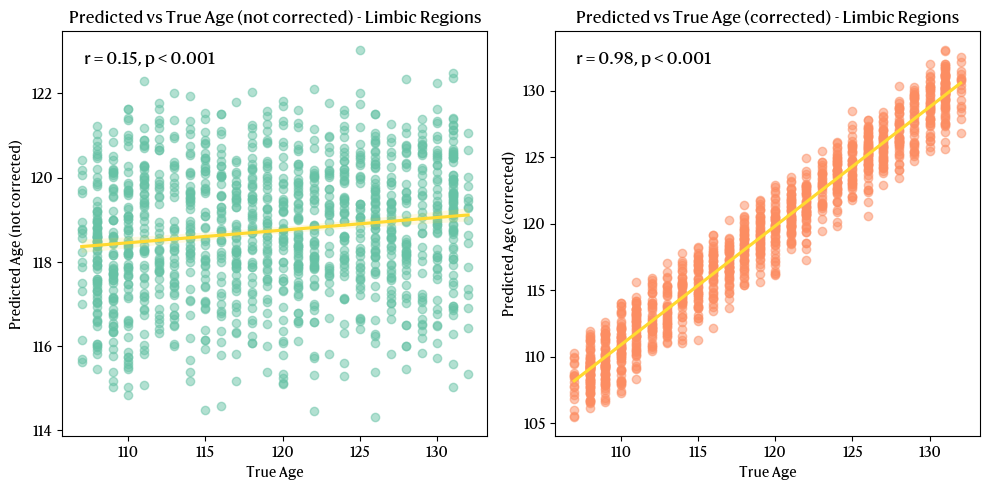

In [307]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_limb_male["age"], y=y_pred_limb_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Limbic Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_limb_male["age"], y_pred_limb_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_limb_male["age"], y=y_pred_corrected_limb_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Limbic Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_limb_male["age"], y_pred_corrected_limb_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [308]:
xgb_model_limb_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_limb_female = BayesSearchCV(
    xgb_model_limb_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_limb_female.fit(X_train_limb_female, y_train_limb_female)

# Print the best parameters.
print("Best parameters found: ", clf_limb_female.best_params_)

# Print the best score.
print("Best score found: ", clf_limb_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.836206314276471, gamma=0.001832320354810355, learning_rate=0.0278825961825752, max_depth=7, min_child_weight=3, n_estimators=204, reg_alpha=0.11911402190765875, reg_lambda=64.79275481666542, subsample=0.8904416795383354; total time=   1.0s
[CV] END colsample_bytree=0.836206314276471, gamma=0.001832320354810355, learning_rate=0.0278825961825752, max_depth=7, min_child_weight=3, n_estimators=204, reg_alpha=0.11911402190765875, reg_lambda=64.79275481666542, subsample=0.8904416795383354; total time=   1.0s
[CV] END colsample_bytree=0.836206314276471, gamma=0.001832320354810355, learning_rate=0.0278825961825752, max_depth=7, min_child_weight=3, n_estimators=204, reg_alpha=0.11911402190765875, reg_lambda=64.79275481666542, subsample=0.8904416795383354; total time=   1.1s
[CV] END colsample_bytree=0.836206314276471, gamma=0.001832320354810355, learning_rate=0.0278825961825752, max_depth=7, min_child_weight=

In [309]:
xgb_model_limb_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_limb_female.best_params_["n_estimators"],
    max_depth=clf_limb_female.best_params_["max_depth"],
    gamma=clf_limb_female.best_params_["gamma"],
    reg_alpha=clf_limb_female.best_params_["reg_alpha"],
    reg_lambda=clf_limb_female.best_params_["reg_lambda"],
    learning_rate=clf_limb_female.best_params_["learning_rate"],
    subsample=clf_limb_female.best_params_["subsample"],
    colsample_bytree=clf_limb_female.best_params_["colsample_bytree"],
    min_child_weight=clf_limb_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_limb_female.fit(X_train_limb_female, y_train_limb_female)

# Predict on the training data.
y_train_pred_limb_female = xgb_model_limb_female.predict(X_train_limb_female)

# Calculate the mean absolute error on the training data.
mae_train_limb_female = mean_absolute_error(y_train_limb_female, y_train_pred_limb_female)
print(f"Mean absolute error on training data: {mae_train_limb_female}")
# Calculate the explained variance score on the training data.
evs_train_limb_female = explained_variance_score(y_train_limb_female, y_train_pred_limb_female)
print(f"Explained variance score on training data: {evs_train_limb_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_limb_female = scipy.stats.pearsonr(y_train_limb_female["age"], y_train_pred_limb_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_limb_female}")

# Make predictions on the test data.
y_pred_limb_female = xgb_model_limb_female.predict(X_test_limb_female)

# Calculate the mean absolute error on the test data.
mae_test_limb_female = mean_absolute_error(y_test_limb_female, y_pred_limb_female)
print(f"Mean absolute error on test data: {mae_test_limb_female}")
# Calculate the explained variance score on the test data.
evs_test_limb_female = explained_variance_score(y_test_limb_female, y_pred_limb_female)
print(f"Explained variance score on test data: {evs_test_limb_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_limb_female = scipy.stats.pearsonr(y_test_limb_female["age"], y_pred_limb_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_limb_female}")

# Save the model.
xgb_model_limb_female.save_model("brainAgeModelLimbicFemale.json")


Mean absolute error on training data: 5.870513916015625
Explained variance score on training data: 0.1868619881291117
Pearson correlation coefficient on training data: 0.558151937449908
Mean absolute error on test data: 6.650680065155029
Explained variance score on test data: -0.0006222703125084994
Pearson correlation coefficient on test data: 0.09095777834472481


In [310]:
# Compute the bias using the training data.
mod_limb_female = compute_bias(y_train_limb_female, y_train_pred_limb_female)

# Apply the bias correction to the test data.
y_pred_corrected_limb_female = y_pred_limb_female - mod_limb_female.predict(y_test_limb_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("limbicBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_limb_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_limb_female = mean_absolute_error(y_test_limb_female["age"], y_pred_corrected_limb_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_limb_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_limb_female = scipy.stats.pearsonr(y_test_limb_female["age"], y_pred_corrected_limb_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_limb_female}")

Mean absolute error on test data after bias correction: 1.280185540429167
Pearson correlation coefficient on test data after bias correction: 0.9797308597932723


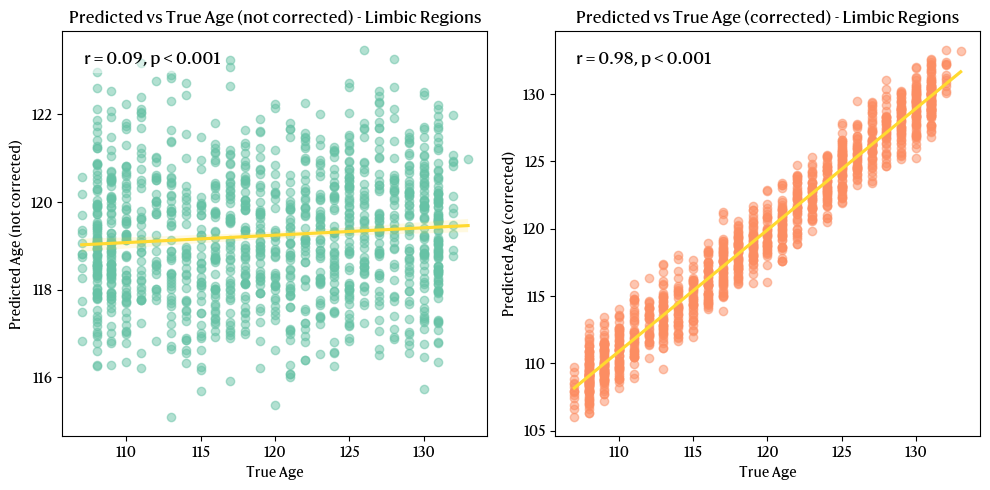

In [311]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_limb_female["age"], y=y_pred_limb_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Limbic Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_limb_female["age"], y_pred_limb_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_limb_female["age"], y=y_pred_corrected_limb_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Limbic Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_limb_female["age"], y_pred_corrected_limb_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Building the occipital regions model for male and female individually.**

Model for the occipital structures include the following regions (R and L denotes right/left):

* **MVOcC_L(R)_5_1**: cLinG, caudal lingual gyrus
* **MVOcC_L(R)_5_2**: rCunG, rostral cuneus gyrus
* **MVOcC_L(R)_5_3**: cCunG, caudal cuneus gyrus
* **MVOcC_L(R)_5_4**: rLinG, rostral lingual gyrus
* **MVOcC_L(R)_5_5**: vmPOS, ventromedial parietooccipital sulcus
* **LOcC_L(R)_4_1**: mOccG, middle occipital gyrus
* **LOcC_L(R)_4_2**: V5/MT+, area V5/MT+
* **LOcC_L(R)_4_3**: OPC, occipital polar cortex
* **LOcC_L(R)_4_4**: iOccG, inferior occipital gyrus
* **LOcC_L(R)_1_1**: msOccG/lsOccG, medial superior occipital gyrus/lateral superior occipital gyrus

In [312]:
# Append _vol, _thick, and _area to the regions in columns names.
occipital_vol = [f"{col}_vol" for col in occipital_col]
occipital_thick = [f"{col}_thick" for col in occipital_col]
occipital_area = [f"{col}_area" for col in occipital_col]

# Select only the occipital regions (and identifiers).
occipital_df = df[["sid", "family_id", "site", "age", "sex", "handedness"] + occipital_vol + occipital_thick + occipital_area]

# Split into male and female occipital dataframes.
occipital_df_male = occipital_df[occipital_df["sex"] == 2]
occipital_df_female = occipital_df[occipital_df["sex"] == 1]

# Split the dataset into training and testing sets.
gss = GroupShuffleSplit(n_splits=1, train_size=0.6, random_state=1234)
train_idx_occ_male, test_idx_occ_male = next(gss.split(occipital_df_male, groups=occipital_df_male["family_id"]))
train_idx_occ_female, test_idx_occ_female = next(gss.split(occipital_df_female, groups=occipital_df_female["family_id"]))

# Small assertions to check that the split is correct.
# Assert that the length of train/test is equal to the length of df.
assert len(train_idx_occ_male) + len(test_idx_occ_male) == len(occipital_df_male), "Train and test lengths do not match the original dataset length."
assert len(train_idx_occ_female) + len(test_idx_occ_female) == len(occipital_df_female), "Train and test lengths do not match the original dataset length."
# Assert that the family_id in train and test are different.
assert len(set(occipital_df_male["family_id"].iloc[train_idx_occ_male]).intersection(set(occipital_df_male["family_id"].iloc[test_idx_occ_male]))) == 0, "Family IDs in train and test sets are not different."
assert len(set(occipital_df_female["family_id"].iloc[train_idx_occ_female]).intersection(set(occipital_df_female["family_id"].iloc[test_idx_occ_female]))) == 0, "Family IDs in train and test sets are not different."

# Create the train and test sets.
X_train_occ_male = occipital_df_male.iloc[train_idx_occ_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_occ_male = occipital_df_male.iloc[test_idx_occ_male].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_occ_male = pd.DataFrame(occipital_df_male.iloc[train_idx_occ_male]["age"], columns=["age"])
y_test_occ_male = pd.DataFrame(occipital_df_male.iloc[test_idx_occ_male]["age"], columns=["age"])
X_train_occ_female = occipital_df_female.iloc[train_idx_occ_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
X_test_occ_female = occipital_df_female.iloc[test_idx_occ_female].drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_train_occ_female = pd.DataFrame(occipital_df_female.iloc[train_idx_occ_female]["age"], columns=["age"])
y_test_occ_female = pd.DataFrame(occipital_df_female.iloc[test_idx_occ_female]["age"], columns=["age"])

# Ensure age are not significantly different between train and test sets.
_, p_value = scipy.stats.ttest_ind(y_train_occ_male["age"], y_test_occ_male["age"])
assert p_value > 0.05, "Age distribution is significantly different between male train and test sets."
_, p_value = scipy.stats.ttest_ind(y_train_occ_female["age"], y_test_occ_female["age"])
assert p_value > 0.05, "Age distribution is significantly different between female train and test sets."

# Scale the data.
X_train_occ_male = pd.DataFrame(scale(X_train_occ_male), columns=X_train_occ_male.columns)
X_test_occ_male = pd.DataFrame(scale(X_test_occ_male), columns=X_test_occ_male.columns)
X_train_occ_female = pd.DataFrame(scale(X_train_occ_female), columns=X_train_occ_female.columns)
X_test_occ_female = pd.DataFrame(scale(X_test_occ_female), columns=X_test_occ_female.columns)

In [313]:
xgb_model_occ_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_occ_male = BayesSearchCV(
    xgb_model_occ_male,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_occ_male.fit(X_train_occ_male, y_train_occ_male)

# Print the best parameters.
print("Best parameters found: ", clf_occ_male.best_params_)

# Print the best score.
print("Best score found: ", clf_occ_male.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.5282681076956208, gamma=0.2835527272098966, learning_rate=0.0025262264430898186, max_depth=4, min_child_weight=3, n_estimators=268, reg_alpha=2.087066968029338e-06, reg_lambda=0.11979963392053351, subsample=0.5518298564796731; total time=   0.4s
[CV] END colsample_bytree=0.5282681076956208, gamma=0.2835527272098966, learning_rate=0.0025262264430898186, max_depth=4, min_child_weight=3, n_estimators=268, reg_alpha=2.087066968029338e-06, reg_lambda=0.11979963392053351, subsample=0.5518298564796731; total time=   0.4s[CV] END colsample_bytree=0.5282681076956208, gamma=0.2835527272098966, learning_rate=0.0025262264430898186, max_depth=4, min_child_weight=3, n_estimators=268, reg_alpha=2.087066968029338e-06, reg_lambda=0.11979963392053351, subsample=0.5518298564796731; total time=   0.4s

[CV] END colsample_bytree=0.5282681076956208, gamma=0.2835527272098966, learning_rate=0.0025262264430898186, max_depth=

In [314]:
xgb_model_occ_male = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_occ_male.best_params_["n_estimators"],
    max_depth=clf_occ_male.best_params_["max_depth"],
    gamma=clf_occ_male.best_params_["gamma"],
    reg_alpha=clf_occ_male.best_params_["reg_alpha"],
    reg_lambda=clf_occ_male.best_params_["reg_lambda"],
    learning_rate=clf_occ_male.best_params_["learning_rate"],
    subsample=clf_occ_male.best_params_["subsample"],
    colsample_bytree=clf_occ_male.best_params_["colsample_bytree"],
    min_child_weight=clf_occ_male.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_occ_male.fit(X_train_occ_male, y_train_occ_male)

# Predict on the training data.
y_train_pred_occ_male = xgb_model_occ_male.predict(X_train_occ_male)

# Calculate the mean absolute error on the training data.
mae_train_occ_male = mean_absolute_error(y_train_occ_male, y_train_pred_occ_male)
print(f"Mean absolute error on training data: {mae_train_occ_male}")
# Calculate the explained variance score on the training data.
evs_train_occ_male = explained_variance_score(y_train_occ_male, y_train_pred_occ_male)
print(f"Explained variance score on training data: {evs_train_occ_male}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_occ_male = scipy.stats.pearsonr(y_train_occ_male["age"], y_train_pred_occ_male)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_occ_male}")

# Make predictions on the test data.
y_pred_occ_male = xgb_model_occ_male.predict(X_test_occ_male)

# Calculate the mean absolute error on the test data.
mae_test_occ_male = mean_absolute_error(y_test_occ_male, y_pred_occ_male)
print(f"Mean absolute error on test data: {mae_test_occ_male}")
# Calculate the explained variance score on the test data.
evs_test_occ_male = explained_variance_score(y_test_occ_male, y_pred_occ_male)
print(f"Explained variance score on test data: {evs_test_occ_male}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_occ_male = scipy.stats.pearsonr(y_test_occ_male["age"], y_pred_occ_male)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_occ_male}")

# Save the model.
xgb_model_occ_male.save_model("brainAgeModelOccipitalMale.json")


Mean absolute error on training data: 6.0279622077941895
Explained variance score on training data: 0.13011194756665367
Pearson correlation coefficient on training data: 0.4545441387406194
Mean absolute error on test data: 6.366408824920654
Explained variance score on test data: 0.024384113704288723
Pearson correlation coefficient on test data: 0.15757110449812636


In [315]:
# Compute the bias using the training data.
mod_occ_male = compute_bias(y_train_occ_male, y_train_pred_occ_male)

# Apply the bias correction to the test data.
y_pred_corrected_occ_male = y_pred_occ_male - mod_occ_male.predict(y_test_occ_male["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("occipitalBiasCorrectionModelMale.pkl", "wb") as f:
    pickle.dump(mod_occ_male, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_occ_male = mean_absolute_error(y_test_occ_male["age"], y_pred_corrected_occ_male)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_occ_male}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_occ_male = scipy.stats.pearsonr(y_test_occ_male["age"], y_pred_corrected_occ_male)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_occ_male}")

Mean absolute error on test data after bias correction: 1.1309336662106184
Pearson correlation coefficient on test data after bias correction: 0.9830947637908344


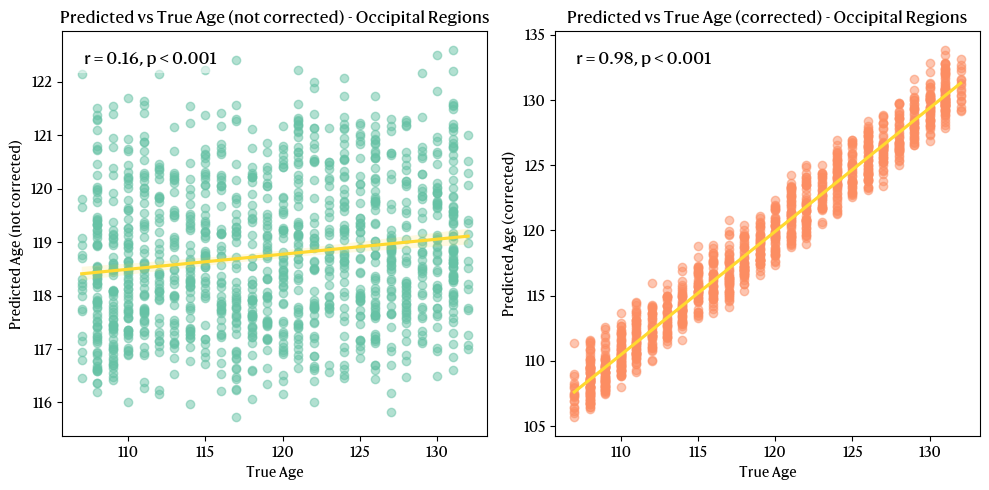

In [316]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_occ_male["age"], y=y_pred_occ_male, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Occipital Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_occ_male["age"], y_pred_occ_male)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_occ_male["age"], y=y_pred_corrected_occ_male, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Occipital Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_occ_male["age"], y_pred_corrected_occ_male)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

In [317]:
xgb_model_occ_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error
)

# Perform bayesian search for hyperparameter tuning.
clf_occ_female = BayesSearchCV(
    xgb_model_occ_female,
    search_spaces={
        "n_estimators": Integer(100, 2000),
        "learning_rate": Real(1e-3, 0.1, prior="log-uniform"),
        "max_depth": Integer(3, 10),
        "gamma": Real(1e-3, 10, prior="log-uniform"),
        "subsample": Real(0.5, 1.0, prior="uniform"),
        "colsample_bytree": Real(0.5, 1.0, prior="uniform"),
        "min_child_weight": Integer(1, 6),
        "reg_alpha": Real(1e-6, 100, prior="log-uniform"),
        "reg_lambda": Real(1e-6, 100, prior="log-uniform")
    },
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=6,
    verbose=2
)

# Fit the model to the training data
clf_occ_female.fit(X_train_occ_female, y_train_occ_female)

# Print the best parameters.
print("Best parameters found: ", clf_occ_female.best_params_)

# Print the best score.
print("Best score found: ", clf_occ_female.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END colsample_bytree=0.6079451865461414, gamma=0.0420639164277416, learning_rate=0.003926180964802812, max_depth=4, min_child_weight=2, n_estimators=849, reg_alpha=0.00035557616345965567, reg_lambda=0.006442648822308549, subsample=0.5168032682702387; total time=   1.4s
[CV] END colsample_bytree=0.6079451865461414, gamma=0.0420639164277416, learning_rate=0.003926180964802812, max_depth=4, min_child_weight=2, n_estimators=849, reg_alpha=0.00035557616345965567, reg_lambda=0.006442648822308549, subsample=0.5168032682702387; total time=   1.4s
[CV] END colsample_bytree=0.6079451865461414, gamma=0.0420639164277416, learning_rate=0.003926180964802812, max_depth=4, min_child_weight=2, n_estimators=849, reg_alpha=0.00035557616345965567, reg_lambda=0.006442648822308549, subsample=0.5168032682702387; total time=   1.3s
[CV] END colsample_bytree=0.6079451865461414, gamma=0.0420639164277416, learning_rate=0.003926180964802812, max_dept

In [318]:
xgb_model_occ_female = xgb.XGBRegressor(
    n_jobs=4,
    tree_method="hist",
    eval_metric=mean_absolute_error,
    n_estimators=clf_occ_female.best_params_["n_estimators"],
    max_depth=clf_occ_female.best_params_["max_depth"],
    gamma=clf_occ_female.best_params_["gamma"],
    reg_alpha=clf_occ_female.best_params_["reg_alpha"],
    reg_lambda=clf_occ_female.best_params_["reg_lambda"],
    learning_rate=clf_occ_female.best_params_["learning_rate"],
    subsample=clf_occ_female.best_params_["subsample"],
    colsample_bytree=clf_occ_female.best_params_["colsample_bytree"],
    min_child_weight=clf_occ_female.best_params_["min_child_weight"],
)

# Fit the model to the training data
xgb_model_occ_female.fit(X_train_occ_female, y_train_occ_female)

# Predict on the training data.
y_train_pred_occ_female = xgb_model_occ_female.predict(X_train_occ_female)

# Calculate the mean absolute error on the training data.
mae_train_occ_female = mean_absolute_error(y_train_occ_female, y_train_pred_occ_female)
print(f"Mean absolute error on training data: {mae_train_occ_female}")
# Calculate the explained variance score on the training data.
evs_train_occ_female = explained_variance_score(y_train_occ_female, y_train_pred_occ_female)
print(f"Explained variance score on training data: {evs_train_occ_female}")
# Compute the pearson correlation coefficient on the training data.
pearson_corr_train_occ_female = scipy.stats.pearsonr(y_train_occ_female["age"], y_train_pred_occ_female)[0]
print(f"Pearson correlation coefficient on training data: {pearson_corr_train_occ_female}")

# Make predictions on the test data.
y_pred_occ_female = xgb_model_occ_female.predict(X_test_occ_female)

# Calculate the mean absolute error on the test data.
mae_test_occ_female = mean_absolute_error(y_test_occ_female, y_pred_occ_female)
print(f"Mean absolute error on test data: {mae_test_occ_female}")
# Calculate the explained variance score on the test data.
evs_test_occ_female = explained_variance_score(y_test_occ_female, y_pred_occ_female)
print(f"Explained variance score on test data: {evs_test_occ_female}")
# Compute the pearson correlation coefficient on the test data.
pearson_corr_test_occ_female = scipy.stats.pearsonr(y_test_occ_female["age"], y_pred_occ_female)[0]
print(f"Pearson correlation coefficient on test data: {pearson_corr_test_occ_female}")

# Save the model.
xgb_model_occ_female.save_model("brainAgeModelOccipitalFemale.json")


Mean absolute error on training data: 5.81964111328125
Explained variance score on training data: 0.18980272053497738
Pearson correlation coefficient on training data: 0.5144174773880994
Mean absolute error on test data: 6.563580513000488
Explained variance score on test data: 0.015321495882974157
Pearson correlation coefficient on test data: 0.14784960440211145


In [319]:
# Compute the bias using the training data.
mod_occ_female = compute_bias(y_train_occ_female, y_train_pred_occ_female)

# Apply the bias correction to the test data.
y_pred_corrected_occ_female = y_pred_occ_female - mod_occ_female.predict(y_test_occ_female["age"].values.reshape(-1, 1))

# Save the bias correction model.
with open("occipitalBiasCorrectionModelFemale.pkl", "wb") as f:
    pickle.dump(mod_occ_female, f)

# Compute the mean absolute error on the test data after bias correction.
mae_test_corrected_occ_female = mean_absolute_error(y_test_occ_female["age"], y_pred_corrected_occ_female)
print(f"Mean absolute error on test data after bias correction: {mae_test_corrected_occ_female}")
# Compute the pearson correlation coefficient on the test data after bias correction.
pearson_corr_corrected_occ_female = scipy.stats.pearsonr(y_test_occ_female["age"], y_pred_corrected_occ_female)[0]
print(f"Pearson correlation coefficient on test data after bias correction: {pearson_corr_corrected_occ_female}")

Mean absolute error on test data after bias correction: 1.524473689686099
Pearson correlation coefficient on test data after bias correction: 0.9704631948099978


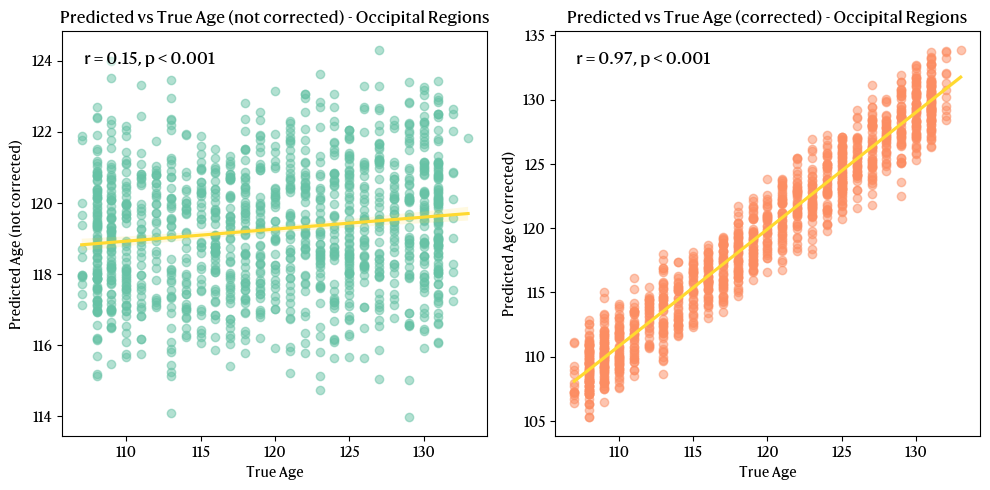

In [320]:
# Plot 2 subplots: predicted vs true values before and after bias correction.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values before bias correction.
sns.regplot(x=y_test_occ_female["age"], y=y_pred_occ_female, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_title("Predicted vs True Age (not corrected) - Occipital Regions")
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")

r, pval = scipy.stats.pearsonr(y_test_occ_female["age"], y_pred_occ_female)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[0].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Plot the predicted vs true values after bias correction.
sns.regplot(x=y_test_occ_female["age"], y=y_pred_corrected_occ_female, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_title("Predicted vs True Age (corrected) - Occipital Regions")
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")

r, pval = scipy.stats.pearsonr(y_test_occ_female["age"], y_pred_corrected_occ_female)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
           transform=ax[1].transAxes, fontsize=12,
           verticalalignment='top', horizontalalignment='left',
           bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.tight_layout()
plt.show()

#### **Applying the models on the data to derive the BrainAgeGap (BAG) estimate using male and female models**

The following cells will load/apply the previously trained model and their accompanying bias correction (located in `{output_folder}/BrainAge/`). Furthermore, for all subjects, the BrainAgeGap estimate will be calculated for all models. This will result in multiple BAG estimate for each of the available model:

1. Whole-brain
2. Subcortical/cerebellar
3. Frontal
4. Temporal
5. Parietal
6. Insular
7. Limbic
8. Occipital

In [337]:
# Loading the male/female whole-brain models.
whole_brain_model_male = xgb.XGBRegressor()
whole_brain_model_female = xgb.XGBRegressor()
whole_brain_model_male.load_model(f"{output_dir}/brainAgeModelWholeBrainMale.json")
whole_brain_model_female.load_model(f"{output_dir}/brainAgeModelWholeBrainFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/wholeBrainBiasCorrectionModelMale.pkl", "rb") as f:
    whole_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/wholeBrainBiasCorrectionModelFemale.pkl", "rb") as f:
    whole_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
whole_brain_df = pd.read_csv(f"{output_dir}/ABCDWholeBrain.csv")

# Split into male/female dataframes.
whole_brain_df_male = whole_brain_df[whole_brain_df["sex"] == 1]
whole_brain_df_female = whole_brain_df[whole_brain_df["sex"] == 2]

In [338]:
# Applying the models to the whole-brain data.
X_whole_brain_male = whole_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_whole_brain_male = pd.DataFrame(whole_brain_df_male["age"], columns=["age"])

# Scale the data.
X_whole_brain_male = pd.DataFrame(scale(X_whole_brain_male), columns=X_whole_brain_male.columns)

# Predict the age using the whole-brain male model.
y_whole_brain_male_pred = whole_brain_model_male.predict(X_whole_brain_male)
y_whole_brain_male_pred_corrected = y_whole_brain_male_pred - whole_brain_bias_model_male.predict(y_whole_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_whole_brain_male = mean_absolute_error(y_whole_brain_male, y_whole_brain_male_pred)
print(f"Mean absolute error on whole-brain male data: {mae_whole_brain_male}")
# Calculate the explained variance score
evs_whole_brain_male = explained_variance_score(y_whole_brain_male, y_whole_brain_male_pred)
print(f"Explained variance score on whole-brain male data: {evs_whole_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_whole_brain_male = scipy.stats.pearsonr(y_whole_brain_male["age"], y_whole_brain_male_pred)[0]
print(f"Pearson correlation coefficient on whole-brain male data: {pearson_corr_whole_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_whole_brain_male_corrected = scipy.stats.pearsonr(y_whole_brain_male["age"], y_whole_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on whole-brain male data: {pearson_corr_whole_brain_male_corrected}")

Mean absolute error on whole-brain male data: 6.163609981536865
Explained variance score on whole-brain male data: 0.09201302921573962
Pearson correlation coefficient on whole-brain male data: 0.30732466720398616
Pearson correlation coefficient after bias correction on whole-brain male data: 0.8560638081119435


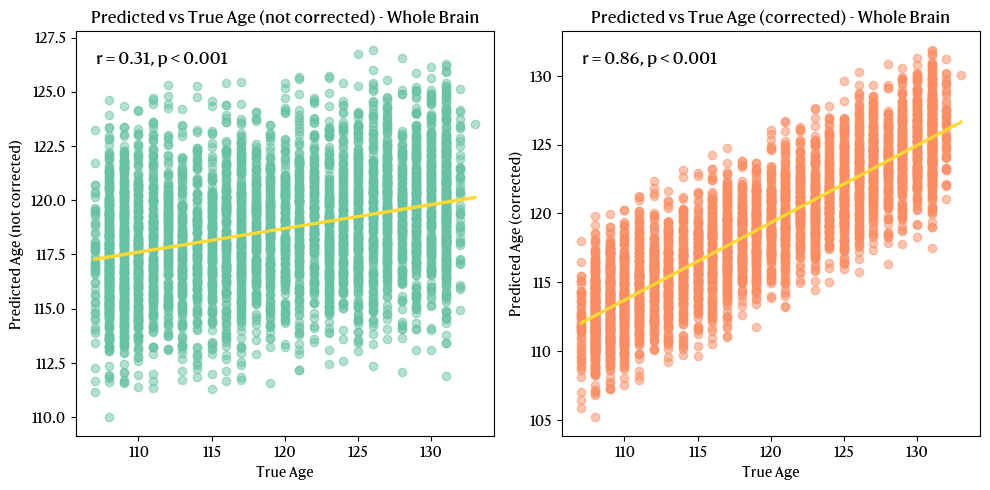

In [339]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_whole_brain_male, y=y_whole_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Whole Brain")
r, pval = scipy.stats.pearsonr(y_whole_brain_male["age"], y_whole_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_whole_brain_male, y=y_whole_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Whole Brain")
r, pval = scipy.stats.pearsonr(y_whole_brain_male["age"], y_whole_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_whole_brain_model_male.png", dpi=300)

In [340]:
# Applying the models to the whole-brain data.
X_whole_brain_female = whole_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness", "PSYPATHO"])
y_whole_brain_female = pd.DataFrame(whole_brain_df_female["age"], columns=["age"])

# Scale the data.
X_whole_brain_female = pd.DataFrame(scale(X_whole_brain_female), columns=X_whole_brain_female.columns)

# Predict the age using the whole-brain female model.
y_whole_brain_female_pred = whole_brain_model_female.predict(X_whole_brain_female)
y_whole_brain_female_pred_corrected = y_whole_brain_female_pred - whole_brain_bias_model_female.predict(y_whole_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_whole_brain_female = mean_absolute_error(y_whole_brain_female, y_whole_brain_female_pred)
print(f"Mean absolute error on whole-brain female data: {mae_whole_brain_female}")
# Calculate the explained variance score
evs_whole_brain_female = explained_variance_score(y_whole_brain_female, y_whole_brain_female_pred)
print(f"Explained variance score on whole-brain female data: {evs_whole_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_whole_brain_female = scipy.stats.pearsonr(y_whole_brain_female["age"], y_whole_brain_female_pred)[0]
print(f"Pearson correlation coefficient on whole-brain female data: {pearson_corr_whole_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_whole_brain_female_corrected = scipy.stats.pearsonr(y_whole_brain_female["age"], y_whole_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on whole-brain female data: {pearson_corr_whole_brain_female_corrected}")

Mean absolute error on whole-brain female data: 6.070605278015137
Explained variance score on whole-brain female data: 0.10353231407655261
Pearson correlation coefficient on whole-brain female data: 0.3226976050465372
Pearson correlation coefficient after bias correction on whole-brain female data: 0.8985679461550489


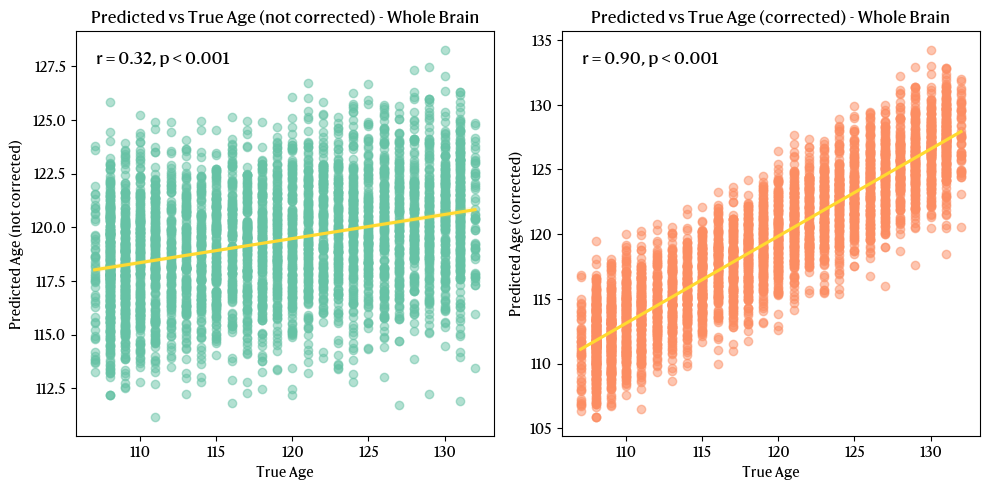

In [341]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_whole_brain_female, y=y_whole_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Whole Brain")
r, pval = scipy.stats.pearsonr(y_whole_brain_female["age"], y_whole_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_whole_brain_female, y=y_whole_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Whole Brain")
r, pval = scipy.stats.pearsonr(y_whole_brain_female["age"], y_whole_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_whole_brain_model_female.png", dpi=300)

In [374]:
# Loading the male/female whole-brain models.
sub_brain_model_male = xgb.XGBRegressor()
sub_brain_model_female = xgb.XGBRegressor()
sub_brain_model_male.load_model(f"{output_dir}/brainAgeModelSubcorticalMale.json")
sub_brain_model_female.load_model(f"{output_dir}/brainAgeModelSubcorticalFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/subcorticalBiasCorrectionModelMale.pkl", "rb") as f:
    sub_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/subcorticalBiasCorrectionModelFemale.pkl", "rb") as f:
    sub_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
sub_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + sub_vol]

# Split into male/female dataframes.
sub_brain_df_male = sub_brain_df[sub_brain_df["sex"] == 1]
sub_brain_df_female = sub_brain_df[sub_brain_df["sex"] == 2]

In [377]:
# Applying the models to the whole-brain data.
X_sub_brain_male = sub_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_sub_brain_male = pd.DataFrame(sub_brain_df_male["age"], columns=["age"])

# Scale the data.
X_sub_brain_male = pd.DataFrame(scale(X_sub_brain_male), columns=X_sub_brain_male.columns)

# Predict the age using the whole-brain male model.
y_sub_brain_male_pred = sub_brain_model_male.predict(X_sub_brain_male)
y_sub_brain_male_pred_corrected = y_sub_brain_male_pred - sub_brain_bias_model_male.predict(y_sub_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_sub_brain_male = mean_absolute_error(y_sub_brain_male, y_sub_brain_male_pred)
print(f"Mean absolute error on sub-brain male data: {mae_sub_brain_male}")
# Calculate the explained variance score
evs_sub_brain_male = explained_variance_score(y_sub_brain_male, y_sub_brain_male_pred)
print(f"Explained variance score on sub-brain male data: {evs_sub_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_sub_brain_male = scipy.stats.pearsonr(y_sub_brain_male["age"], y_sub_brain_male_pred)[0]
print(f"Pearson correlation coefficient on sub-brain male data: {pearson_corr_sub_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_sub_brain_male_corrected = scipy.stats.pearsonr(y_sub_brain_male["age"], y_sub_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on sub-brain male data: {pearson_corr_sub_brain_male_corrected}")

Mean absolute error on sub-brain male data: 6.380408763885498
Explained variance score on sub-brain male data: 0.052475940343881256
Pearson correlation coefficient on sub-brain male data: 0.22907628853286122
Pearson correlation coefficient after bias correction on sub-brain male data: 0.9636630404903277


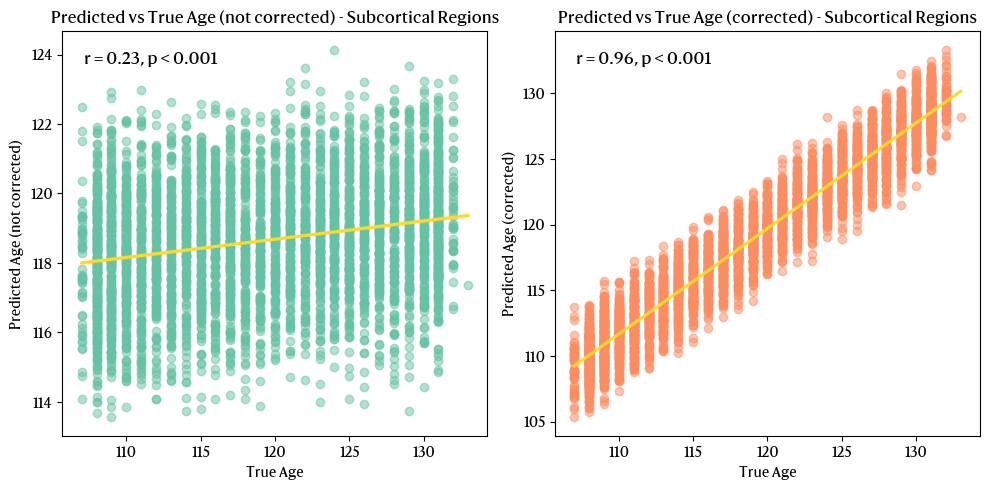

In [378]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_sub_brain_male, y=y_sub_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Subcortical Regions")
r, pval = scipy.stats.pearsonr(y_sub_brain_male["age"], y_sub_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_sub_brain_male, y=y_sub_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Subcortical Regions")
r, pval = scipy.stats.pearsonr(y_sub_brain_male["age"], y_sub_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_subcortical_model_male.png", dpi=300)

In [379]:
# Applying the models to the whole-brain data.
X_sub_brain_female = sub_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_sub_brain_female = pd.DataFrame(sub_brain_df_female["age"], columns=["age"])

# Scale the data.
X_sub_brain_female = pd.DataFrame(scale(X_sub_brain_female), columns=X_sub_brain_female.columns)

# Predict the age using the whole-brain female model.
y_sub_brain_female_pred = sub_brain_model_female.predict(X_sub_brain_female)
y_sub_brain_female_pred_corrected = y_sub_brain_female_pred - sub_brain_bias_model_female.predict(y_sub_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_sub_brain_female = mean_absolute_error(y_sub_brain_female, y_sub_brain_female_pred)
print(f"Mean absolute error on sub-brain female data: {mae_sub_brain_female}")
# Calculate the explained variance score
evs_sub_brain_female = explained_variance_score(y_sub_brain_female, y_sub_brain_female_pred)
print(f"Explained variance score on sub-brain female data: {evs_sub_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_sub_brain_female = scipy.stats.pearsonr(y_sub_brain_female["age"], y_sub_brain_female_pred)[0]
print(f"Pearson correlation coefficient on sub-brain female data: {pearson_corr_sub_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_sub_brain_female_corrected = scipy.stats.pearsonr(y_sub_brain_female["age"], y_sub_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on sub-brain female data: {pearson_corr_sub_brain_female_corrected}")

Mean absolute error on sub-brain female data: 6.285212516784668
Explained variance score on sub-brain female data: 0.050787054481987504
Pearson correlation coefficient on sub-brain female data: 0.23786899918093413
Pearson correlation coefficient after bias correction on sub-brain female data: 0.9333327608300346


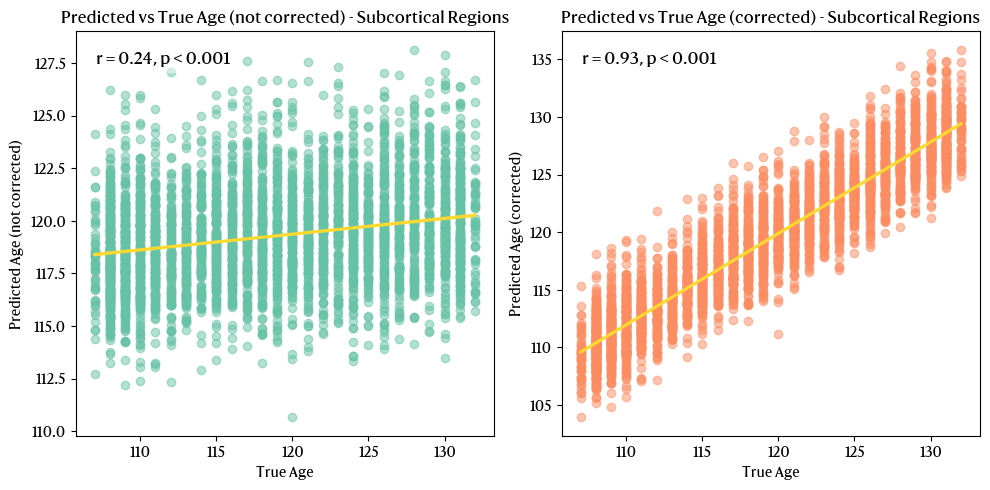

In [380]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_sub_brain_female, y=y_sub_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Subcortical Regions")
r, pval = scipy.stats.pearsonr(y_sub_brain_female["age"], y_sub_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_sub_brain_female, y=y_sub_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Subcortical Regions")
r, pval = scipy.stats.pearsonr(y_sub_brain_female["age"], y_sub_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_subcortical_model_female.png", dpi=300)

In [381]:
# Loading the male/female whole-brain models.
frt_brain_model_male = xgb.XGBRegressor()
frt_brain_model_female = xgb.XGBRegressor()
frt_brain_model_male.load_model(f"{output_dir}/brainAgeModelFrontalMale.json")
frt_brain_model_female.load_model(f"{output_dir}/brainAgeModelFrontalFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/frontalBiasCorrectionModelMale.pkl", "rb") as f:
    frt_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/frontalBiasCorrectionModelFemale.pkl", "rb") as f:
    frt_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
frt_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + frnt_vol + frnt_thick + frnt_area]

# Split into male/female dataframes.
frt_brain_df_male = frt_brain_df[frt_brain_df["sex"] == 1]
frt_brain_df_female = frt_brain_df[frt_brain_df["sex"] == 2]

In [382]:
# Applying the models to the whole-brain data.
X_frt_brain_male = frt_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_frt_brain_male = pd.DataFrame(frt_brain_df_male["age"], columns=["age"])

# Scale the data.
X_frt_brain_male = pd.DataFrame(scale(X_frt_brain_male), columns=X_frt_brain_male.columns)

# Predict the age using the whole-brain male model.
y_frt_brain_male_pred = frt_brain_model_male.predict(X_frt_brain_male)
y_frt_brain_male_pred_corrected = y_frt_brain_male_pred - frt_brain_bias_model_male.predict(y_frt_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_frt_brain_male = mean_absolute_error(y_frt_brain_male, y_frt_brain_male_pred)
print(f"Mean absolute error on frontal brain male data: {mae_frt_brain_male}")
# Calculate the explained variance score
evs_frt_brain_male = explained_variance_score(y_frt_brain_male, y_frt_brain_male_pred)
print(f"Explained variance score on frontal brain male data: {evs_frt_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_frt_brain_male = scipy.stats.pearsonr(y_frt_brain_male["age"], y_frt_brain_male_pred)[0]
print(f"Pearson correlation coefficient on frontal brain male data: {pearson_corr_frt_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_frt_brain_male_corrected = scipy.stats.pearsonr(y_frt_brain_male["age"], y_frt_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on frontal brain male data: {pearson_corr_frt_brain_male_corrected}")

Mean absolute error on frontal brain male data: 6.358957290649414
Explained variance score on frontal brain male data: 0.048917311674135044
Pearson correlation coefficient on frontal brain male data: 0.2287844597137931
Pearson correlation coefficient after bias correction on frontal brain male data: 0.9100282588766615


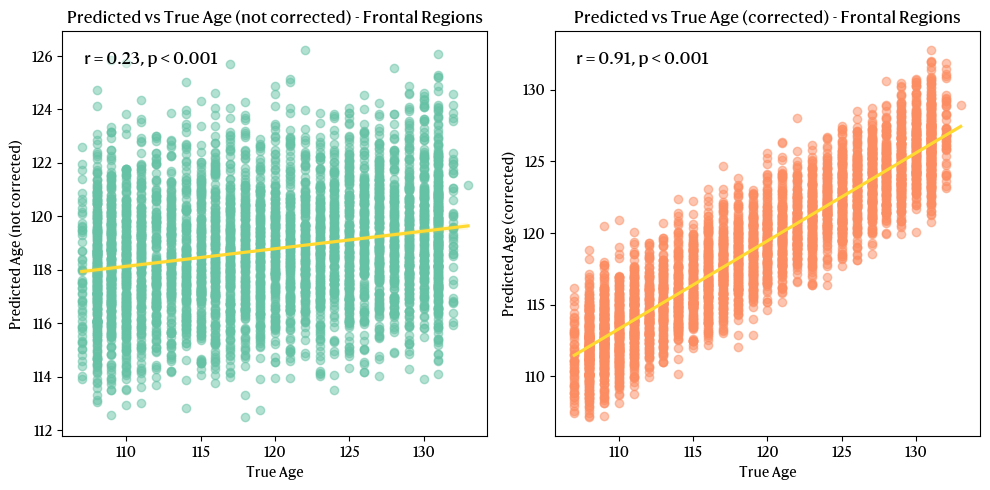

In [383]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_frt_brain_male, y=y_frt_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Frontal Regions")
r, pval = scipy.stats.pearsonr(y_frt_brain_male["age"], y_frt_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_frt_brain_male, y=y_frt_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Frontal Regions")
r, pval = scipy.stats.pearsonr(y_frt_brain_male["age"], y_frt_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_frontal_model_male.png", dpi=300)

In [384]:
# Applying the models to the whole-brain data.
X_frt_brain_female = frt_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_frt_brain_female = pd.DataFrame(frt_brain_df_female["age"], columns=["age"])

# Scale the data.
X_frt_brain_female = pd.DataFrame(scale(X_frt_brain_female), columns=X_frt_brain_female.columns)

# Predict the age using the whole-brain female model.
y_frt_brain_female_pred = frt_brain_model_female.predict(X_frt_brain_female)
y_frt_brain_female_pred_corrected = y_frt_brain_female_pred - frt_brain_bias_model_female.predict(y_frt_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_frt_brain_female = mean_absolute_error(y_frt_brain_female, y_frt_brain_female_pred)
print(f"Mean absolute error on frontal brain female data: {mae_frt_brain_female}")
# Calculate the explained variance score
evs_frt_brain_female = explained_variance_score(y_frt_brain_female, y_frt_brain_female_pred)
print(f"Explained variance score on frontal brain female data: {evs_frt_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_frt_brain_female = scipy.stats.pearsonr(y_frt_brain_female["age"], y_frt_brain_female_pred)[0]
print(f"Pearson correlation coefficient on frontal brain female data: {pearson_corr_frt_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_frt_brain_female_corrected = scipy.stats.pearsonr(y_frt_brain_female["age"], y_frt_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on frontal brain female data: {pearson_corr_frt_brain_female_corrected}")

Mean absolute error on frontal brain female data: 6.211557865142822
Explained variance score on frontal brain female data: 0.0658800695778019
Pearson correlation coefficient on frontal brain female data: 0.25907421549665444
Pearson correlation coefficient after bias correction on frontal brain female data: 0.9327119641555596


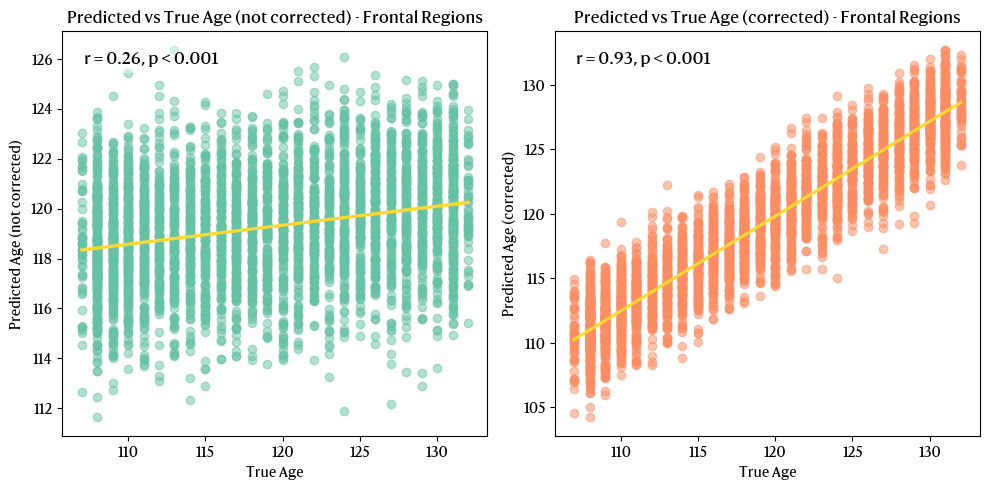

In [385]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_frt_brain_female, y=y_frt_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Frontal Regions")
r, pval = scipy.stats.pearsonr(y_frt_brain_female["age"], y_frt_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_frt_brain_female, y=y_frt_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Frontal Regions")
r, pval = scipy.stats.pearsonr(y_frt_brain_female["age"], y_frt_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_frontal_model_female.png", dpi=300)

In [386]:
# Loading the male/female whole-brain models.
temp_brain_model_male = xgb.XGBRegressor()
temp_brain_model_female = xgb.XGBRegressor()
temp_brain_model_male.load_model(f"{output_dir}/brainAgeModelTemporalMale.json")
temp_brain_model_female.load_model(f"{output_dir}/brainAgeModelTemporalFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/temporalBiasCorrectionModelMale.pkl", "rb") as f:
    temp_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/temporalBiasCorrectionModelFemale.pkl", "rb") as f:
    temp_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
temp_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + temp_vol + temp_thick + temp_area]

# Split into male/female dataframes.
temp_brain_df_male = temp_brain_df[temp_brain_df["sex"] == 1]
temp_brain_df_female = temp_brain_df[temp_brain_df["sex"] == 2]

In [387]:
# Applying the models to the whole-brain data.
X_temp_brain_male = temp_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_temp_brain_male = pd.DataFrame(temp_brain_df_male["age"], columns=["age"])

# Scale the data.
X_temp_brain_male = pd.DataFrame(scale(X_temp_brain_male), columns=X_temp_brain_male.columns)

# Predict the age using the whole-brain male model.
y_temp_brain_male_pred = temp_brain_model_male.predict(X_temp_brain_male)
y_temp_brain_male_pred_corrected = y_temp_brain_male_pred - temp_brain_bias_model_male.predict(y_temp_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_temp_brain_male = mean_absolute_error(y_temp_brain_male, y_temp_brain_male_pred)
print(f"Mean absolute error on temporal brain male data: {mae_temp_brain_male}")
# Calculate the explained variance score
evs_temp_brain_male = explained_variance_score(y_temp_brain_male, y_temp_brain_male_pred)
print(f"Explained variance score on temporal brain male data: {evs_temp_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_temp_brain_male = scipy.stats.pearsonr(y_temp_brain_male["age"], y_temp_brain_male_pred)[0]
print(f"Pearson correlation coefficient on temporal brain male data: {pearson_corr_temp_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_temp_brain_male_corrected = scipy.stats.pearsonr(y_temp_brain_male["age"], y_temp_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on temporal brain male data: {pearson_corr_temp_brain_male_corrected}")

Mean absolute error on temporal brain male data: 6.582989692687988
Explained variance score on temporal brain male data: 0.006715433259196879
Pearson correlation coefficient on temporal brain male data: 0.08208424359466797
Pearson correlation coefficient after bias correction on temporal brain male data: 0.9955807145006496


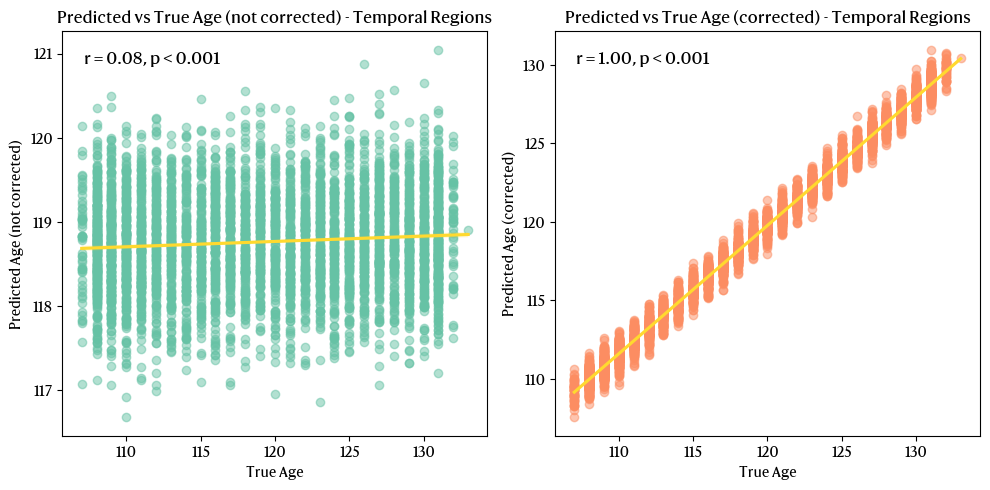

In [388]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_temp_brain_male, y=y_temp_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Temporal Regions")
r, pval = scipy.stats.pearsonr(y_temp_brain_male["age"], y_temp_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_temp_brain_male, y=y_temp_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Temporal Regions")
r, pval = scipy.stats.pearsonr(y_temp_brain_male["age"], y_temp_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_temporal_model_male.png", dpi=300)

In [389]:
# Applying the models to the whole-brain data.
X_temp_brain_female = temp_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_temp_brain_female = pd.DataFrame(temp_brain_df_female["age"], columns=["age"])

# Scale the data.
X_temp_brain_female = pd.DataFrame(scale(X_temp_brain_female), columns=X_temp_brain_female.columns)

# Predict the age using the whole-brain female model.
y_temp_brain_female_pred = temp_brain_model_female.predict(X_temp_brain_female)
y_temp_brain_female_pred_corrected = y_temp_brain_female_pred - temp_brain_bias_model_female.predict(y_temp_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_temp_brain_female = mean_absolute_error(y_temp_brain_female, y_temp_brain_female_pred)
print(f"Mean absolute error on temporal brain female data: {mae_temp_brain_female}")
# Calculate the explained variance score
evs_temp_brain_female = explained_variance_score(y_temp_brain_female, y_temp_brain_female_pred)
print(f"Explained variance score on temporal brain female data: {evs_temp_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_temp_brain_female = scipy.stats.pearsonr(y_temp_brain_female["age"], y_temp_brain_female_pred)[0]
print(f"Pearson correlation coefficient on temporal brain female data: {pearson_corr_temp_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_temp_brain_female_corrected = scipy.stats.pearsonr(y_temp_brain_female["age"], y_temp_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on temporal brain female data: {pearson_corr_temp_brain_female_corrected}")

Mean absolute error on temporal brain female data: 6.503798484802246
Explained variance score on temporal brain female data: -0.010039625703097022
Pearson correlation coefficient on temporal brain female data: 0.08370164321260162
Pearson correlation coefficient after bias correction on temporal brain female data: 0.7500437039155288


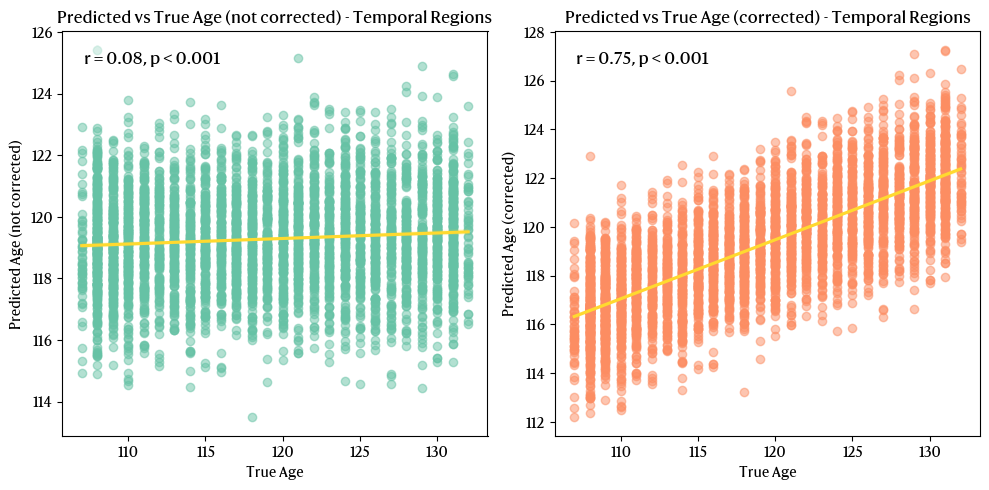

In [390]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_temp_brain_female, y=y_temp_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Temporal Regions")
r, pval = scipy.stats.pearsonr(y_temp_brain_female["age"], y_temp_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_temp_brain_female, y=y_temp_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Temporal Regions")
r, pval = scipy.stats.pearsonr(y_temp_brain_female["age"], y_temp_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_temporal_model_female.png", dpi=300)

In [391]:
# Loading the male/female whole-brain models.
parietal_brain_model_male = xgb.XGBRegressor()
parietal_brain_model_female = xgb.XGBRegressor()
parietal_brain_model_male.load_model(f"{output_dir}/brainAgeModelParietalMale.json")
parietal_brain_model_female.load_model(f"{output_dir}/brainAgeModelParietalFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/parietalBiasCorrectionModelMale.pkl", "rb") as f:
    parietal_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/parietalBiasCorrectionModelFemale.pkl", "rb") as f:
    parietal_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
parietal_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + parietal_vol + parietal_thick + parietal_area]

# Split into male/female dataframes.
parietal_brain_df_male = parietal_brain_df[parietal_brain_df["sex"] == 1]
parietal_brain_df_female = parietal_brain_df[parietal_brain_df["sex"] == 2]

In [392]:
# Applying the models to the whole-brain data.
X_parietal_brain_male = parietal_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_parietal_brain_male = pd.DataFrame(parietal_brain_df_male["age"], columns=["age"])

# Scale the data.
X_parietal_brain_male = pd.DataFrame(scale(X_parietal_brain_male), columns=X_parietal_brain_male.columns)

# Predict the age using the whole-brain male model.
y_parietal_brain_male_pred = parietal_brain_model_male.predict(X_parietal_brain_male)
y_parietal_brain_male_pred_corrected = y_parietal_brain_male_pred - parietal_brain_bias_model_male.predict(y_parietal_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_parietal_brain_male = mean_absolute_error(y_parietal_brain_male, y_parietal_brain_male_pred)
print(f"Mean absolute error on parietal brain male data: {mae_parietal_brain_male}")
# Calculate the explained variance score
evs_parietal_brain_male = explained_variance_score(y_parietal_brain_male, y_parietal_brain_male_pred)
print(f"Explained variance score on parietal brain male data: {evs_parietal_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_parietal_brain_male = scipy.stats.pearsonr(y_parietal_brain_male["age"], y_parietal_brain_male_pred)[0]
print(f"Pearson correlation coefficient on parietal brain male data: {pearson_corr_parietal_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_parietal_brain_male_corrected = scipy.stats.pearsonr(y_parietal_brain_male["age"], y_parietal_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on parietal brain male data: {pearson_corr_parietal_brain_male_corrected}")

Mean absolute error on parietal brain male data: 6.549238204956055
Explained variance score on parietal brain male data: 0.013523159935476703
Pearson correlation coefficient on parietal brain male data: 0.11787181702996492
Pearson correlation coefficient after bias correction on parietal brain male data: 0.9899556802415171


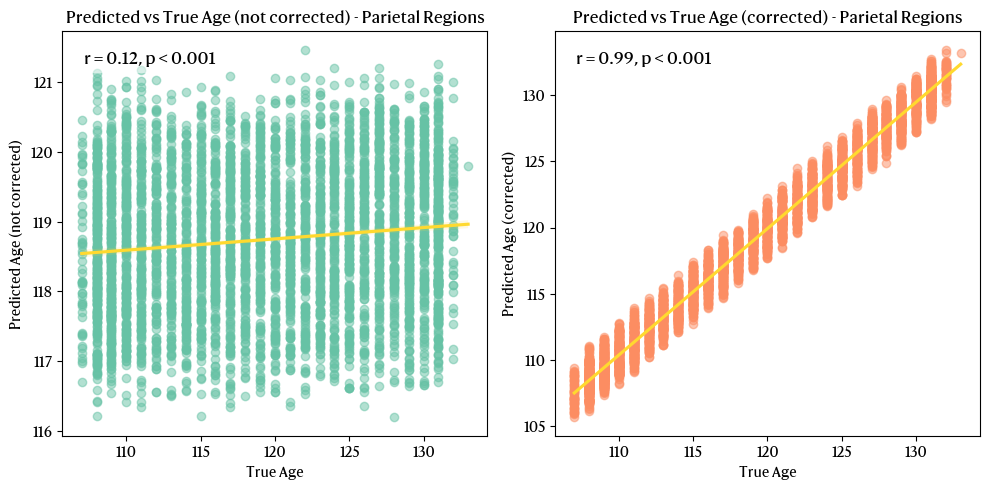

In [393]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_parietal_brain_male, y=y_parietal_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Parietal Regions")
r, pval = scipy.stats.pearsonr(y_parietal_brain_male["age"], y_parietal_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_parietal_brain_male, y=y_parietal_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Parietal Regions")
r, pval = scipy.stats.pearsonr(y_parietal_brain_male["age"], y_parietal_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_parietal_model_male.png", dpi=300)

In [394]:
# Applying the models to the whole-brain data.
X_parietal_brain_female = parietal_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_parietal_brain_female = pd.DataFrame(parietal_brain_df_female["age"], columns=["age"])

# Scale the data.
X_parietal_brain_female = pd.DataFrame(scale(X_parietal_brain_female), columns=X_parietal_brain_female.columns)

# Predict the age using the whole-brain female model.
y_parietal_brain_female_pred = parietal_brain_model_female.predict(X_parietal_brain_female)
y_parietal_brain_female_pred_corrected = y_parietal_brain_female_pred - parietal_brain_bias_model_female.predict(y_parietal_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_parietal_brain_female = mean_absolute_error(y_parietal_brain_female, y_parietal_brain_female_pred)
print(f"Mean absolute error on parietal brain female data: {mae_parietal_brain_female}")
# Calculate the explained variance score
evs_parietal_brain_female = explained_variance_score(y_parietal_brain_female, y_parietal_brain_female_pred)
print(f"Explained variance score on parietal brain female data: {evs_parietal_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_parietal_brain_female = scipy.stats.pearsonr(y_parietal_brain_female["age"], y_parietal_brain_female_pred)[0]
print(f"Pearson correlation coefficient on parietal brain female data: {pearson_corr_parietal_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_parietal_brain_female_corrected = scipy.stats.pearsonr(y_parietal_brain_female["age"], y_parietal_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on parietal brain female data: {pearson_corr_parietal_brain_female_corrected}")

Mean absolute error on parietal brain female data: 6.4207611083984375
Explained variance score on parietal brain female data: 0.021107399380013936
Pearson correlation coefficient on parietal brain female data: 0.14955040922298563
Pearson correlation coefficient after bias correction on parietal brain female data: 0.9742090649182811


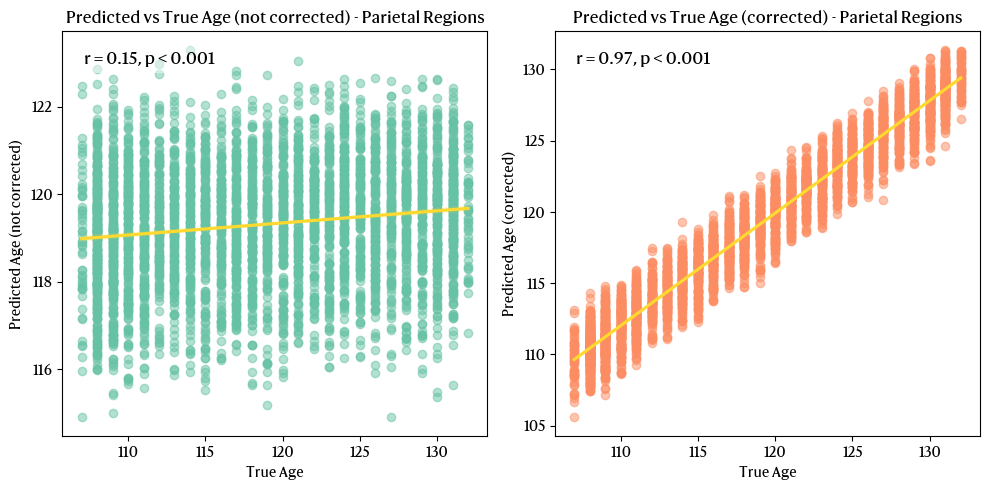

In [395]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_parietal_brain_female, y=y_parietal_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Parietal Regions")
r, pval = scipy.stats.pearsonr(y_parietal_brain_female["age"], y_parietal_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_parietal_brain_female, y=y_parietal_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Parietal Regions")
r, pval = scipy.stats.pearsonr(y_parietal_brain_female["age"], y_parietal_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_parietal_model_female.png", dpi=300)

In [396]:
# Loading the male/female whole-brain models.
insula_brain_model_male = xgb.XGBRegressor()
insula_brain_model_female = xgb.XGBRegressor()
insula_brain_model_male.load_model(f"{output_dir}/brainAgeModelInsularMale.json")
insula_brain_model_female.load_model(f"{output_dir}/brainAgeModelInsularFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/insularBiasCorrectionModelMale.pkl", "rb") as f:
    insula_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/insularBiasCorrectionModelFemale.pkl", "rb") as f:
    insula_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
insula_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + insula_vol + insula_thick + insula_area]

# Split into male/female dataframes.
insula_brain_df_male = insula_brain_df[insula_brain_df["sex"] == 1]
insula_brain_df_female = insula_brain_df[insula_brain_df["sex"] == 2]

In [397]:
# Applying the models to the whole-brain data.
X_insula_brain_male = insula_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_insula_brain_male = pd.DataFrame(insula_brain_df_male["age"], columns=["age"])

# Scale the data.
X_insula_brain_male = pd.DataFrame(scale(X_insula_brain_male), columns=X_insula_brain_male.columns)

# Predict the age using the whole-brain male model.
y_insula_brain_male_pred = insula_brain_model_male.predict(X_insula_brain_male)
y_insula_brain_male_pred_corrected = y_insula_brain_male_pred - insula_brain_bias_model_male.predict(y_insula_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_insula_brain_male = mean_absolute_error(y_insula_brain_male, y_insula_brain_male_pred)
print(f"Mean absolute error on insula brain male data: {mae_insula_brain_male}")
# Calculate the explained variance score
evs_insula_brain_male = explained_variance_score(y_insula_brain_male, y_insula_brain_male_pred)
print(f"Explained variance score on insula brain male data: {evs_insula_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_insula_brain_male = scipy.stats.pearsonr(y_insula_brain_male["age"], y_insula_brain_male_pred)[0]
print(f"Pearson correlation coefficient on insula brain male data: {pearson_corr_insula_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_insula_brain_male_corrected = scipy.stats.pearsonr(y_insula_brain_male["age"], y_insula_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on insula brain male data: {pearson_corr_insula_brain_male_corrected}")

Mean absolute error on insula brain male data: 6.5695576667785645
Explained variance score on insula brain male data: 0.006127132242056632
Pearson correlation coefficient on insula brain male data: 0.08397633709094392
Pearson correlation coefficient after bias correction on insula brain male data: 0.9929149337582647


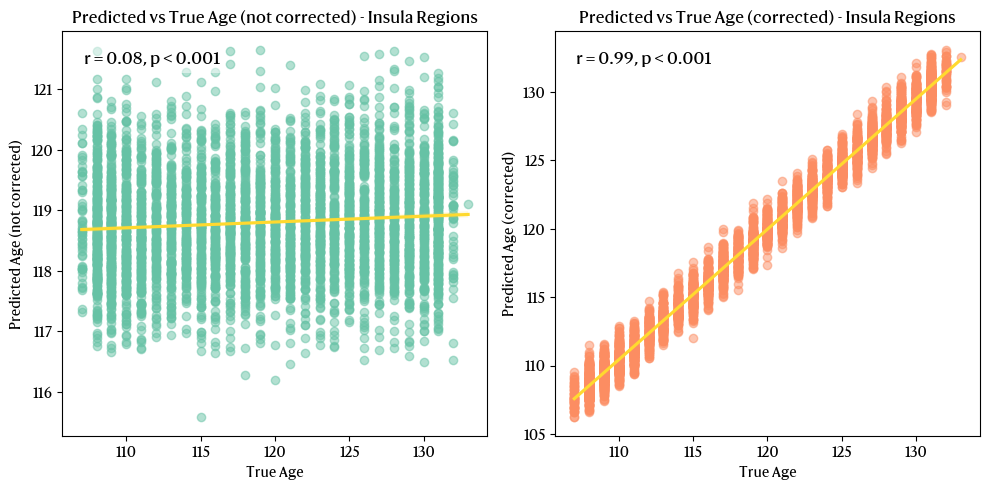

In [398]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_insula_brain_male, y=y_insula_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Insula Regions")
r, pval = scipy.stats.pearsonr(y_insula_brain_male["age"], y_insula_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_insula_brain_male, y=y_insula_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Insula Regions")
r, pval = scipy.stats.pearsonr(y_insula_brain_male["age"], y_insula_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_insula_model_male.png", dpi=300)

In [399]:
# Applying the models to the whole-brain data.
X_insula_brain_female = insula_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_insula_brain_female = pd.DataFrame(insula_brain_df_female["age"], columns=["age"])

# Scale the data.
X_insula_brain_female = pd.DataFrame(scale(X_insula_brain_female), columns=X_insula_brain_female.columns)

# Predict the age using the whole-brain female model.
y_insula_brain_female_pred = insula_brain_model_female.predict(X_insula_brain_female)
y_insula_brain_female_pred_corrected = y_insula_brain_female_pred - insula_brain_bias_model_female.predict(y_insula_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_insula_brain_female = mean_absolute_error(y_insula_brain_female, y_insula_brain_female_pred)
print(f"Mean absolute error on insula brain female data: {mae_insula_brain_female}")
# Calculate the explained variance score
evs_insula_brain_female = explained_variance_score(y_insula_brain_female, y_insula_brain_female_pred)
print(f"Explained variance score on insula brain female data: {evs_insula_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_insula_brain_female = scipy.stats.pearsonr(y_insula_brain_female["age"], y_insula_brain_female_pred)[0]
print(f"Pearson correlation coefficient on insula brain female data: {pearson_corr_insula_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_insula_brain_female_corrected = scipy.stats.pearsonr(y_insula_brain_female["age"], y_insula_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on insula brain female data: {pearson_corr_insula_brain_female_corrected}")

Mean absolute error on insula brain female data: 6.494375705718994
Explained variance score on insula brain female data: -0.0006490411180828382
Pearson correlation coefficient on insula brain female data: 0.09763061306086429
Pearson correlation coefficient after bias correction on insula brain female data: 0.9525412738140291


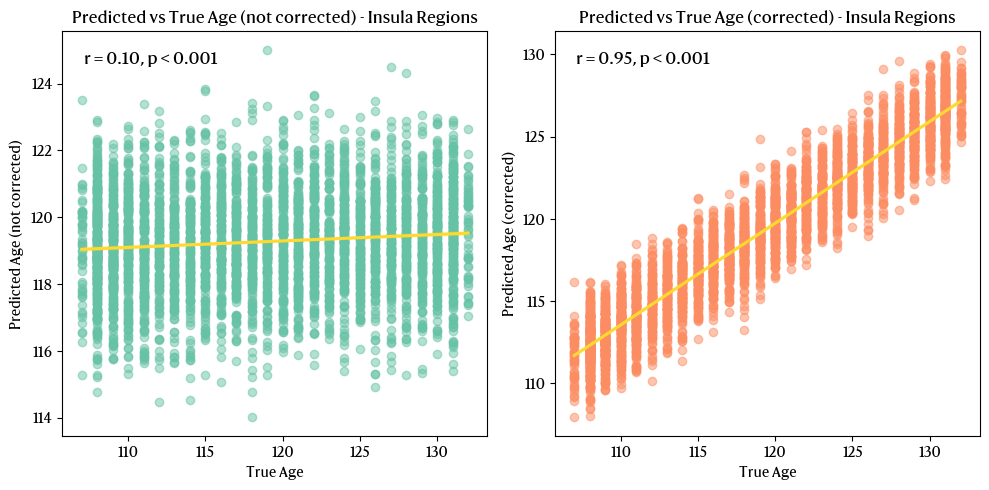

In [400]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_insula_brain_female, y=y_insula_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Insula Regions")
r, pval = scipy.stats.pearsonr(y_insula_brain_female["age"], y_insula_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_insula_brain_female, y=y_insula_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Insula Regions")
r, pval = scipy.stats.pearsonr(y_insula_brain_female["age"], y_insula_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_insula_model_female.png", dpi=300)

In [401]:
# Loading the male/female whole-brain models.
limbic_brain_model_male = xgb.XGBRegressor()
limbic_brain_model_female = xgb.XGBRegressor()
limbic_brain_model_male.load_model(f"{output_dir}/brainAgeModelLimbicMale.json")
limbic_brain_model_female.load_model(f"{output_dir}/brainAgeModelLimbicFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/limbicBiasCorrectionModelMale.pkl", "rb") as f:
    limbic_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/limbicBiasCorrectionModelFemale.pkl", "rb") as f:
    limbic_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
limbic_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + limbic_vol + limbic_thick + limbic_area]

# Split into male/female dataframes.
limbic_brain_df_male = limbic_brain_df[limbic_brain_df["sex"] == 1]
limbic_brain_df_female = limbic_brain_df[limbic_brain_df["sex"] == 2]

In [402]:
# Applying the models to the whole-brain data.
X_limbic_brain_male = limbic_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_limbic_brain_male = pd.DataFrame(limbic_brain_df_male["age"], columns=["age"])

# Scale the data.
X_limbic_brain_male = pd.DataFrame(scale(X_limbic_brain_male), columns=X_limbic_brain_male.columns)

# Predict the age using the whole-brain male model.
y_limbic_brain_male_pred = limbic_brain_model_male.predict(X_limbic_brain_male)
y_limbic_brain_male_pred_corrected = y_limbic_brain_male_pred - limbic_brain_bias_model_male.predict(y_limbic_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_limbic_brain_male = mean_absolute_error(y_limbic_brain_male, y_limbic_brain_male_pred)
print(f"Mean absolute error on limbic brain male data: {mae_limbic_brain_male}")
# Calculate the explained variance score
evs_limbic_brain_male = explained_variance_score(y_limbic_brain_male, y_limbic_brain_male_pred)
print(f"Explained variance score on limbic brain male data: {evs_limbic_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_limbic_brain_male = scipy.stats.pearsonr(y_limbic_brain_male["age"], y_limbic_brain_male_pred)[0]
print(f"Pearson correlation coefficient on limbic brain male data: {pearson_corr_limbic_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_limbic_brain_male_corrected = scipy.stats.pearsonr(y_limbic_brain_male["age"], y_limbic_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on limbic brain male data: {pearson_corr_limbic_brain_male_corrected}")

Mean absolute error on limbic brain male data: 6.510959625244141
Explained variance score on limbic brain male data: 0.01209759345789041
Pearson correlation coefficient on limbic brain male data: 0.13229325244734005
Pearson correlation coefficient after bias correction on limbic brain male data: 0.9748469322782294


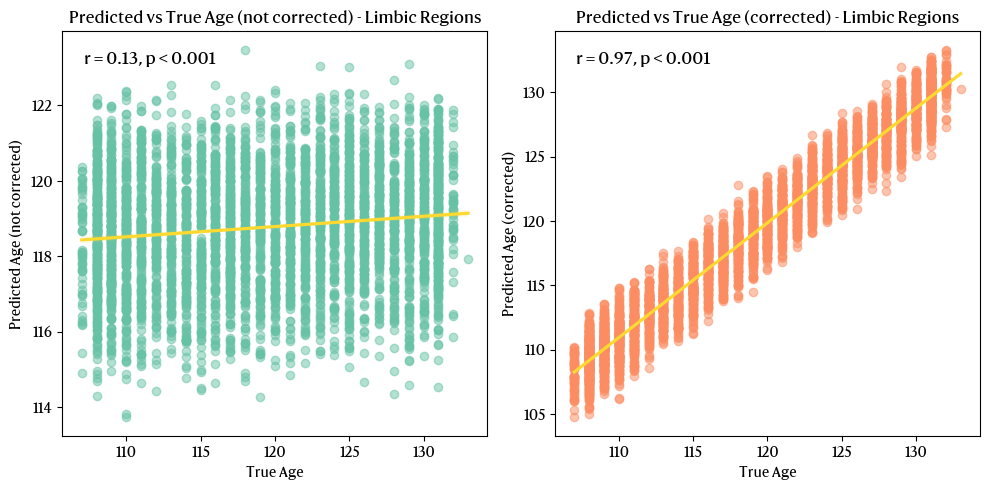

In [403]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_limbic_brain_male, y=y_limbic_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Limbic Regions")
r, pval = scipy.stats.pearsonr(y_limbic_brain_male["age"], y_limbic_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_limbic_brain_male, y=y_limbic_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Limbic Regions")
r, pval = scipy.stats.pearsonr(y_limbic_brain_male["age"], y_limbic_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_limbic_model_male.png", dpi=300)

In [404]:
# Applying the models to the whole-brain data.
X_limbic_brain_female = limbic_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_limbic_brain_female = pd.DataFrame(limbic_brain_df_female["age"], columns=["age"])

# Scale the data.
X_limbic_brain_female = pd.DataFrame(scale(X_limbic_brain_female), columns=X_limbic_brain_female.columns)

# Predict the age using the whole-brain female model.
y_limbic_brain_female_pred = limbic_brain_model_female.predict(X_limbic_brain_female)
y_limbic_brain_female_pred_corrected = y_limbic_brain_female_pred - limbic_brain_bias_model_female.predict(y_limbic_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_limbic_brain_female = mean_absolute_error(y_limbic_brain_female, y_limbic_brain_female_pred)
print(f"Mean absolute error on limbic brain female data: {mae_limbic_brain_female}")
# Calculate the explained variance score
evs_limbic_brain_female = explained_variance_score(y_limbic_brain_female, y_limbic_brain_female_pred)
print(f"Explained variance score on limbic brain female data: {evs_limbic_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_limbic_brain_female = scipy.stats.pearsonr(y_limbic_brain_female["age"], y_limbic_brain_female_pred)[0]
print(f"Pearson correlation coefficient on limbic brain female data: {pearson_corr_limbic_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_limbic_brain_female_corrected = scipy.stats.pearsonr(y_limbic_brain_female["age"], y_limbic_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on limbic brain female data: {pearson_corr_limbic_brain_female_corrected}")

Mean absolute error on limbic brain female data: 6.448154926300049
Explained variance score on limbic brain female data: 0.01346091787724657
Pearson correlation coefficient on limbic brain female data: 0.13078637533731446
Pearson correlation coefficient after bias correction on limbic brain female data: 0.9790201770671512


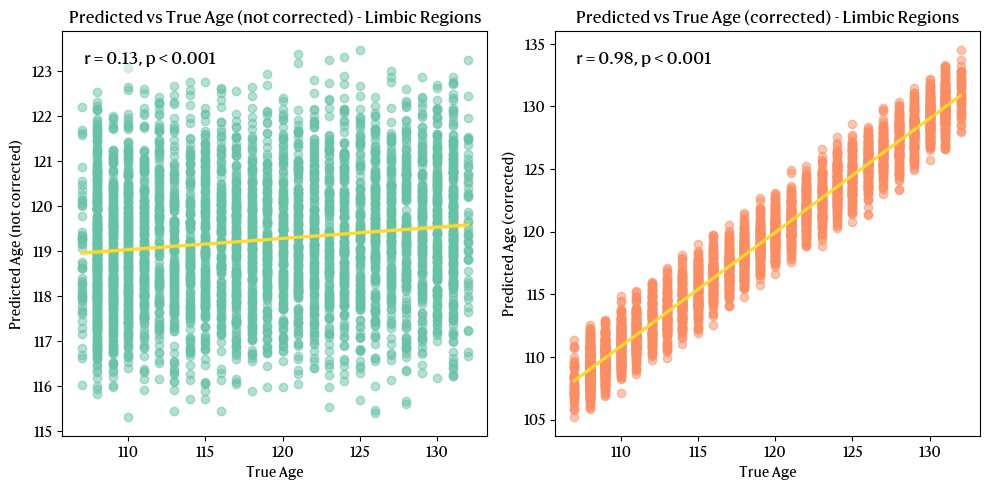

In [405]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_limbic_brain_female, y=y_limbic_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Limbic Regions")
r, pval = scipy.stats.pearsonr(y_limbic_brain_female["age"], y_limbic_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_limbic_brain_female, y=y_limbic_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Limbic Regions")
r, pval = scipy.stats.pearsonr(y_limbic_brain_female["age"], y_limbic_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_limbic_model_female.png", dpi=300)

In [406]:
# Loading the male/female whole-brain models.
occ_brain_model_male = xgb.XGBRegressor()
occ_brain_model_female = xgb.XGBRegressor()
occ_brain_model_male.load_model(f"{output_dir}/brainAgeModelOccipitalMale.json")
occ_brain_model_female.load_model(f"{output_dir}/brainAgeModelOccipitalFemale.json")

# Bias correction models for whole-brain.
with open(f"{output_dir}/occipitalBiasCorrectionModelMale.pkl", "rb") as f:
    occ_brain_bias_model_male = pickle.load(f)
with open(f"{output_dir}/occipitalBiasCorrectionModelFemale.pkl", "rb") as f:
    occ_brain_bias_model_female = pickle.load(f)

# Load the whole-brain data.
occ_brain_df = whole_brain_df[["sid", "family_id", "site", "age", "sex", "handedness"] + occipital_vol + occipital_thick + occipital_area]

# Split into male/female dataframes.
occ_brain_df_male = occ_brain_df[occ_brain_df["sex"] == 1]
occ_brain_df_female = occ_brain_df[occ_brain_df["sex"] == 2]

In [408]:
# Applying the models to the whole-brain data.
X_occ_brain_male = occ_brain_df_male.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_occ_brain_male = pd.DataFrame(occ_brain_df_male["age"], columns=["age"])

# Scale the data.
X_occ_brain_male = pd.DataFrame(scale(X_occ_brain_male), columns=X_occ_brain_male.columns)

# Predict the age using the whole-brain male model.
y_occ_brain_male_pred = occ_brain_model_male.predict(X_occ_brain_male)
y_occ_brain_male_pred_corrected = y_occ_brain_male_pred - occ_brain_bias_model_male.predict(y_occ_brain_male["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_occ_brain_male = mean_absolute_error(y_occ_brain_male, y_occ_brain_male_pred)
print(f"Mean absolute error on occipital brain male data: {mae_occ_brain_male}")
# Calculate the explained variance score
evs_occ_brain_male = explained_variance_score(y_occ_brain_male, y_occ_brain_male_pred)
print(f"Explained variance score on occipital brain male data: {evs_occ_brain_male}")
# Compute the Pearson correlation coefficient
pearson_corr_occ_brain_male = scipy.stats.pearsonr(y_occ_brain_male["age"], y_occ_brain_male_pred)[0]
print(f"Pearson correlation coefficient on occipital brain male data: {pearson_corr_occ_brain_male}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_occ_brain_male_corrected = scipy.stats.pearsonr(y_occ_brain_male["age"], y_occ_brain_male_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on occipital brain male data: {pearson_corr_occ_brain_male_corrected}")

Mean absolute error on occipital brain male data: 6.490675449371338
Explained variance score on occipital brain male data: 0.025529878020878027
Pearson correlation coefficient on occipital brain male data: 0.16009863942918193
Pearson correlation coefficient after bias correction on occipital brain male data: 0.9846078365304775


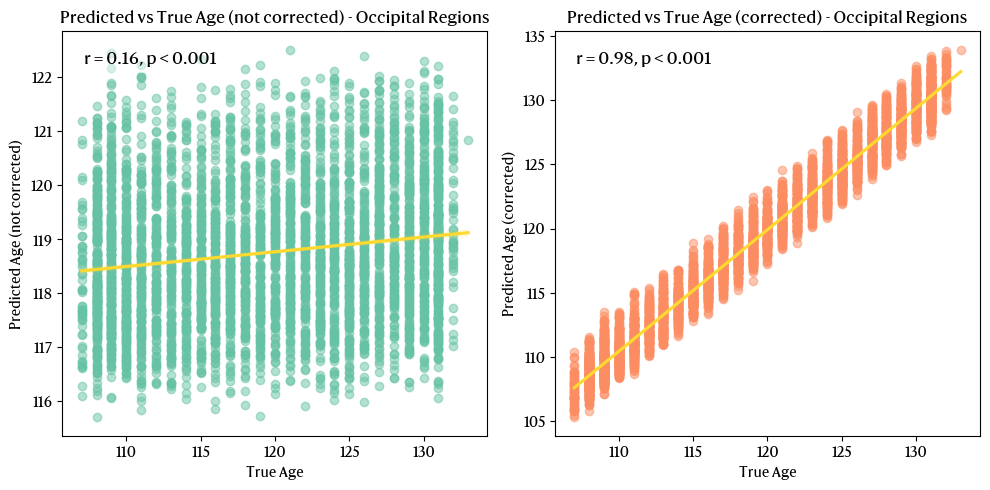

In [409]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_occ_brain_male, y=y_occ_brain_male_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Occipital Regions")
r, pval = scipy.stats.pearsonr(y_occ_brain_male["age"], y_occ_brain_male_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_occ_brain_male, y=y_occ_brain_male_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Occipital Regions")
r, pval = scipy.stats.pearsonr(y_occ_brain_male["age"], y_occ_brain_male_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_occipital_model_male.png", dpi=300)

In [410]:
# Applying the models to the whole-brain data.
X_occ_brain_female = occ_brain_df_female.drop(columns=["sid", "family_id", "site", "age", "sex", "handedness"])
y_occ_brain_female = pd.DataFrame(occ_brain_df_female["age"], columns=["age"])

# Scale the data.
X_occ_brain_female = pd.DataFrame(scale(X_occ_brain_female), columns=X_occ_brain_female.columns)

# Predict the age using the whole-brain female model.
y_occ_brain_female_pred = occ_brain_model_female.predict(X_occ_brain_female)
y_occ_brain_female_pred_corrected = y_occ_brain_female_pred - occ_brain_bias_model_female.predict(y_occ_brain_female["age"].values.reshape(-1, 1))

# Calculate the mean absolute error
mae_occ_brain_female = mean_absolute_error(y_occ_brain_female, y_occ_brain_female_pred)
print(f"Mean absolute error on occipital brain female data: {mae_occ_brain_female}")
# Calculate the explained variance score
evs_occ_brain_female = explained_variance_score(y_occ_brain_female, y_occ_brain_female_pred)
print(f"Explained variance score on occipital brain female data: {evs_occ_brain_female}")
# Compute the Pearson correlation coefficient
pearson_corr_occ_brain_female = scipy.stats.pearsonr(y_occ_brain_female["age"], y_occ_brain_female_pred)[0]
print(f"Pearson correlation coefficient on occipital brain female data: {pearson_corr_occ_brain_female}")
# Calculate the Pearson correlation coefficient after bias correction
pearson_corr_occ_brain_female_corrected = scipy.stats.pearsonr(y_occ_brain_female["age"], y_occ_brain_female_pred_corrected)[0]
print(f"Pearson correlation coefficient after bias correction on occipital brain female data: {pearson_corr_occ_brain_female_corrected}")

Mean absolute error on occipital brain female data: 6.403491020202637
Explained variance score on occipital brain female data: 0.02665587772418243
Pearson correlation coefficient on occipital brain female data: 0.17260194178880212
Pearson correlation coefficient after bias correction on occipital brain female data: 0.9710634689081387


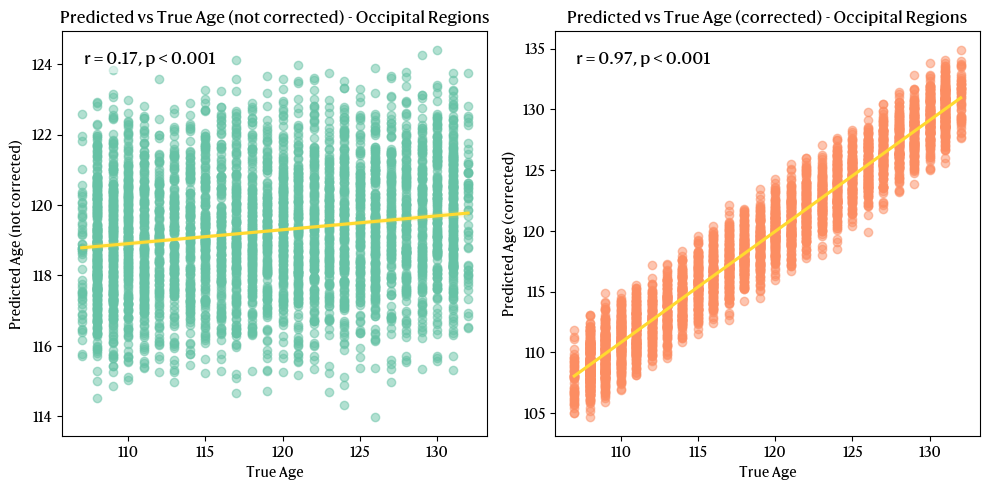

In [411]:
# Visualize the results.
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the predicted vs true values.
sns.regplot(x=y_occ_brain_female, y=y_occ_brain_female_pred, ax=ax[0], scatter_kws={"alpha": 0.5, "color": cmap[0]}, line_kws={"color": cmap[5]})
ax[0].set_xlabel("True Age")
ax[0].set_ylabel("Predicted Age (not corrected)")
ax[0].set_title("Predicted vs True Age (not corrected) - Occipital Regions")
r, pval = scipy.stats.pearsonr(y_occ_brain_female["age"], y_occ_brain_female_pred)
ax[0].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[0].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
# Plot the predicted vs true values (corrected).
sns.regplot(x=y_occ_brain_female, y=y_occ_brain_female_pred_corrected, ax=ax[1], scatter_kws={"alpha": 0.5, "color": cmap[1]}, line_kws={"color": cmap[5]})
ax[1].set_xlabel("True Age")
ax[1].set_ylabel("Predicted Age (corrected)")
ax[1].set_title("Predicted vs True Age (corrected) - Occipital Regions")
r, pval = scipy.stats.pearsonr(y_occ_brain_female["age"], y_occ_brain_female_pred_corrected)
ax[1].text(0.05, 0.95, f"r = {r:.2f}, p < {round(pval) + 0.001}",
         transform=ax[1].transAxes, fontsize=12,
         verticalalignment="top", horizontalalignment="left",
         bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.tight_layout()
plt.savefig(f"{output_dir}/applied_occipital_model_female.png", dpi=300)

In [412]:
# Calculate the BAG for male/female models.
whole_brain_BAG_male = y_whole_brain_male_pred - y_whole_brain_male["age"]
whole_brain_BAG_female = y_whole_brain_female_pred - y_whole_brain_female["age"]
whole_brain_BAG_male_corr = y_whole_brain_male_pred_corrected - y_whole_brain_male["age"]
whole_brain_BAG_female_corr = y_whole_brain_female_pred_corrected - y_whole_brain_female["age"]

sub_BAG_male = y_sub_brain_male_pred - y_sub_brain_male["age"]
sub_BAG_female = y_sub_brain_female_pred - y_sub_brain_female["age"]
sub_BAG_male_corr = y_sub_brain_male_pred_corrected - y_sub_brain_male["age"]
sub_BAG_female_corr = y_sub_brain_female_pred_corrected - y_sub_brain_female["age"]

frt_BAG_male = y_frt_brain_male_pred - y_frt_brain_male["age"]
frt_BAG_female = y_frt_brain_female_pred - y_frt_brain_female["age"]
frt_BAG_male_corr = y_frt_brain_male_pred_corrected - y_frt_brain_male["age"]
frt_BAG_female_corr = y_frt_brain_female_pred_corrected - y_frt_brain_female["age"]

temp_BAG_male = y_temp_brain_male_pred - y_temp_brain_male["age"]
temp_BAG_female = y_temp_brain_female_pred - y_temp_brain_female["age"]
temp_BAG_male_corr = y_temp_brain_male_pred_corrected - y_temp_brain_male["age"]
temp_BAG_female_corr = y_temp_brain_female_pred_corrected - y_temp_brain_female["age"]

parietal_BAG_male = y_parietal_brain_male_pred - y_parietal_brain_male["age"]
parietal_BAG_female = y_parietal_brain_female_pred - y_parietal_brain_female["age"]
parietal_BAG_male_corr = y_parietal_brain_male_pred_corrected - y_parietal_brain_male["age"]
parietal_BAG_female_corr = y_parietal_brain_female_pred_corrected - y_parietal_brain_female["age"]

insula_BAG_male = y_insula_brain_male_pred - y_insula_brain_male["age"]
insula_BAG_female = y_insula_brain_female_pred - y_insula_brain_female["age"]
insula_BAG_male_corr = y_insula_brain_male_pred_corrected - y_insula_brain_male["age"]
insula_BAG_female_corr = y_insula_brain_female_pred_corrected - y_insula_brain_female["age"]

limbic_BAG_male = y_limbic_brain_male_pred - y_limbic_brain_male["age"]
limbic_BAG_female = y_limbic_brain_female_pred - y_limbic_brain_female["age"]
limbic_BAG_male_corr = y_limbic_brain_male_pred_corrected - y_limbic_brain_male["age"]
limbic_BAG_female_corr = y_limbic_brain_female_pred_corrected - y_limbic_brain_female["age"]

occipital_BAG_male = y_occ_brain_male_pred - y_occ_brain_male["age"]
occipital_BAG_female = y_occ_brain_female_pred - y_occ_brain_female["age"]
occipital_BAG_male_corr = y_occ_brain_male_pred_corrected - y_occ_brain_male["age"]
occipital_BAG_female_corr = y_occ_brain_female_pred_corrected - y_occ_brain_female["age"]

In [413]:
# Merging BAG together in a male and a female dataframe.
male_bag_df = pd.DataFrame({
    "sid": whole_brain_df_male["sid"],
    "family_id": whole_brain_df_male["family_id"],
    "site": whole_brain_df_male["site"],
    "age": whole_brain_df_male["age"],
    "sex": whole_brain_df_male["sex"],
    "handedness": whole_brain_df_male["handedness"],
    },
    columns=["sid", "family_id", "site", "age", "sex", "handedness"])

male_bag_df["BAG_WholeBrain"] = whole_brain_BAG_male
male_bag_df["BAG_Subcortical"] = sub_BAG_male
male_bag_df["BAG_Frontal"] = frt_BAG_male
male_bag_df["BAG_Temporal"] = temp_BAG_male
male_bag_df["BAG_Parietal"] = parietal_BAG_male
male_bag_df["BAG_Insula"] = insula_BAG_male
male_bag_df["BAG_Limbic"] = limbic_BAG_male
male_bag_df["BAG_Occipital"] = occipital_BAG_male
male_bag_df["BAG_WholeBrain_Corrected"] = whole_brain_BAG_male_corr
male_bag_df["BAG_Subcortical_Corrected"] = sub_BAG_male_corr
male_bag_df["BAG_Frontal_Corrected"] = frt_BAG_male_corr
male_bag_df["BAG_Temporal_Corrected"] = temp_BAG_male_corr
male_bag_df["BAG_Parietal_Corrected"] = parietal_BAG_male_corr
male_bag_df["BAG_Insula_Corrected"] = insula_BAG_male_corr
male_bag_df["BAG_Limbic_Corrected"] = limbic_BAG_male_corr
male_bag_df["BAG_Occipital_Corrected"] = occipital_BAG_male_corr

male_bag_df.to_csv(f"{output_dir}/brainAgeGapsMale.csv", index=False)

female_bag_df = pd.DataFrame({
    "sid": whole_brain_df_female["sid"],
    "family_id": whole_brain_df_female["family_id"],
    "site": whole_brain_df_female["site"],
    "age": whole_brain_df_female["age"],
    "sex": whole_brain_df_female["sex"],
    "handedness": whole_brain_df_female["handedness"],
    },
    columns=["sid", "family_id", "site", "age", "sex", "handedness"])

female_bag_df["BAG_WholeBrain"] = whole_brain_BAG_female
female_bag_df["BAG_Subcortical"] = sub_BAG_female
female_bag_df["BAG_Frontal"] = frt_BAG_female
female_bag_df["BAG_Temporal"] = temp_BAG_female
female_bag_df["BAG_Parietal"] = parietal_BAG_female
female_bag_df["BAG_Insula"] = insula_BAG_female
female_bag_df["BAG_Limbic"] = limbic_BAG_female
female_bag_df["BAG_Occipital"] = occipital_BAG_female
female_bag_df["BAG_WholeBrain_Corrected"] = whole_brain_BAG_female_corr
female_bag_df["BAG_Subcortical_Corrected"] = sub_BAG_female_corr
female_bag_df["BAG_Frontal_Corrected"] = frt_BAG_female_corr
female_bag_df["BAG_Temporal_Corrected"] = temp_BAG_female_corr
female_bag_df["BAG_Parietal_Corrected"] = parietal_BAG_female_corr
female_bag_df["BAG_Insula_Corrected"] = insula_BAG_female_corr
female_bag_df["BAG_Limbic_Corrected"] = limbic_BAG_female_corr
female_bag_df["BAG_Occipital_Corrected"] = occipital_BAG_female_corr

female_bag_df.to_csv(f"{output_dir}/brainAgeGapsFemale.csv", index=False)


### **Assessing highest contributing features in each model**

In [46]:
# Create summary figure of the most important features for each model (1 fig containing 8 subplots)
# Create a loop that loads the model, extracts feature importance, and plots it.
model_names = [
    "WholeBrain",
    "Subcortical",
    "Frontal",
    "Temporal",
    "Parietal",
    "Insular",
    "Limbic",
    "Occipital"
]

# 3 figures, one for combined model, one for male and one for female.
for sex in ["Male", "Female", "Both"]:
    sex_label = sex if sex != "Both" else ""

    fig, ax = plt.subplots(2, 4, figsize=(12, 8))
    axs = ax.flatten()

    for i, model_name in enumerate(model_names):
        model = xgb.XGBRegressor()
        model.load_model(f"{output_dir}/brainAgeModel{model_name}{sex_label}.json")

        # Get feature importance
        importance = model.get_booster().get_score(importance_type='weight')
        importance_df = pd.DataFrame(importance.items(), columns=['Feature', 'Importance'])
        importance_df = importance_df.sort_values(by='Importance', ascending=False).head(10)
        sns.barplot(x='Importance', y='Feature', data=importance_df, ax=axs[i], palette="viridis", hue='Importance', dodge=False,
                    legend=False)
        axs[i].set_title(f"{model_name} Model - {sex}")
        axs[i].set_xlabel("Weight", fontsize=12, fontweight='bold')
        axs[i].set_ylabel("Features", fontsize=12, fontweight='bold')
        axs[i].spines[['top', 'right']].set_visible(False)
        axs[i].spines[['left', 'bottom']].set_linewidth(2)
        axs[i].tick_params(axis='both', which='major', labelsize=10)


    plt.tight_layout()
    plt.savefig(f"{output_dir}/feature_importance_{sex.lower()}.png", dpi=300, facecolor='white', bbox_inches='tight')
    plt.close()



### **Assessing the relationship between BAG and brain volume**

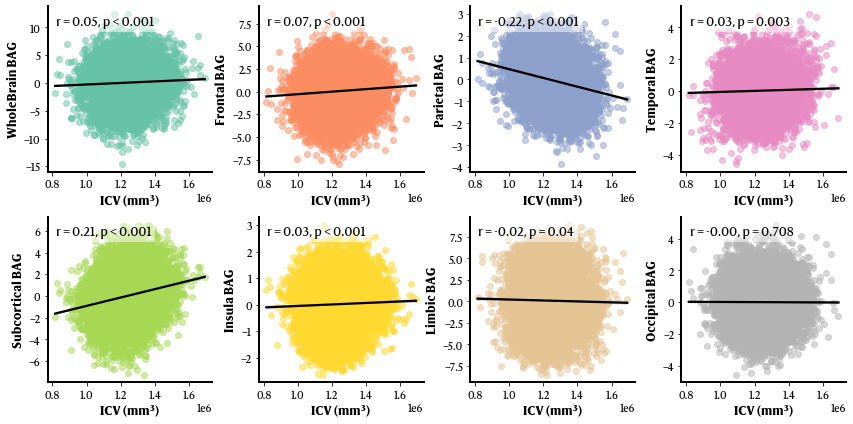

In [72]:
# load the brain volume data.
icv_df = pd.read_csv(f"{output_dir}/icv_volumes.csv")
icv_df.columns = ["sid", "ICV"]

# load whole-brain BAG
bag_wholebrain_df = pd.read_csv(f"{output_dir}/brainAgeGaps.csv")
#bag_wholebrain_df = bag_wholebrain_df[["sid", "BAG_WholeBrain", "BAG_"]]

# merge the two dataframes on 'sid'
icv_bag_df = pd.merge(icv_df, bag_wholebrain_df, on="sid")

regions=['BAG_WholeBrain_Corrected', 'BAG_Frontal_Corrected',
        'BAG_Parietal_Corrected', 'BAG_Temporal_Corrected',
        'BAG_Subcortical_Corrected', 'BAG_Insula_Corrected',
        'BAG_Limbic_Corrected', 'BAG_Occipital_Corrected']

# Create scatter plots (2 x 4) of ICV vs BAG for each region.
fig, ax = plt.subplots(2, 4, figsize=(12, 6))
axs = ax.flatten()

for i, region in enumerate(regions):
    sns.regplot(x="ICV", y=region, data=icv_bag_df, ax=axs[i], scatter_kws={"alpha": 0.5, "color": cmap[i]}, line_kws={"color": "black"})
    axs[i].set_xlabel("ICV (mm³)", fontsize=12, fontweight='bold')
    axs[i].set_ylabel(f"{region.split('_')[1]} BAG", fontsize=12, fontweight='bold')
    r, pval = scipy.stats.pearsonr(icv_bag_df["ICV"], icv_bag_df[region])
    pvalues = f"< {round(pval) + 0.001}" if pval < 0.001 else f"= {round(pval, 3)}"
    axs[i].text(0.05, 0.95, f"r = {r:.2f}, p {pvalues}", transform=axs[i].transAxes,
                fontsize=12, verticalalignment="top", horizontalalignment="left",
                bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))
    axs[i].spines[['top', 'right']].set_visible(False)
    axs[i].spines[['left', 'bottom']].set_linewidth(2)
    axs[i].tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()
plt.savefig(f"{output_dir}/icv_vs_bag_scatterplots.png", dpi=300, facecolor='white', bbox_inches='tight')